In [1]:
import sys
sys.path.insert(0, './CSHMM-for-time-series-scRNA-Seq/')
import pandas as pd
import os
import subprocess
import numpy as np

In [2]:
# load this before loading the pickled because otherwise it don't load correctly
def dictlambda():
    return []


In [3]:
import scdiff_init
import CSHMM_train
import CSHMM_analysis


In [4]:
data_file = 'data/tcell_data.E'
model_file = 'TRAIN_OUTPUT/cv/tcell_data_slurm_it9.pickle'
markers = 'top_markers.csv'

plotting path figure for model file:  TRAIN_OUTPUT/cv/tcell_data_slurm_it9.pickle
loading model from file:  TRAIN_OUTPUT/cv/tcell_data_slurm_it9.pickle
loading data......
1922  cell loaded with  8846  genes selected
structure.png


<Figure size 720x504 with 0 Axes>

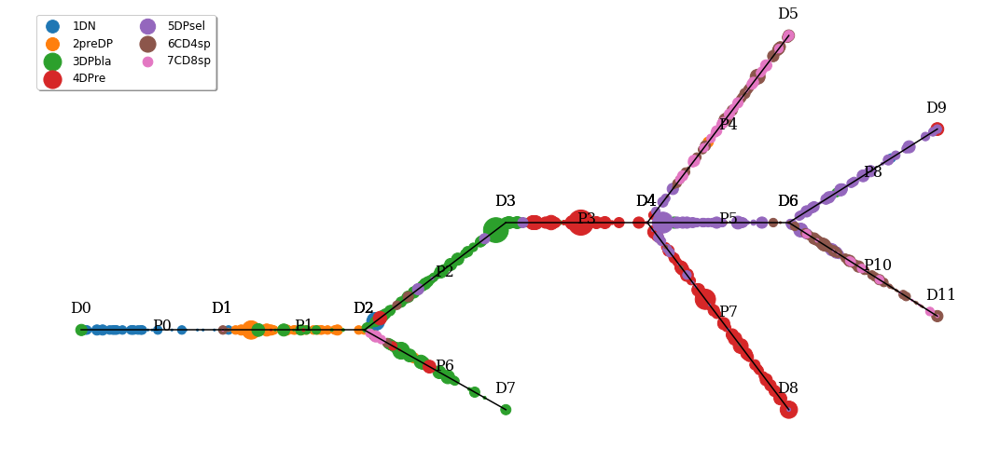

In [7]:
CSHMM_analysis.plot_path_fig(model_file, data_file, circle_size = 85)

In [31]:
CSHMM_analysis.marker_gene_list,CSHMM_analysis.marker_genes_dict =CSHMM_analysis.init_marker_gene_dict(markers)
CSHMM_analysis.mkgene_dict = CSHMM_analysis.marker_genes_dict

# THIS WILL OVERWRITE WHATEVER IS IN THE OUTPUT FOLDER

In [32]:
# generate go analysis for each path

model_temp = CSHMM_analysis.analyze_gene(model_file, data_file, out_folder = 'ANALYSIS_OUTPUT/nocv_it9_top')


analyzing for model file:  TRAIN_OUTPUT/cv/tcell_data_slurm_it9.pickle
loading model from file:  TRAIN_OUTPUT/cv/tcell_data_slurm_it9.pickle
loading data......
1922  cell loaded with  8846  genes selected
rm -rf ANALYSIS_OUTPUT/nocv_it10_top
mkdir ANALYSIS_OUTPUT/nocv_it10_top
path:  0_1_2_3_4
path:  0_1_6
path:  0_1_2_3_7
path:  0_1_2_3_5_8
path:  0_1_2_3_5_10


In [23]:
def get_major_cell_types(model_ana_temp):
    #print model_ana_temp['hid_var'].keys()
    cps=model_ana_temp['hid_var']['cell_path']
    cls=model_ana_temp['hid_var']['cell_labels']
    cot=model_ana_temp['hid_var']['cell_ori_time']
    #print cot
    cls_2=np.array(map(lambda x:x[0]+'_16' if x[1]==16 and x[0] =='NA' else x[0], zip(cls,cot)))
    #print cls_2
    ret=[]
    for p in range(max(cps)+1):
        #print p
        #print cls_2[cps==p]
        if cls_2[cps==p].shape[0]==0:
            ret+=['X']
            continue
        lab,cnt=np.unique(cls_2[cps==p],return_counts=True)
        print p, lab
        
#         if '6CD4sp' in lab:
#             ret+=['6CD4sp']
#         elif '7CD8sp' in lab:
#             ret+=['7CD8sp']
#         else:
        ret +=[ lab[cnt==max(cnt)][0]]            
#         if 'd5_earlyiN' in lab:
#             ret+=['d5_earlyiN']
#         elif 'd5_failedReprog' in lab:
#             ret+=['d5_failedReprog']
#         else:
#             ret +=[ lab[cnt==max(cnt)][0]]
    return ret

In [24]:
def plot_cont_marker_gexp(model_ana_temp,remove_path,rescale=True):
    gene_names=model_ana_temp['gene_names']
    p_gt_dict=model_ana_temp['p_gt_dict']
    p_ge_dict=model_ana_temp['p_ge_dict']
    full_ts_es_dict=model_ana_temp['full_ts_es_dict']
    mk_gene_dict=model_ana_temp['mk_gene_dict']
    mk_gene_list=model_ana_temp['mk_gene_list']

    model = model_ana_temp['model']
    path_info = model['path_info']
    out_folder = model_ana_temp['out_folder']
    print mk_gene_list
    max_level= float(max([p['level'] for p in path_info]))+1
    
    path_cell_lab = get_major_cell_types(model_ana_temp)
    print 'mk_gene_list:',mk_gene_list
    for mk_gene in mk_gene_list[:]:
        if mk_gene not in gene_names.tolist():
            continue
        print mk_gene,mk_gene_dict[mk_gene]
        g_idx = gene_names.tolist().index(mk_gene)
        plt.clf()
        fig = plt.figure("all",figsize=(15,10))
        fig2= plt.figure("4th",figsize=(7,5),tight_layout=True)
        
        plt1 = fig.add_subplot(2,2,4)
        plt2 = fig.add_subplot(2,2,3)
        plt3 = fig.add_subplot(2,2,1)
        plt4 = fig.add_subplot(2,2,2)
        
        for key,val in full_ts_es_dict.items():
            if key == remove_path:
                continue

            x=val[0][g_idx]
            y=val[1][g_idx]
            px=[]
            py=[]
            for p in key:
                x1=path_info[p]['level']
                x2=path_info[p]['level']+1
                y1=model['g_param'][path_info[p]['Sp_idx']][g_idx]
                y2=model['g_param'][path_info[p]['Sc_idx']][g_idx]

                px += np.linspace(x1, x2, num=10, endpoint=True).tolist()
                py += np.linspace(y1, y2, num=10, endpoint=True).tolist()
 
            for tx,ty in zip(x,y):
                if ty==0:
                    continue
                px+=[tx]
                py+=[ty]

            xnew = np.linspace(min(px), max(px), num=100, endpoint=True)
            poly = np.poly1d(np.polyfit(px, py, 4))

            ynew=poly(xnew)

            if rescale:
                xnew=[_/float(len(key)) for _ in xnew]
            plt.figure('all')
            plt1.plot(xnew, ynew, '-',label = str([_ for _ in reversed(list(key))]))
            plt.figure('4th')
            plt.plot(xnew, ynew, '-',label = str([_ for _ in reversed(list(key))])+' '+path_cell_lab[key[0]])

        plt.figure('all')
        plt.xticks( fontsize = 12)
        plt.yticks( fontsize = 12)
        plt1.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize = 12)
        plt1.set_title("continuous poly d4 interpolation", fontsize = 20)

        plt.figure('4th')
        plt.xticks(fontsize = 16)
        plt.yticks(fontsize = 16)

        plt.figure('all')

        for index,path in enumerate(model['path_info']):
            if index not in p_gt_dict.keys():
                continue
            x1, y1 = [path['level'], path['level']+1], [model['g_param'][path['Sp_idx']][g_idx],model['g_param'][path['Sc_idx']][g_idx]] 
            
            plt2.plot(x1, y1, marker = 'o',label=path['ID'])
            x = np.array(p_gt_dict[index][g_idx])
            y = np.array(p_ge_dict[index][g_idx])

            plt3.plot(x, y, 'o',label=path['ID'])
            
            x_n0_add_line=[]
            y_n0_add_line=[]
            for tx,ty in zip(x,y):
                if ty==0:
                    continue
                x_n0_add_line+=[tx]
                y_n0_add_line+=[ty]
                
            x1=path['level']
            x2=path['level']+1
            y1=model['g_param'][path['Sp_idx']][g_idx]
            y2=model['g_param'][path['Sc_idx']][g_idx]    
            
            x_n0_add_line += np.linspace(x1, x2, num=10, endpoint=True).tolist()
            y_n0_add_line += np.linspace(y1, y2, num=10, endpoint=True).tolist()
            
            plt4.plot(x_n0_add_line, y_n0_add_line, 'o',label=path['ID'])
            
        plt2.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize = 12)
        plt3.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize = 12)
        plt4.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize = 12)
        plt2.set_title("discrete gene expression", fontsize = 20)
        plt3.set_title("original dataset", fontsize = 20)
        plt4.set_title("modified dataset for interpolation", fontsize = 20)

        fig=plt.figure('all')
        fig.subplots_adjust(wspace=0.4)
        fig2=plt.figure('4th')
        filename=out_folder+'/'+mk_gene+"_"+mk_gene_dict[mk_gene][0].replace("|","_")+'_continuous_all.png'

        print filename
        
#         fig.savefig(filename, bbox_inches='tight')
        
        filename=out_folder+'/'+mk_gene+"_"+mk_gene_dict[mk_gene][0].replace("|","_")+'_continuous_4th_nolegend.png'

        print filename
#         fig2.savefig(filename, bbox_inches='tight')
        
        plt.figure('4th')
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize = 12)
        plt.title("continuous poly d4 interpolation", fontsize = 20)
        
        plt.xlabel("time",fontsize=15)
        plt.ylabel("gene expression",fontsize=15)
        fig3=plt.figure('4th')
        #fig3.savefig(out_folder+'/'+mk_gene+"_"+mk_gene_dict[mk_gene][0]+'_continuous_4th.png', bbox_inches='tight')
        filename=out_folder+'/'+mk_gene+"_"+mk_gene_dict[mk_gene][0].replace("|","_")+'_continuous_4th.png'
  
        print filename
#         fig3.savefig(filename, bbox_inches='tight')
        
        plt.figure('4th')
        plt.show()
        plt.close('all')


In [21]:
import numpy as np
import matplotlib
matplotlib.use('Agg')
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout
import matplotlib.pyplot as plt
from collections import defaultdict
import os
import pandas as pd
import scipy
import pygraphviz as PG
import matplotlib.image as mpimg
from scipy.interpolate import UnivariateSpline
from scipy.interpolate import CubicSpline,splrep,BSpline
from math import acos
from math import sqrt
from math import pi

['Ctla2a', 'Tesc', 'Asf1b', 'Top2a', 'B2m', 'Tmsb10', 'Klf2', 'Hes1', 'Ctsw', 'Gnl3', 'H2-D1', 'Ccna2', 'Gzma', 'Cenpf', 'Hspd1', 'Dctpp1', 'Rrm2', 'Prc1', 'Odc1', 'Pbk', 'Nkg7', 'Hmmr', 'Cdc25b', 'Timm8a1', 'Ccnb1', 'Il2ra', 'Plac8', 'Runx3', 'Neil3', 'Aurkb', 'Tk1', 'Pclaf', 'Tcf19', 'Spc25', 'Spc24', 'Hells', 'Tmsb4x', 'Hist1h2ap', 'Srm', 'Ung', 'Hist1h2ae', 'Hist1h2af', 'Mxd3', 'Gmnn', 'Hist1h1b', 'Ifitm2', 'Clspn', 'Esco2', 'Ccnd2', 'Myl10', 'Tyms', 'Tubb2b', 'Slbp', 'Ranbp1', 'Dtl', 'Ccne2', 'E2f8', 'Itm2a', 'Ccr7', 'Gimap4', 'Nusap1', 'Dhfr', 'Cdc20', 'Fbxo5', 'Gar1', 'Gm5111', 'Cdkn2c', 'Mis18bp1', 'Rfc3', 'Mif', 'Apex1', 'Cdca3', 'Tcrg-C1', 'Cdca8', 'Tcrg-C2', 'Npm1', 'Tcrg-C4', 'Cd52', 'Cd53', 'H2-K1', 'Tuba1c', 'Cd8b1', 'Shisa5', 'Ms4a4b', 'Ifi27l2a', 'Snhg4', 'Pcna', 'Eif5a']
0 ['1DN' '3DPbla']
1 ['1DN' '2preDP' '3DPbla' '4DPre' '6CD4sp' '7CD8sp']
2 ['1DN' '3DPbla' '4DPre' '5DPsel' '6CD4sp']
3 ['3DPbla' '4DPre' '5DPsel']
4 ['2preDP' '4DPre' '5DPsel' '6CD4sp' '7CD8sp']
5 ['2

<Figure size 432x288 with 0 Axes>

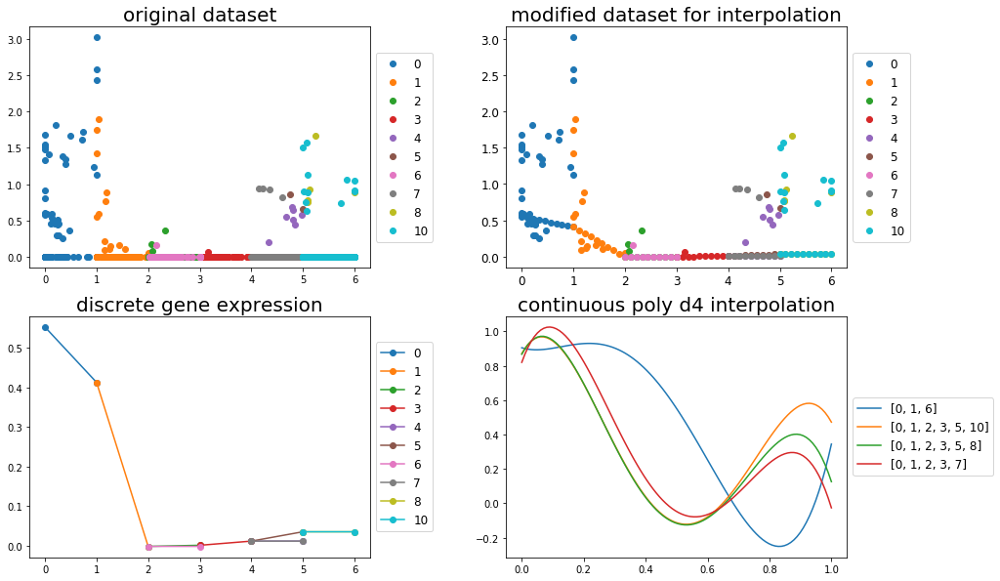

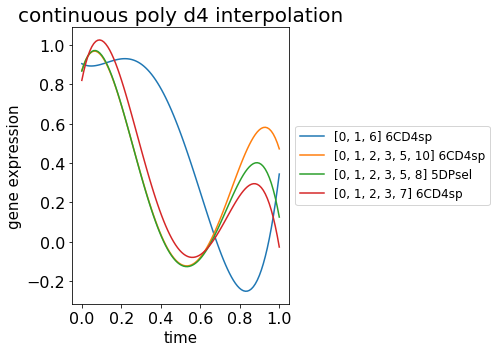

Tesc 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Tesc_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tesc_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tesc_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

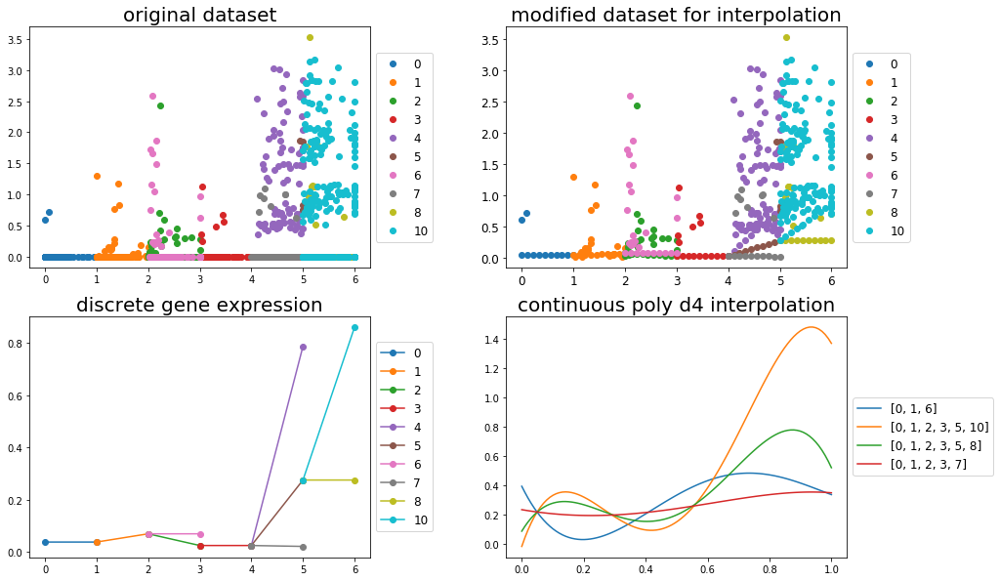

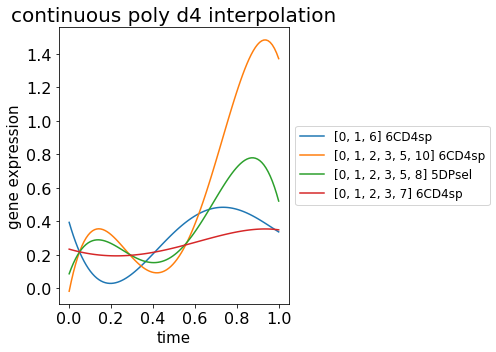

Asf1b 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Asf1b_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Asf1b_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Asf1b_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

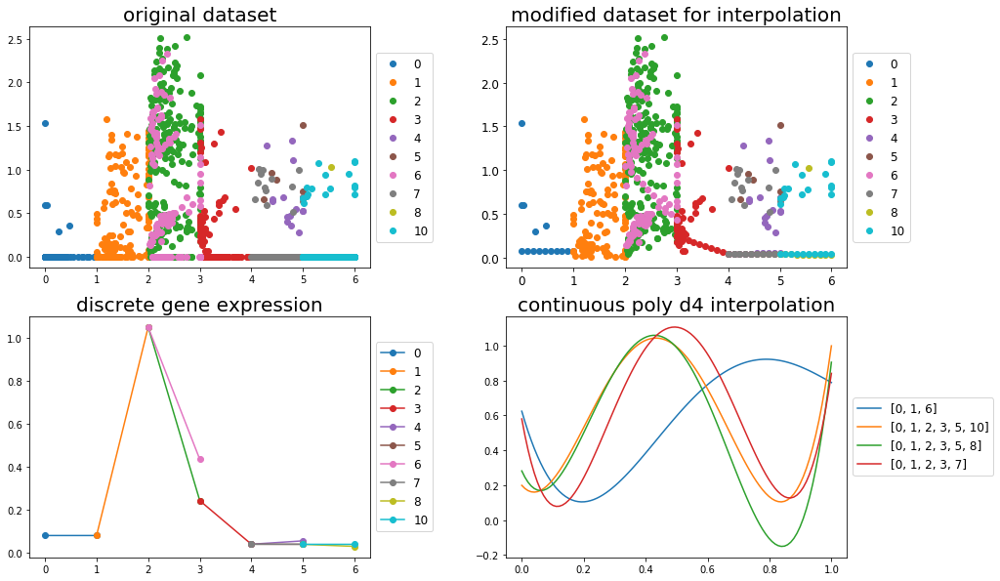

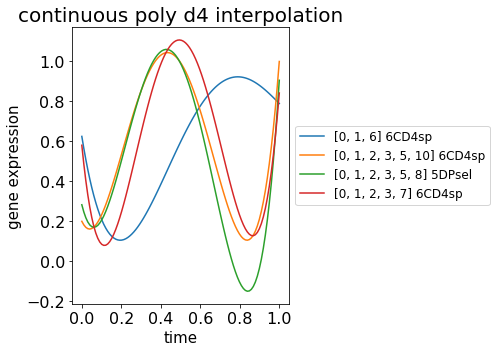

Top2a 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Top2a_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Top2a_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Top2a_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

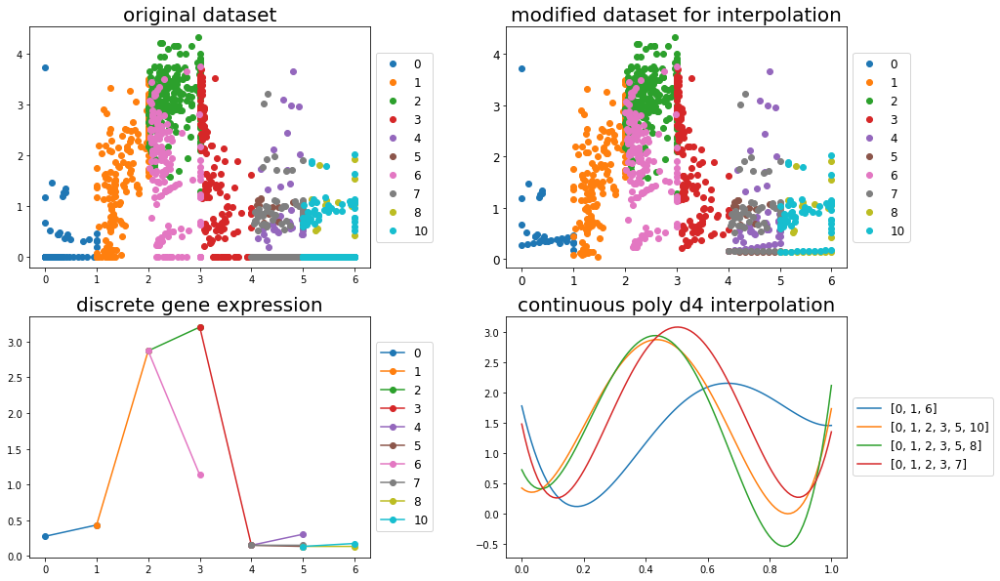

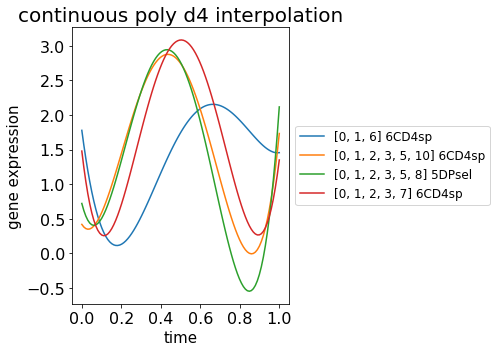

B2m 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/B2m_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/B2m_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/B2m_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

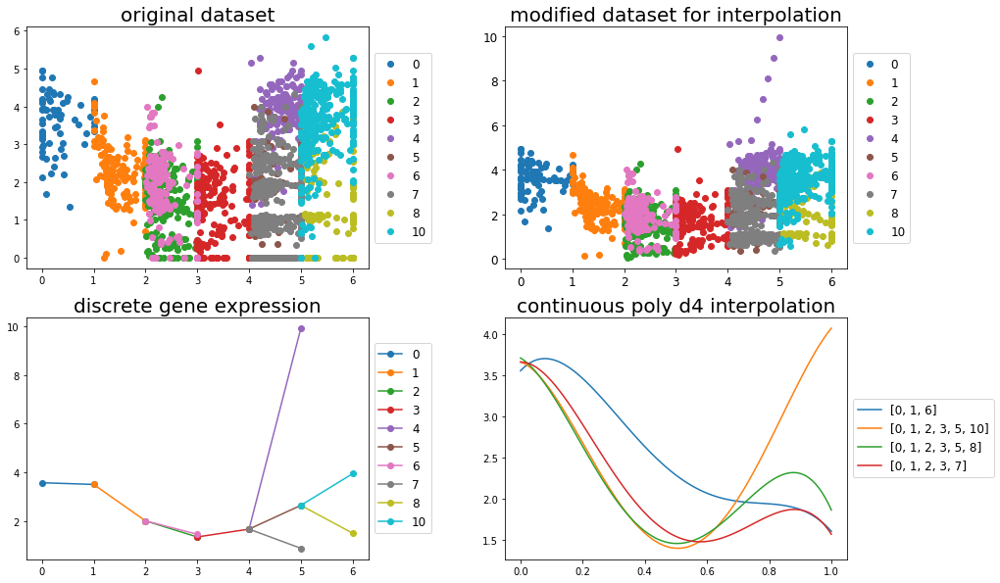

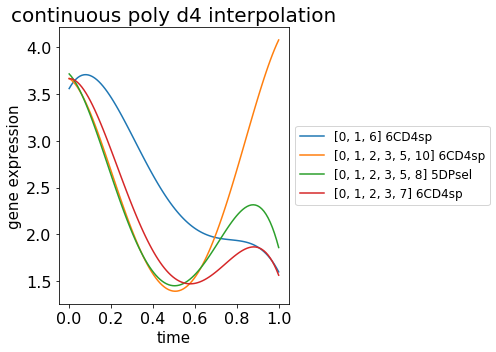

Tmsb10 5DPsel
ANALYSIS_OUTPUT/nocv_it10_top/Tmsb10_5_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tmsb10_5_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tmsb10_5_continuous_4th.png


<Figure size 432x288 with 0 Axes>

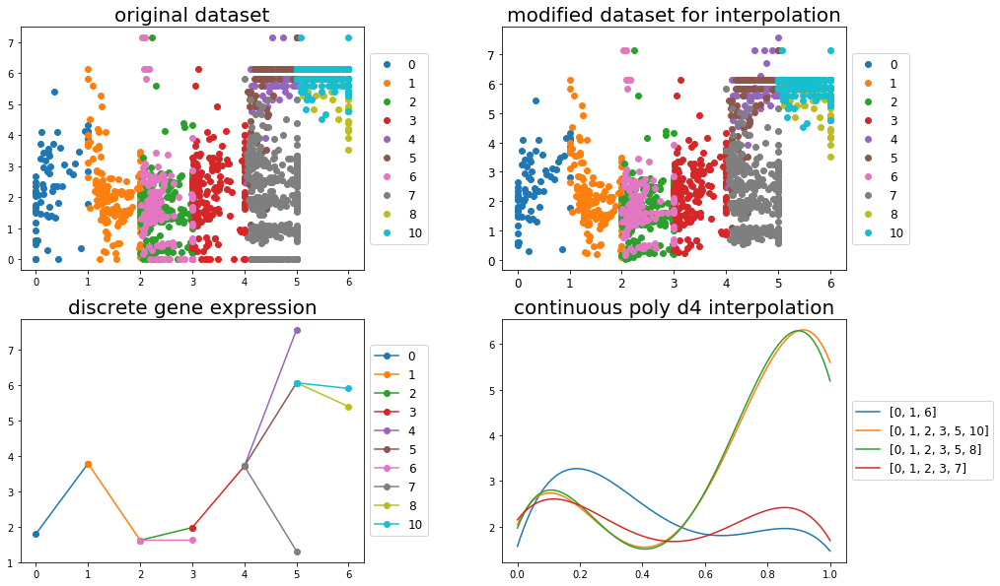

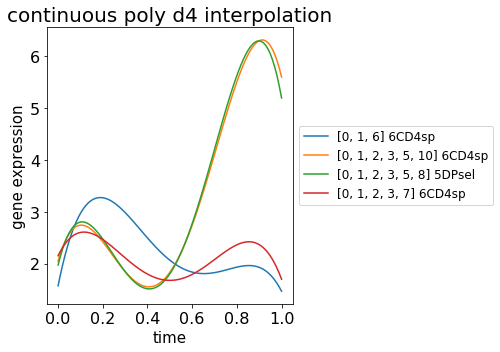

Klf2 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Klf2_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Klf2_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Klf2_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

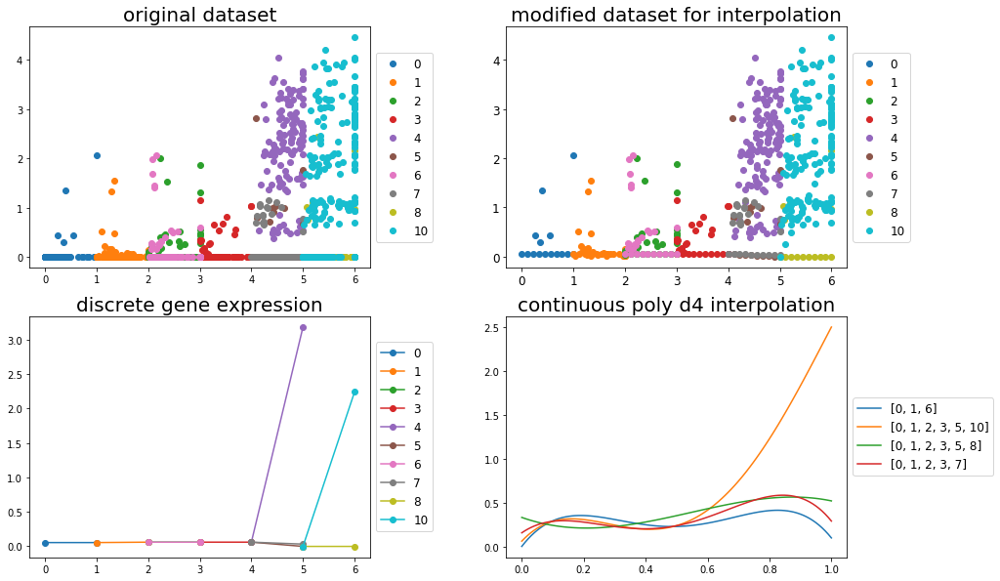

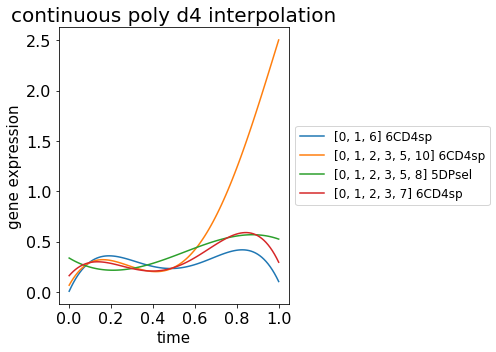

Hes1 1DN
ANALYSIS_OUTPUT/nocv_it10_top/Hes1_1_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Hes1_1_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Hes1_1_continuous_4th.png


<Figure size 432x288 with 0 Axes>

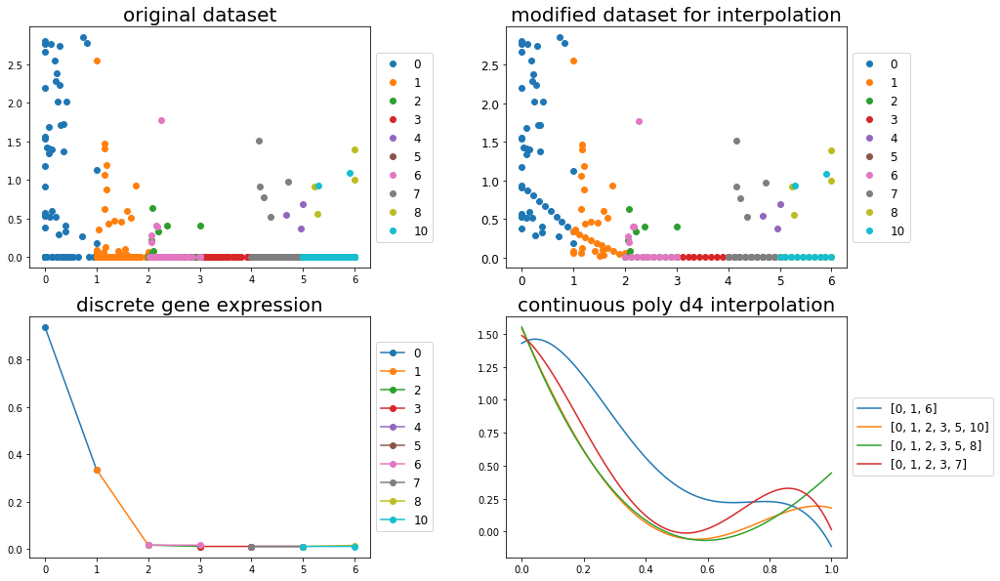

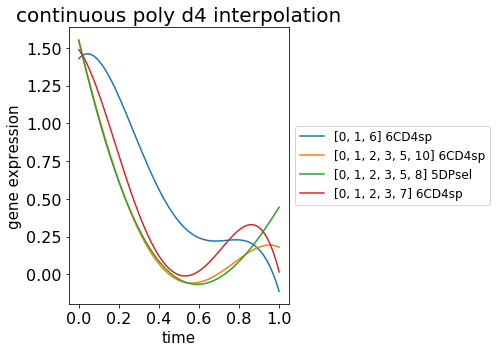

Ctsw 7CD8sp
ANALYSIS_OUTPUT/nocv_it10_top/Ctsw_7_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ctsw_7_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ctsw_7_continuous_4th.png


<Figure size 432x288 with 0 Axes>

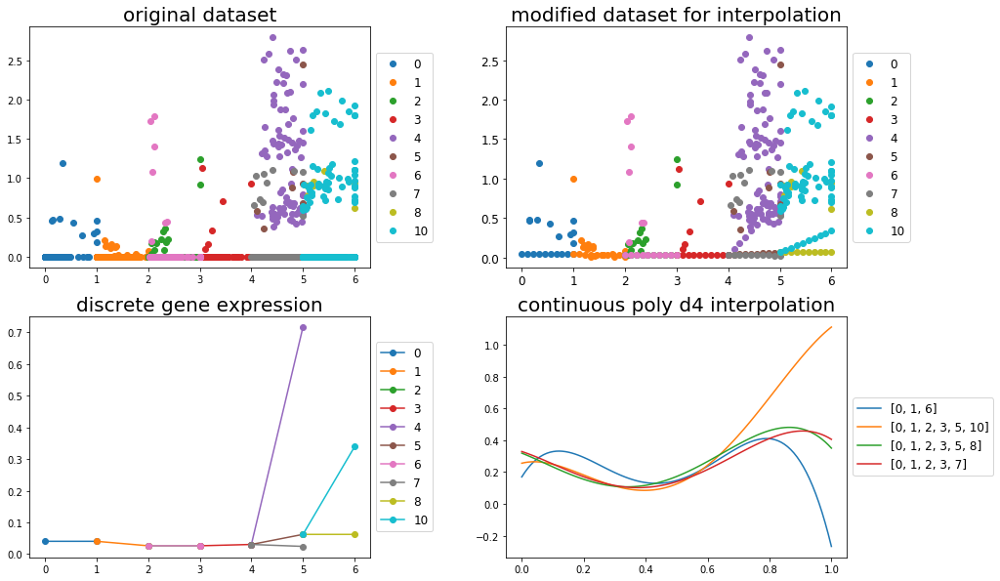

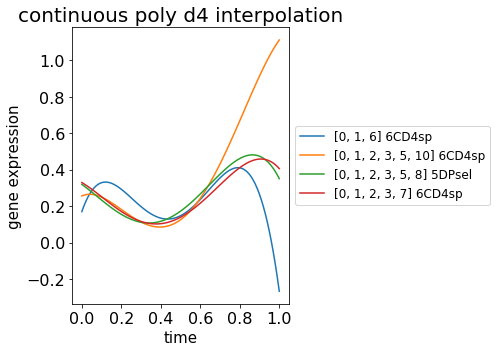

Gnl3 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Gnl3_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Gnl3_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Gnl3_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

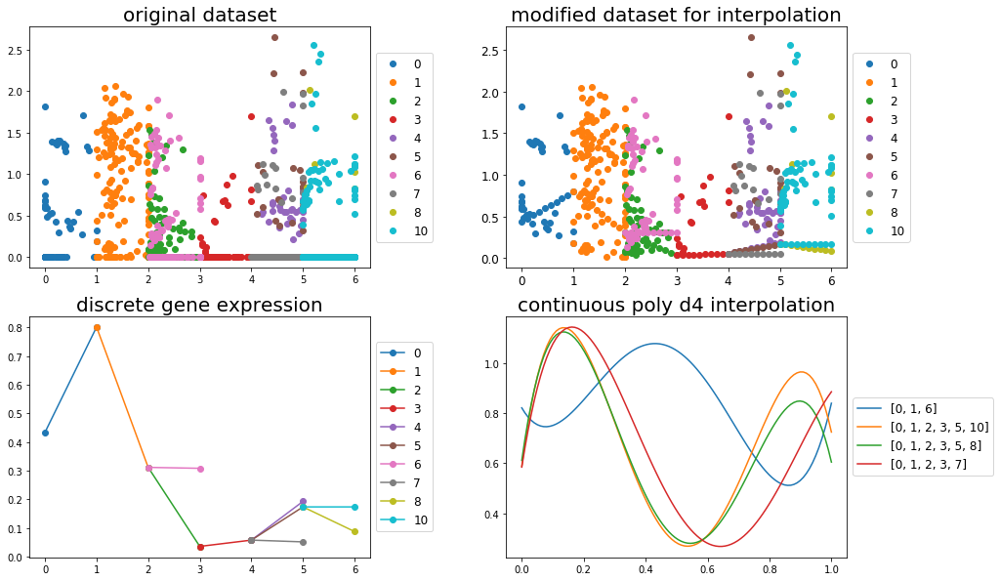

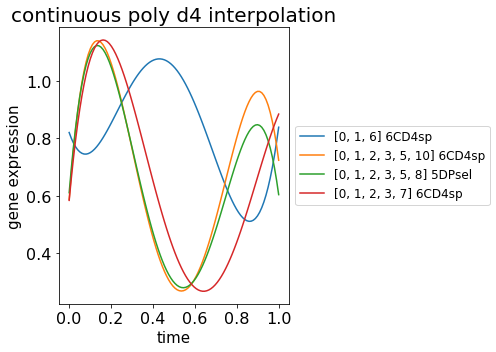

H2-D1 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/H2-D1_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/H2-D1_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/H2-D1_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

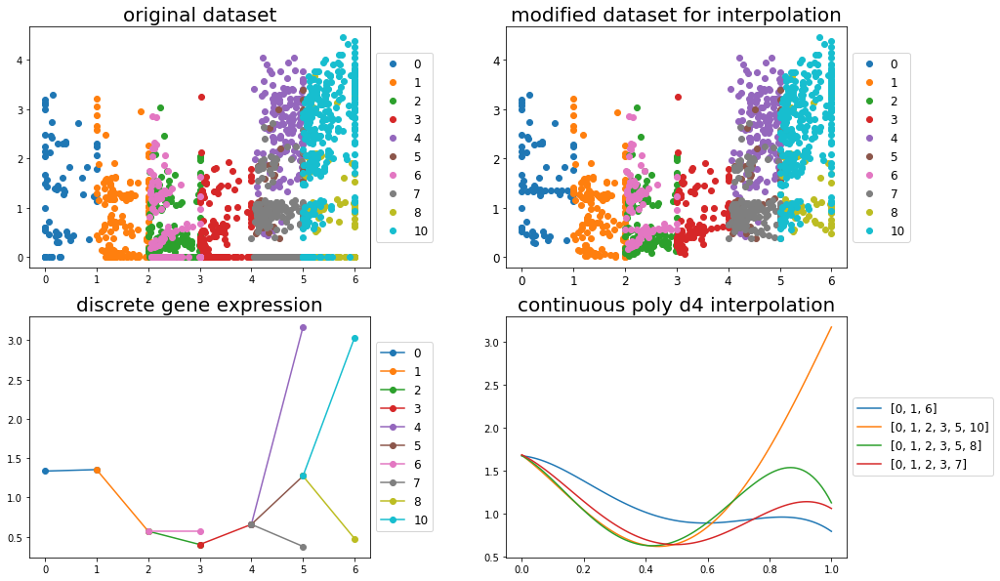

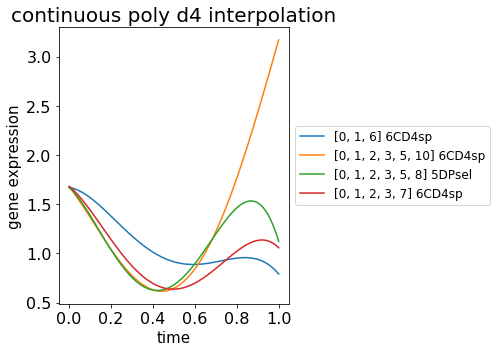

Ccna2 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Ccna2_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccna2_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccna2_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

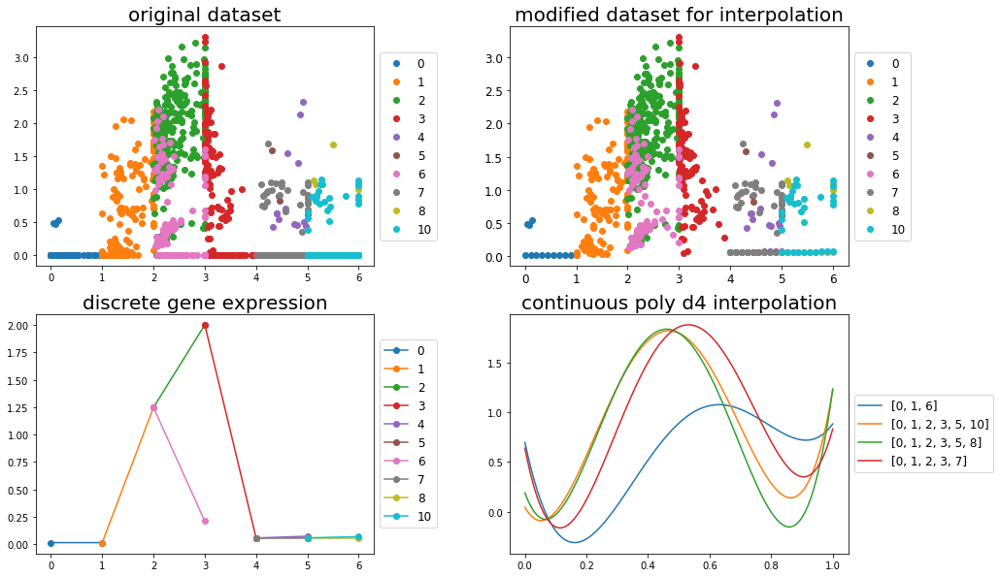

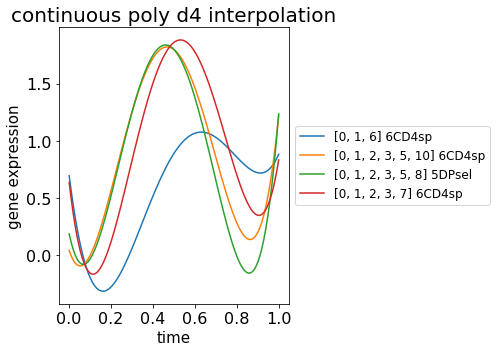

Gzma 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Gzma_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Gzma_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Gzma_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

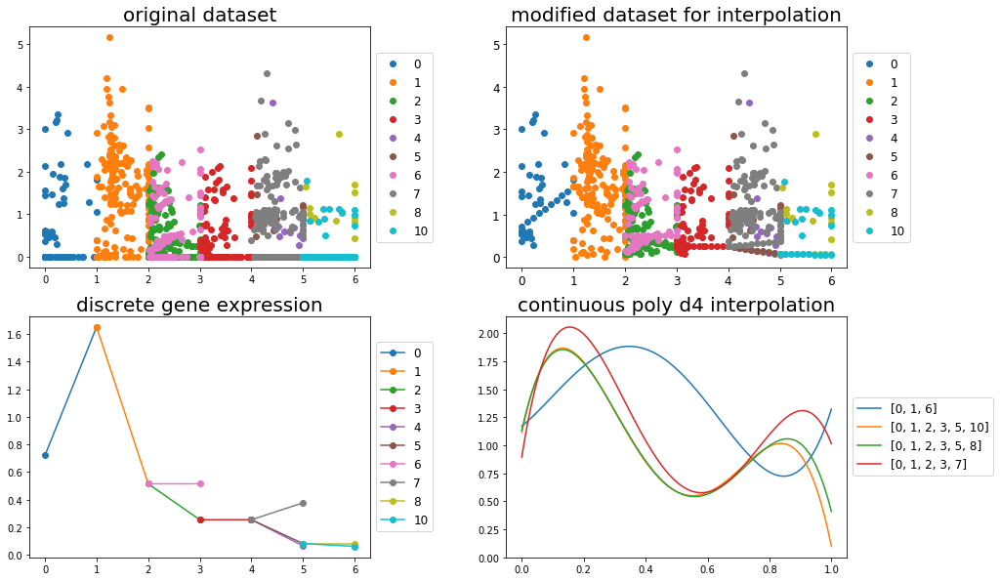

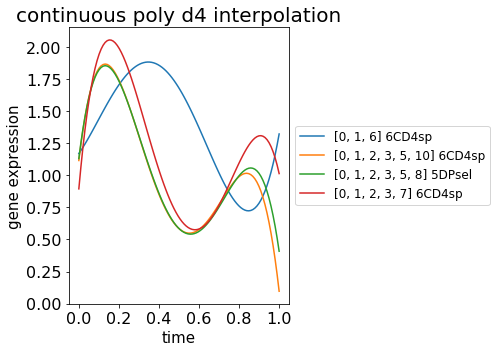

Cenpf 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Cenpf_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Cenpf_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Cenpf_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

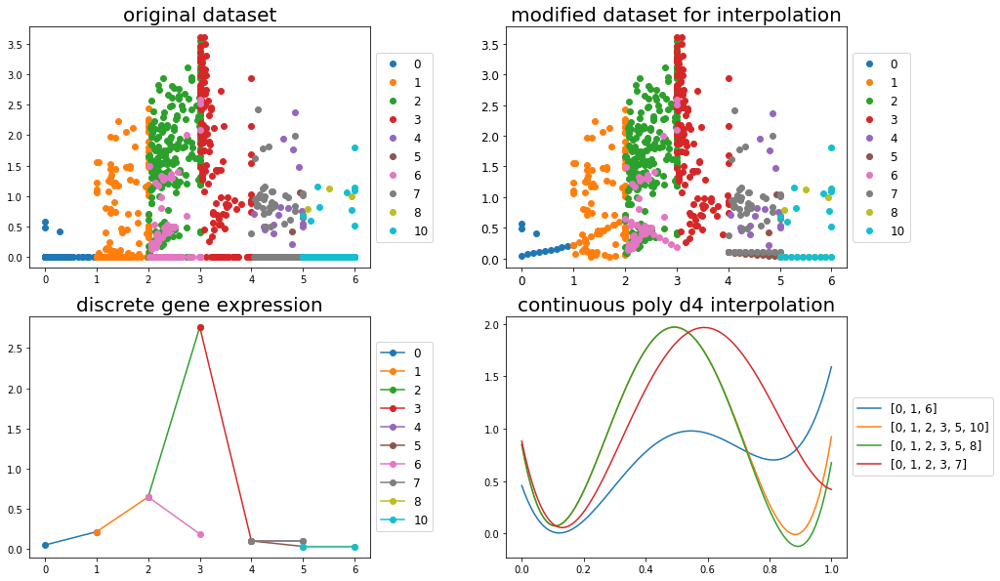

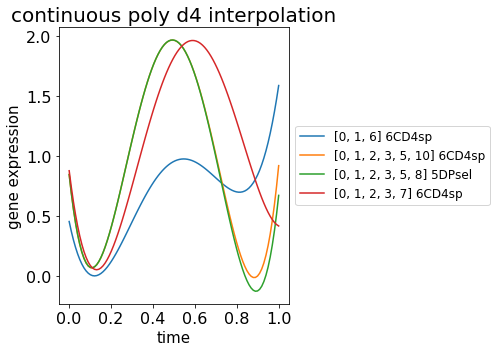

Hspd1 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Hspd1_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Hspd1_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Hspd1_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

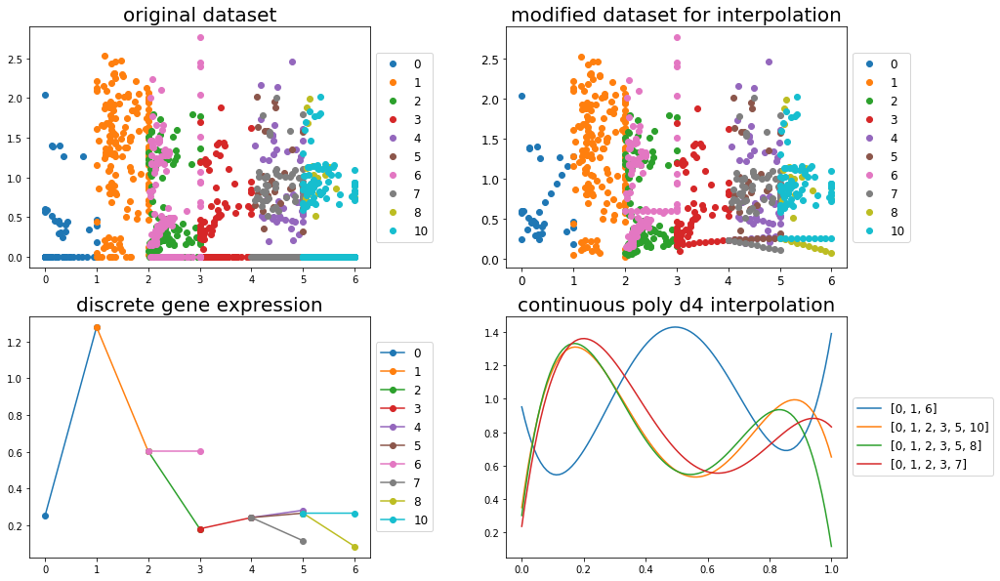

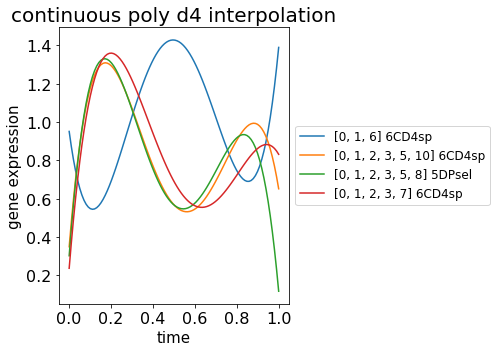

Dctpp1 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Dctpp1_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Dctpp1_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Dctpp1_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

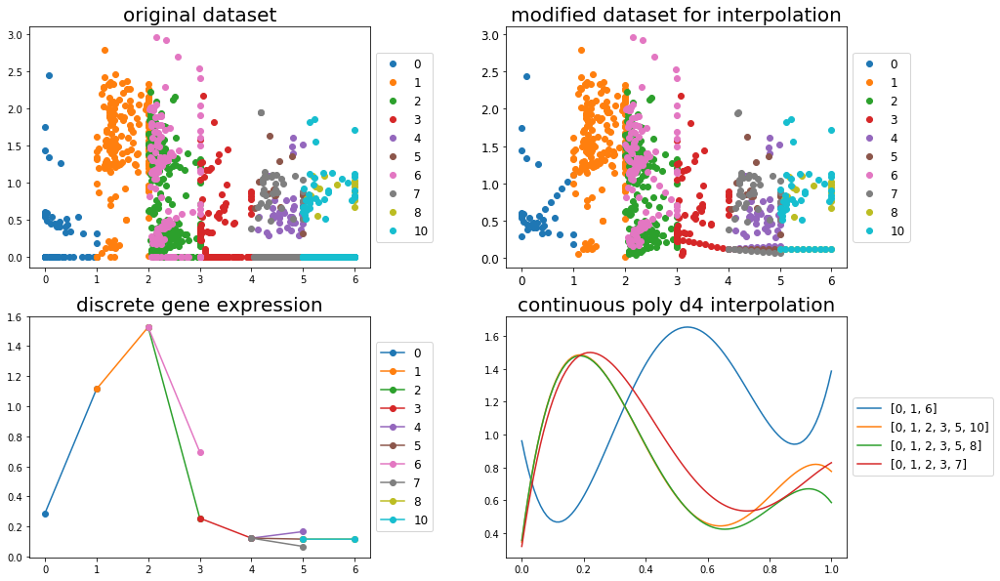

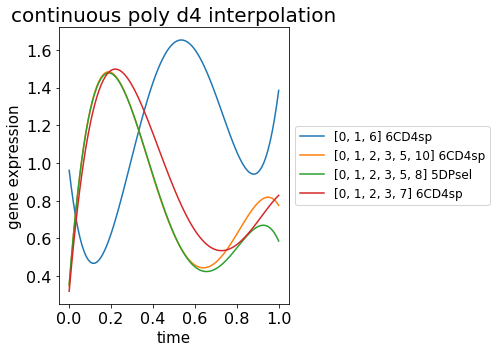

Rrm2 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Rrm2_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Rrm2_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Rrm2_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

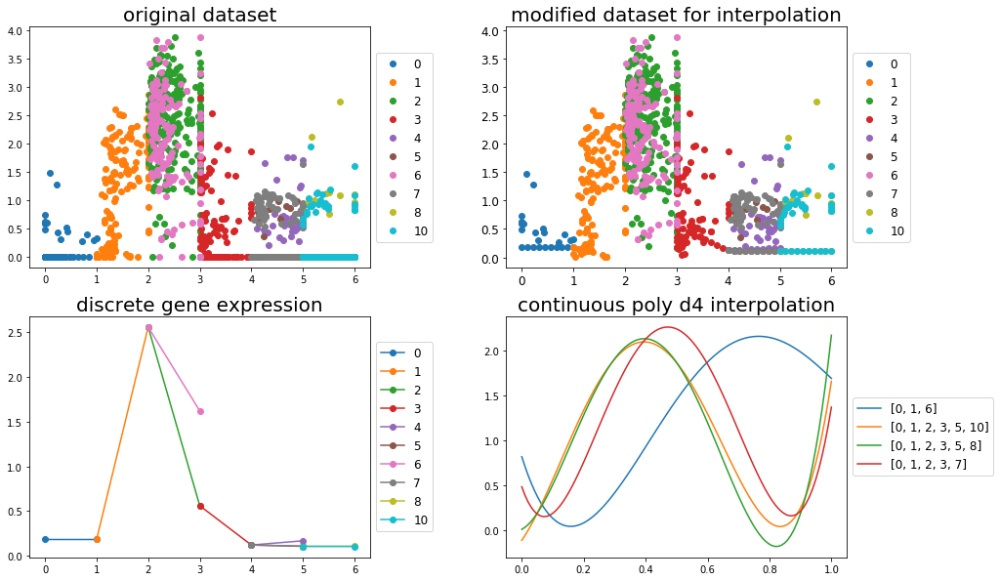

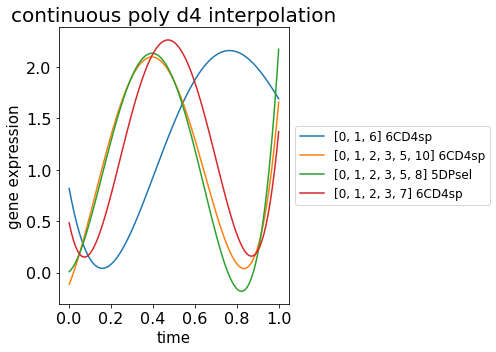

Prc1 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Prc1_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Prc1_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Prc1_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

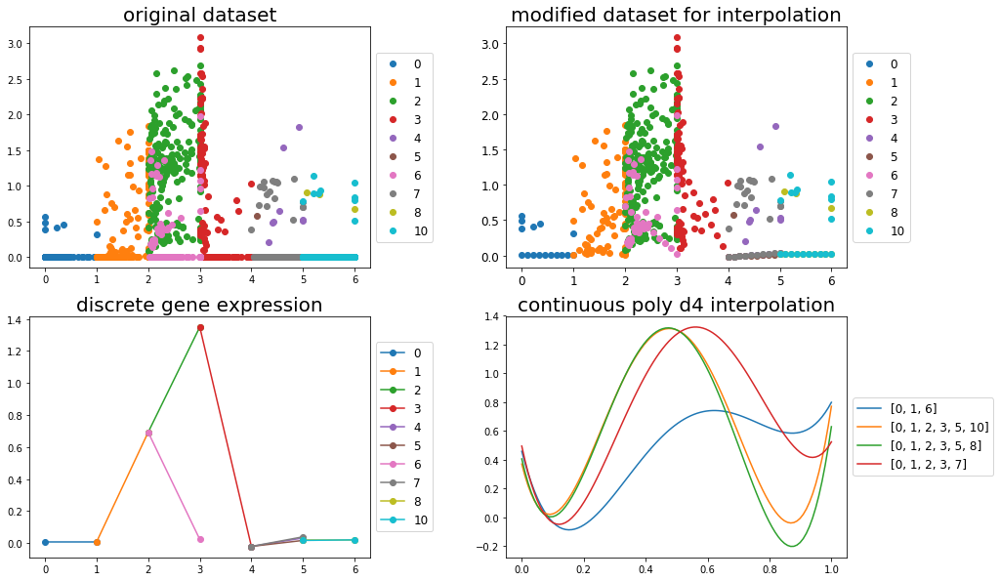

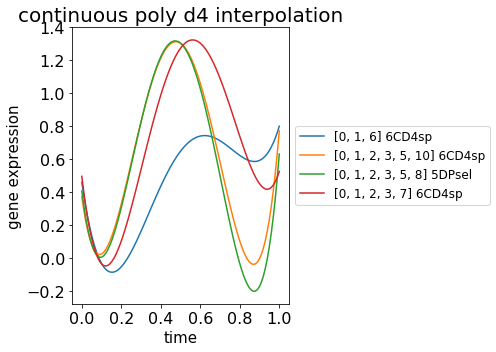

Odc1 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Odc1_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Odc1_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Odc1_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

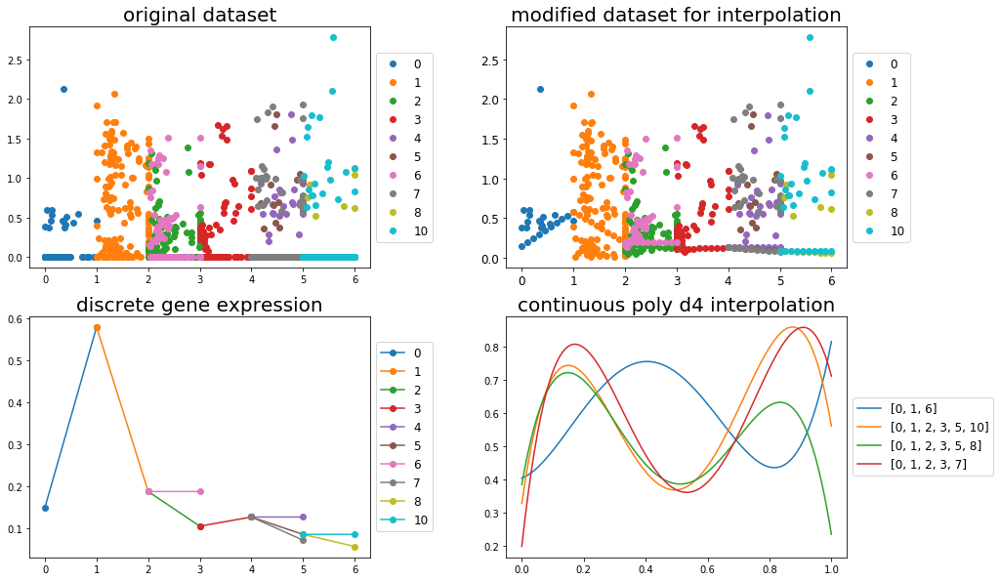

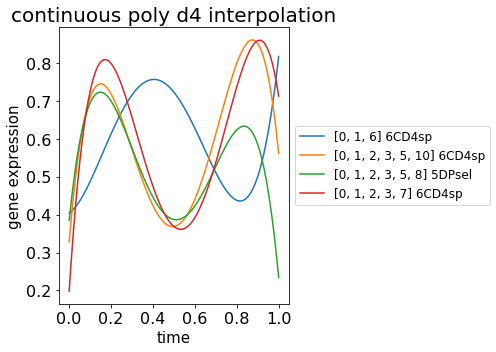

Pbk 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Pbk_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Pbk_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Pbk_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

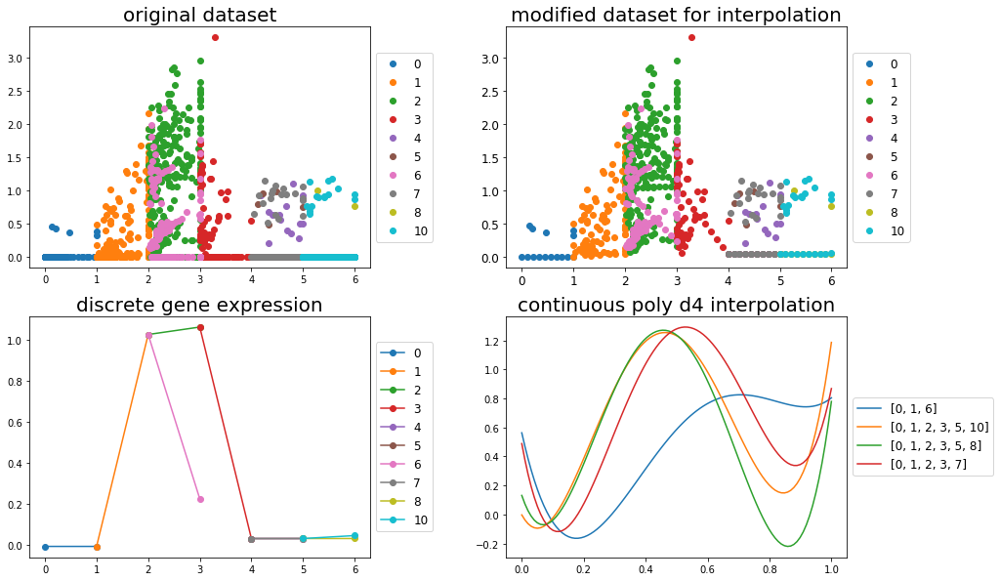

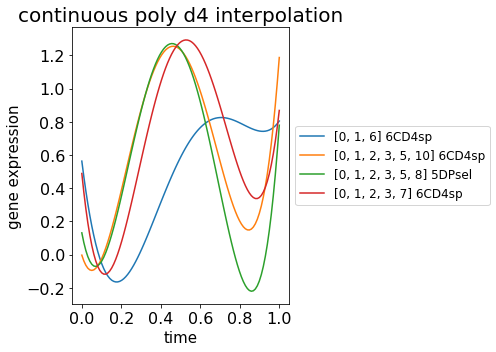

Nkg7 7CD8sp
ANALYSIS_OUTPUT/nocv_it10_top/Nkg7_7_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Nkg7_7_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Nkg7_7_continuous_4th.png


<Figure size 432x288 with 0 Axes>

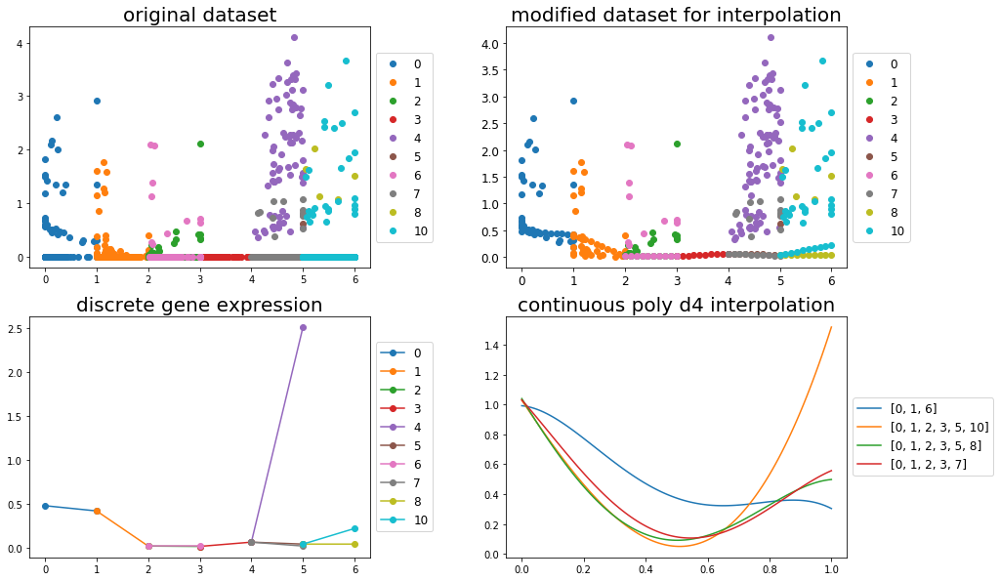

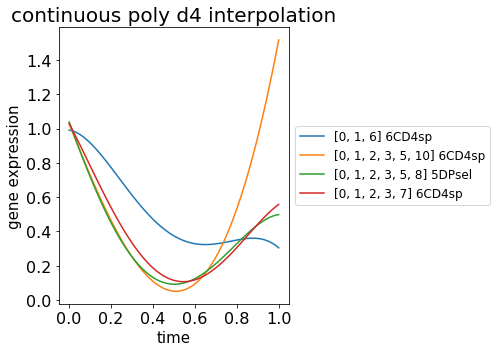

Hmmr 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Hmmr_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Hmmr_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Hmmr_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

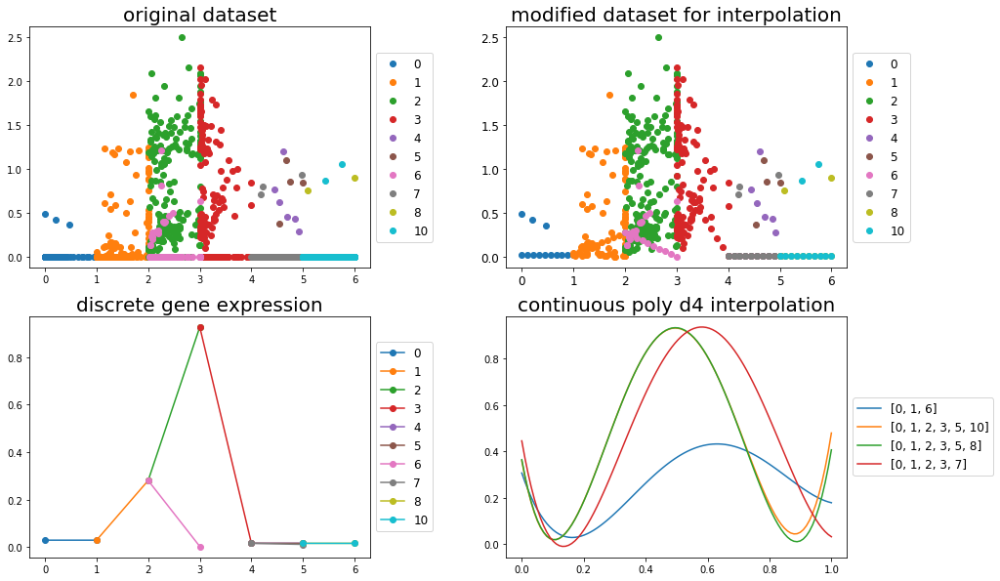

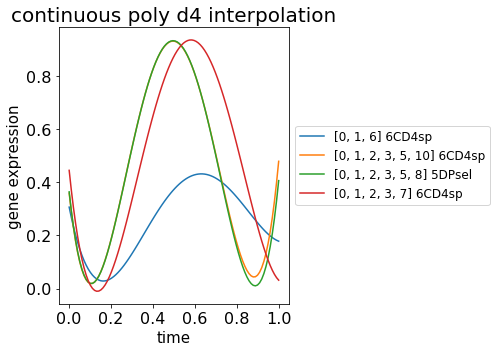

Cdc25b 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Cdc25b_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdc25b_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdc25b_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

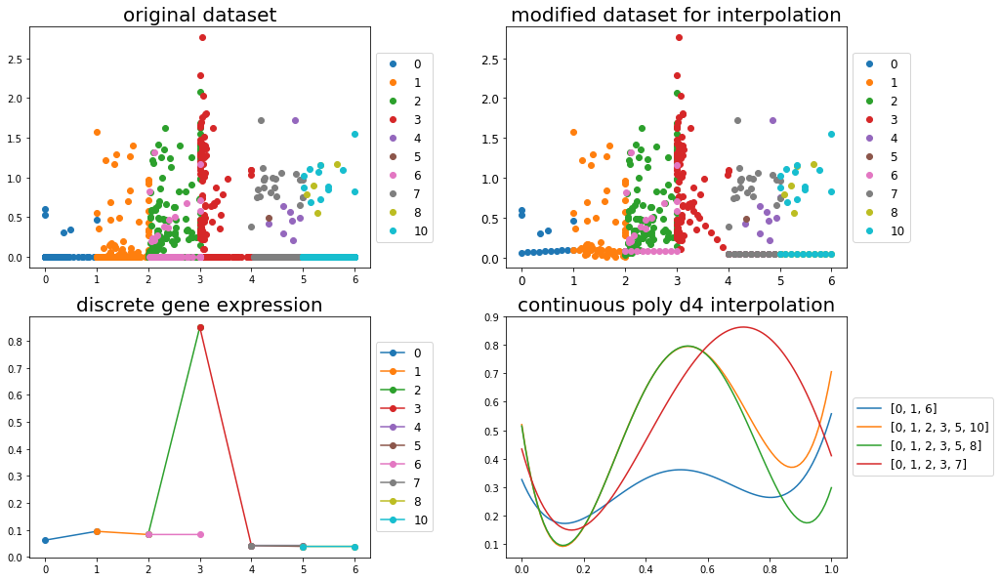

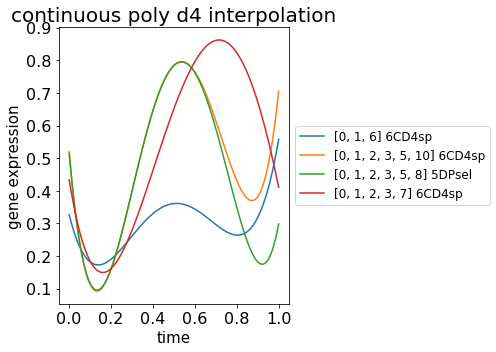

Timm8a1 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Timm8a1_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Timm8a1_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Timm8a1_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

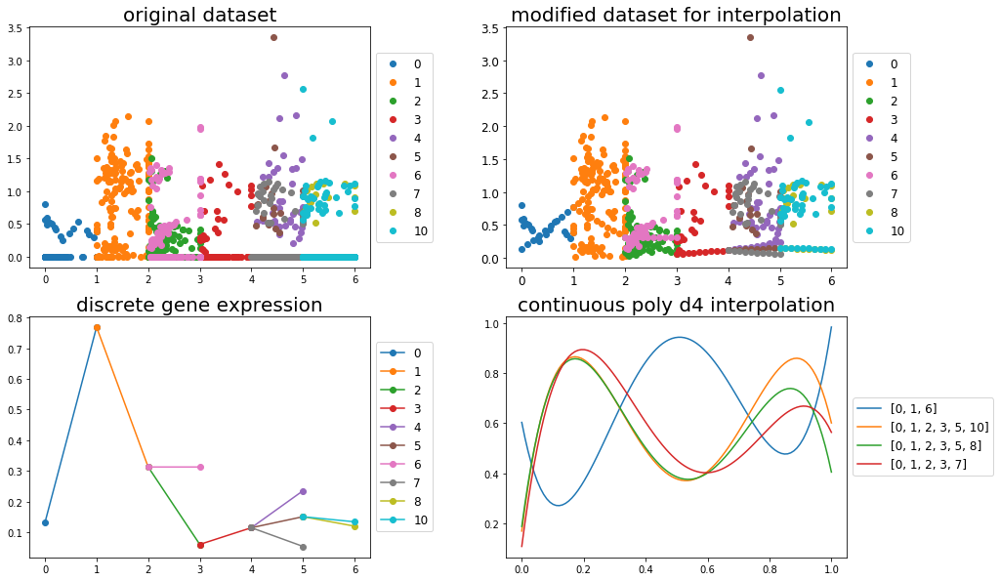

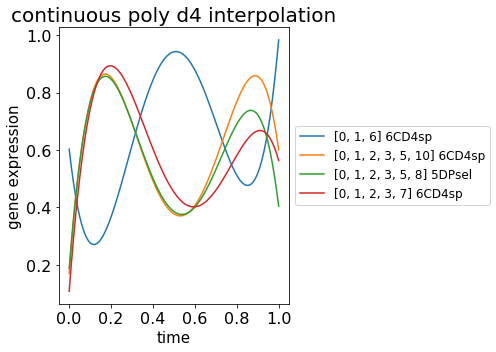

Ccnb1 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Ccnb1_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccnb1_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccnb1_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

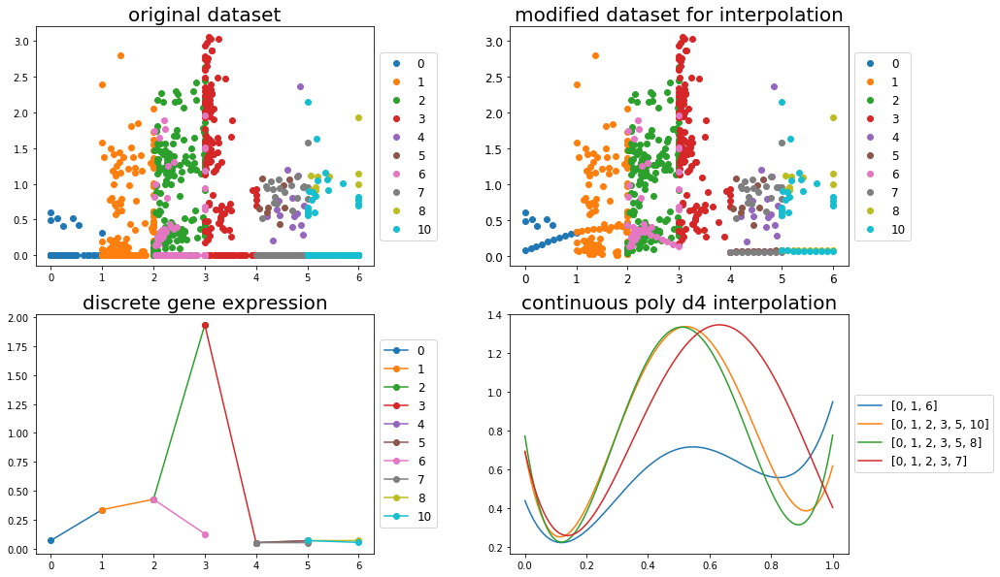

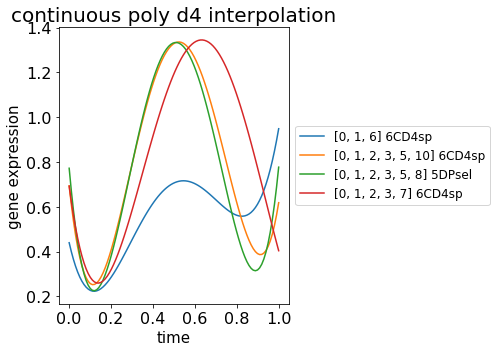

Il2ra 1DN
ANALYSIS_OUTPUT/nocv_it10_top/Il2ra_1_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Il2ra_1_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Il2ra_1_continuous_4th.png


<Figure size 432x288 with 0 Axes>

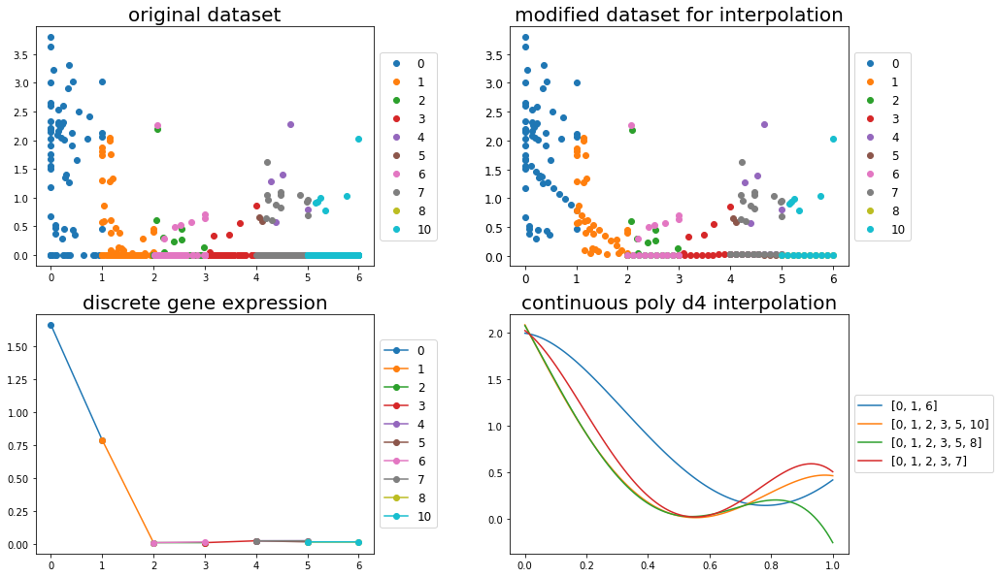

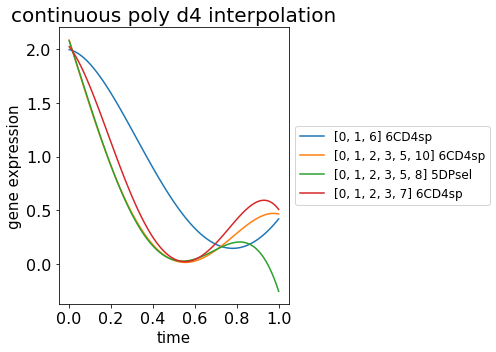

Plac8 1DN
ANALYSIS_OUTPUT/nocv_it10_top/Plac8_1_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Plac8_1_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Plac8_1_continuous_4th.png


<Figure size 432x288 with 0 Axes>

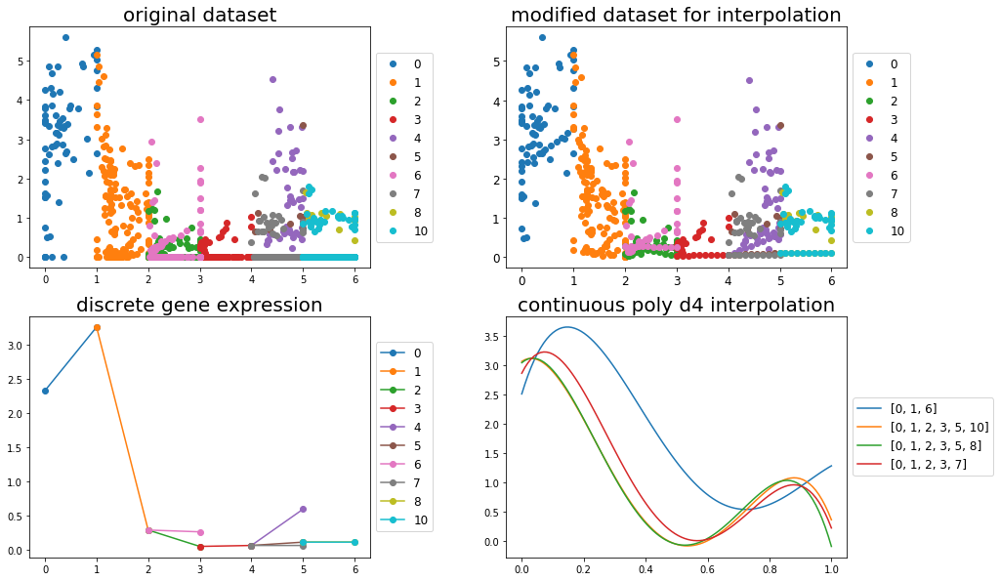

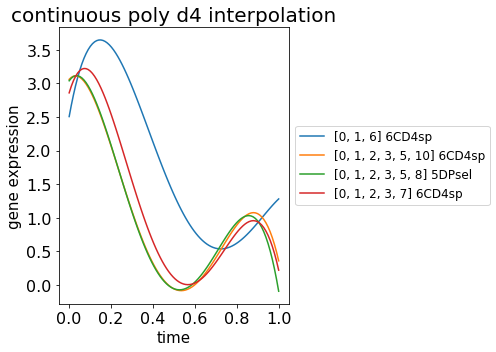

Runx3 7CD8sp
ANALYSIS_OUTPUT/nocv_it10_top/Runx3_7_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Runx3_7_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Runx3_7_continuous_4th.png


<Figure size 432x288 with 0 Axes>

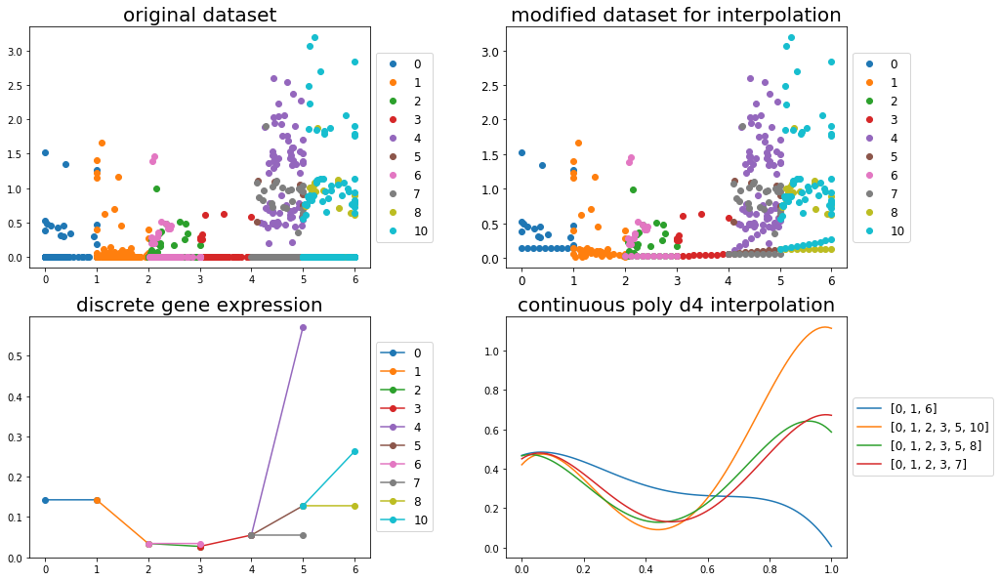

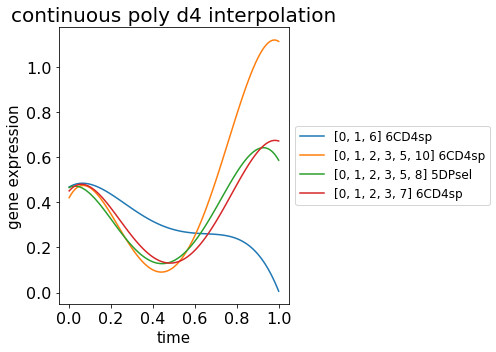

Neil3 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Neil3_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Neil3_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Neil3_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

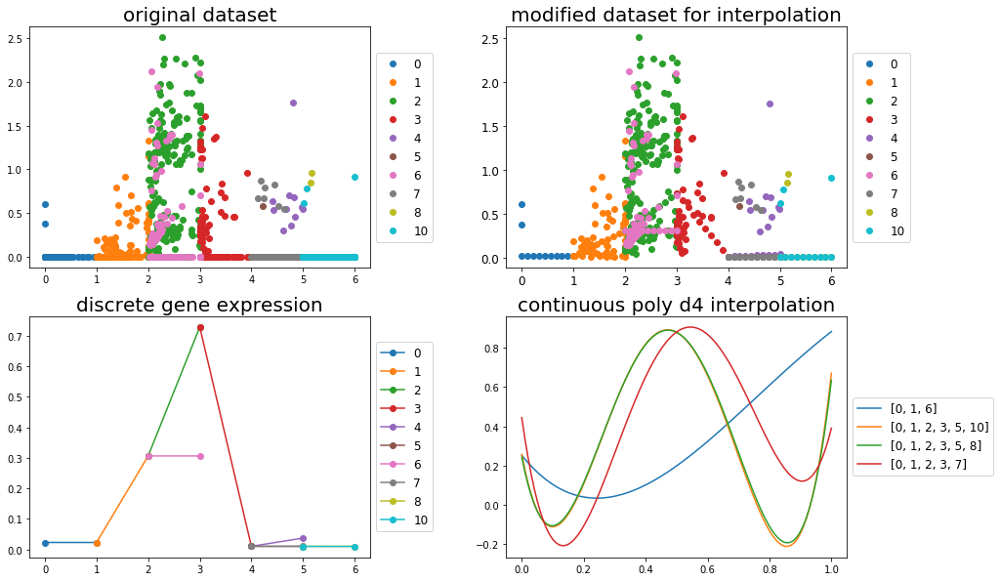

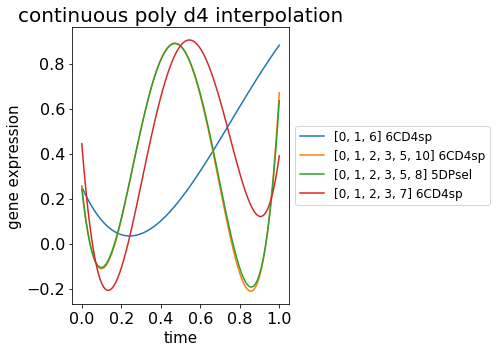

Aurkb 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Aurkb_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Aurkb_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Aurkb_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

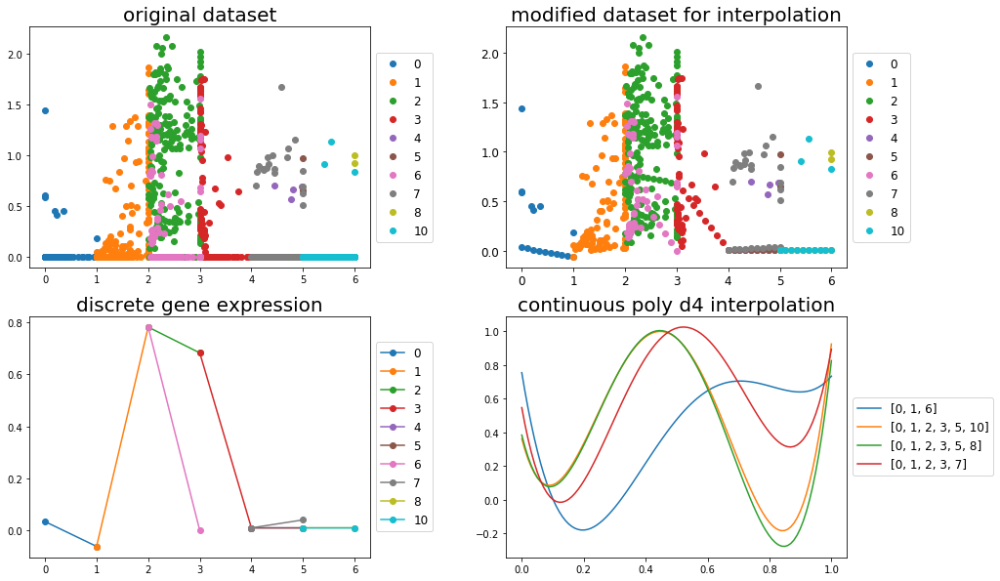

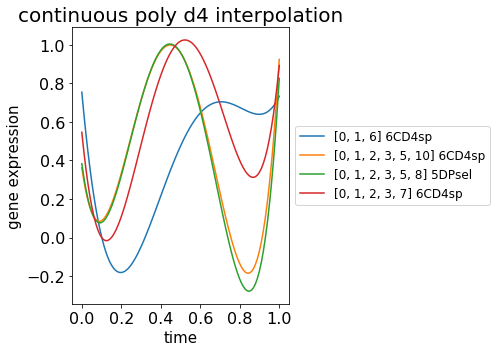

Tk1 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Tk1_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tk1_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tk1_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

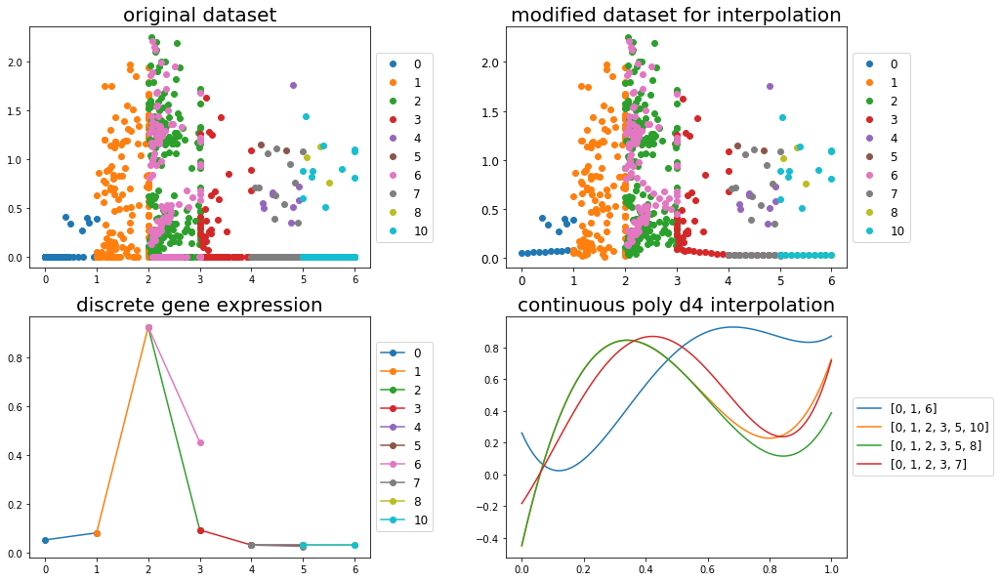

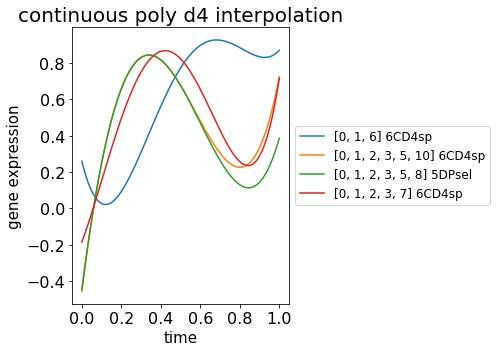

Pclaf 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Pclaf_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Pclaf_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Pclaf_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

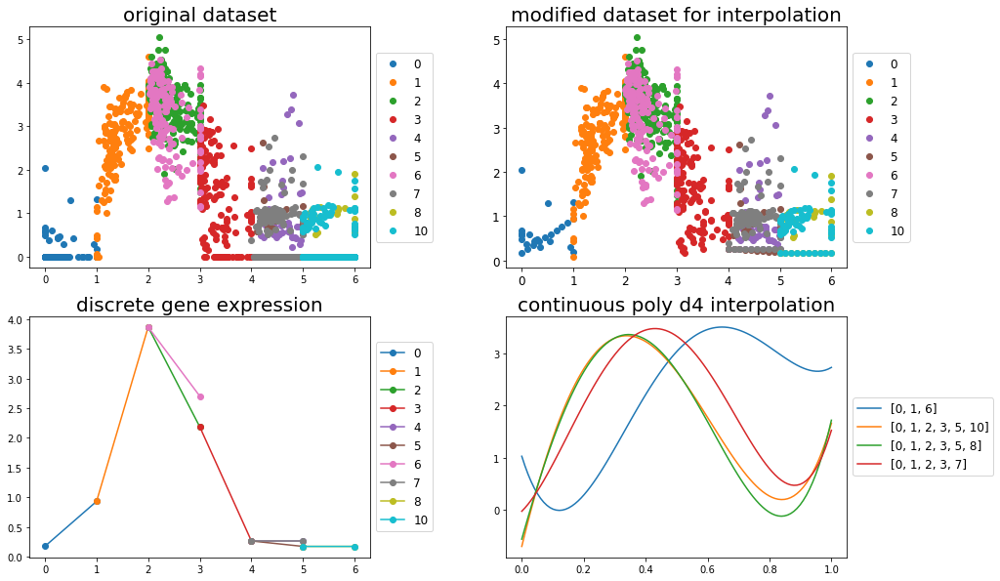

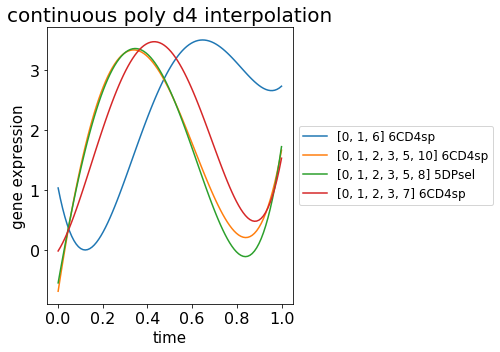

Tcf19 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Tcf19_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tcf19_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tcf19_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

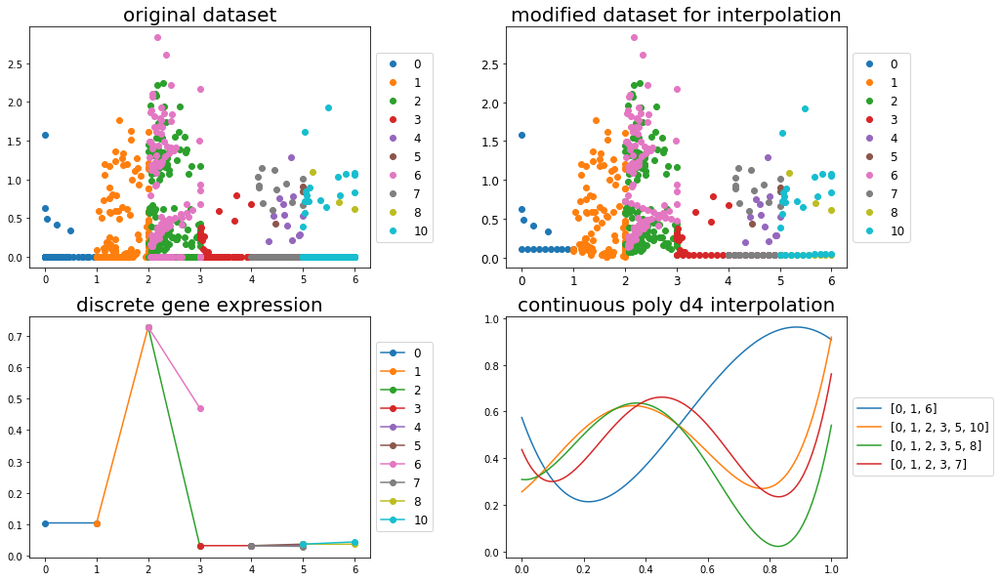

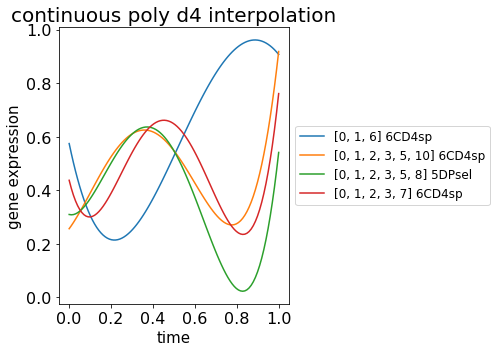

Spc25 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Spc25_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Spc25_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Spc25_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

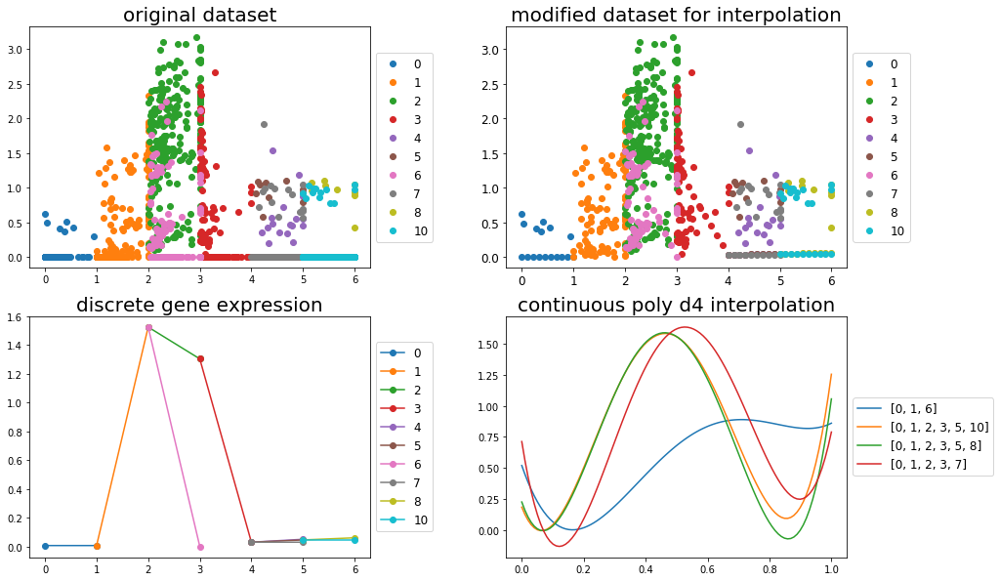

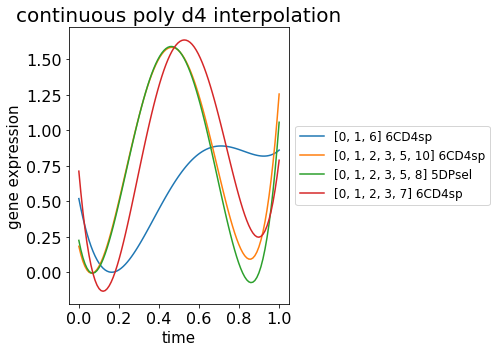

Spc24 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Spc24_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Spc24_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Spc24_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

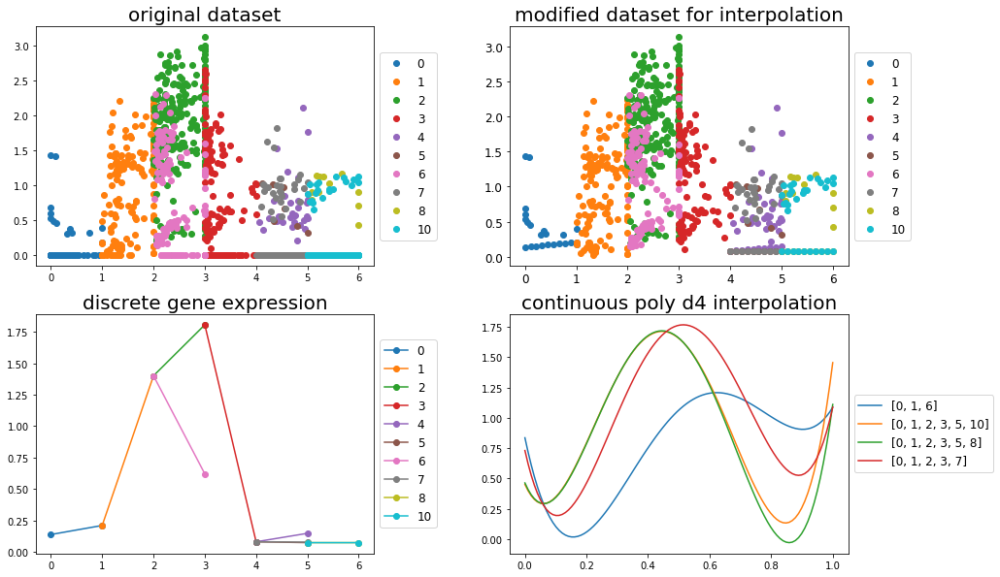

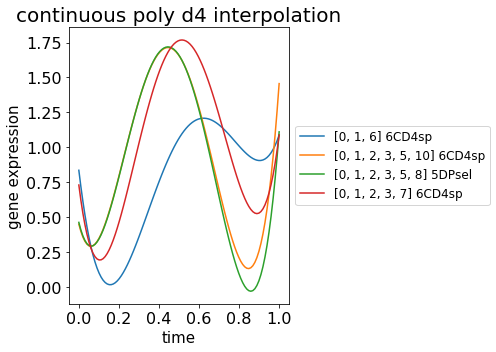

Hells 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Hells_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Hells_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Hells_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

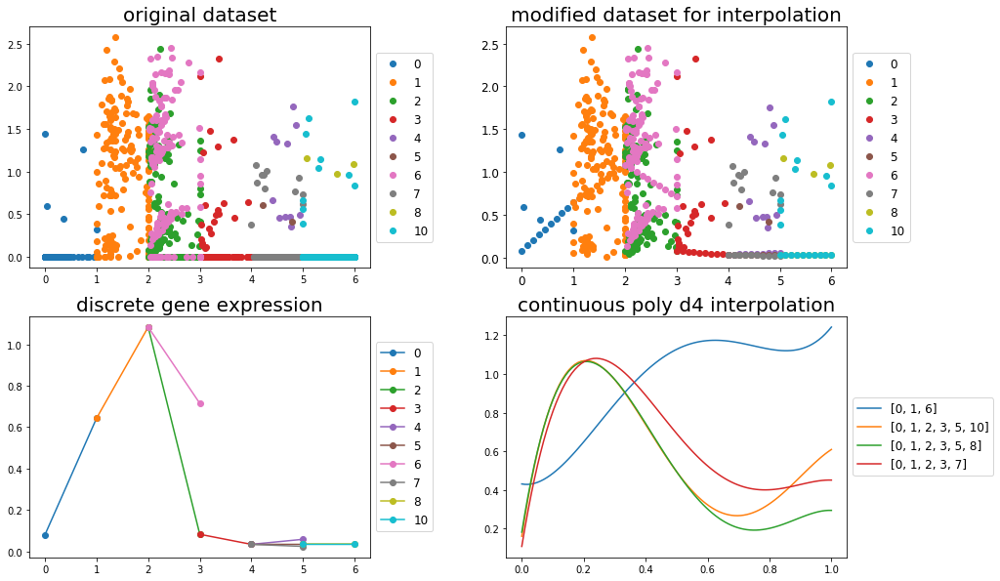

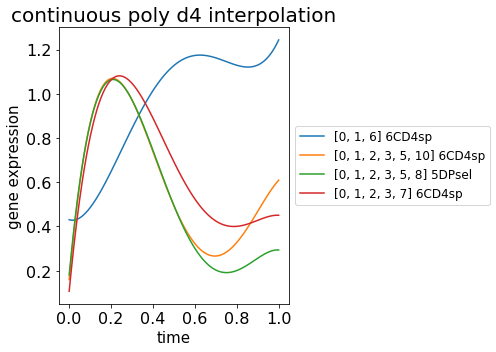

Tmsb4x 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Tmsb4x_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tmsb4x_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tmsb4x_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

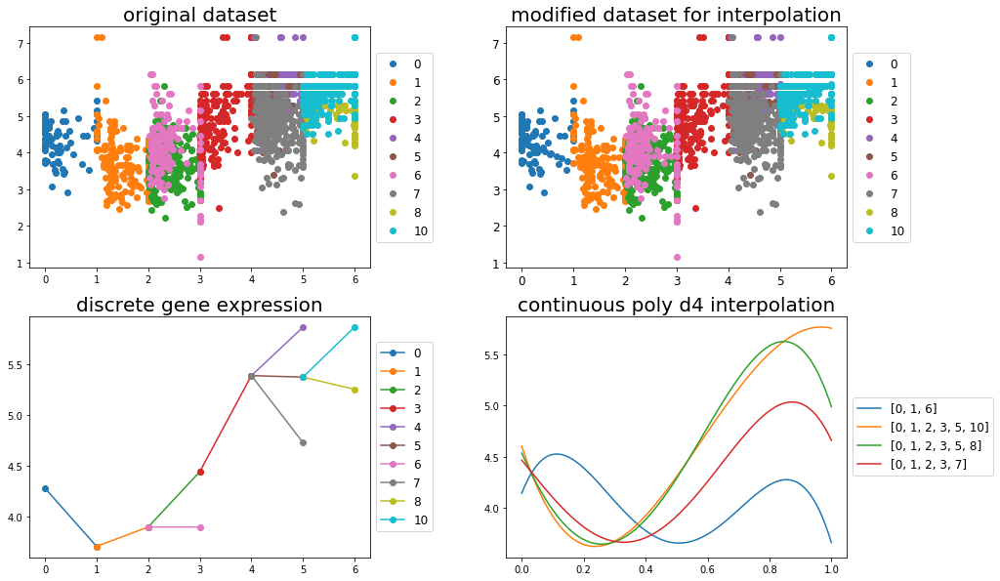

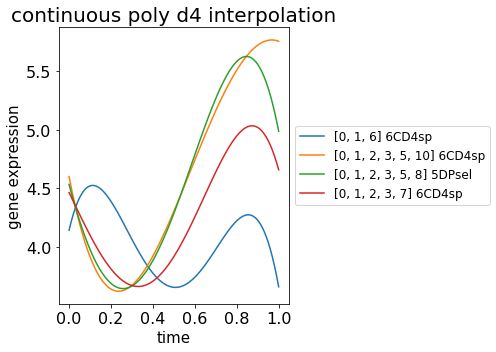

Hist1h2ap 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h2ap_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h2ap_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h2ap_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

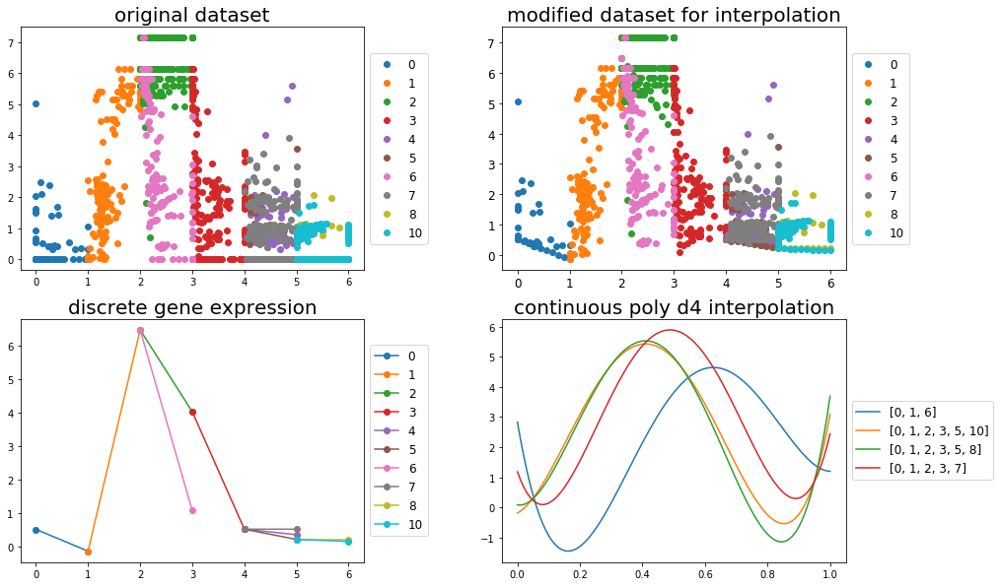

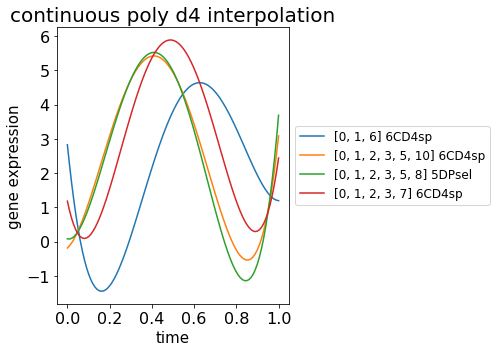

Srm 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Srm_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Srm_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Srm_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

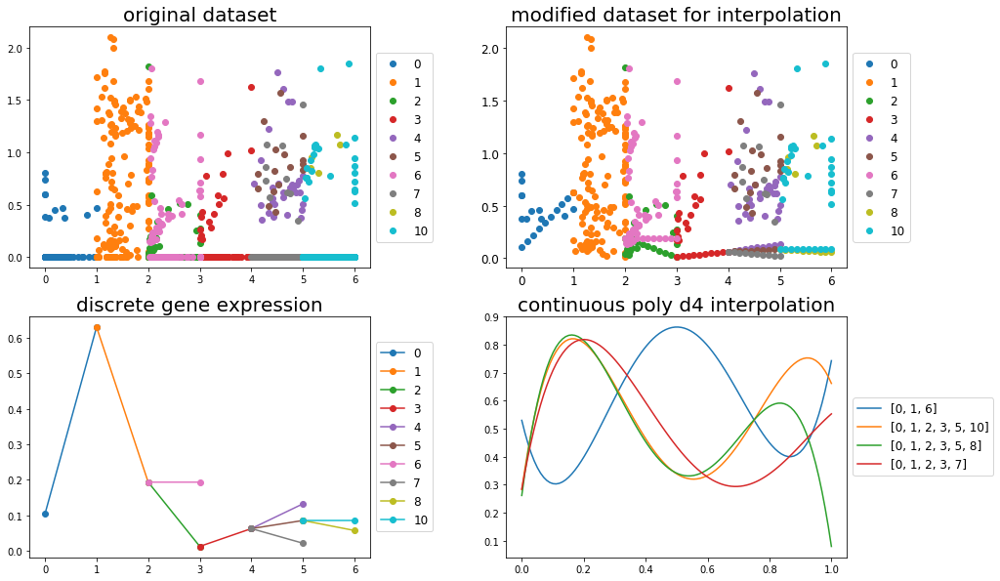

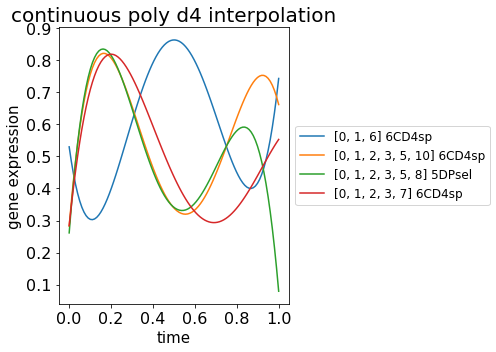

Ung 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Ung_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ung_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ung_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

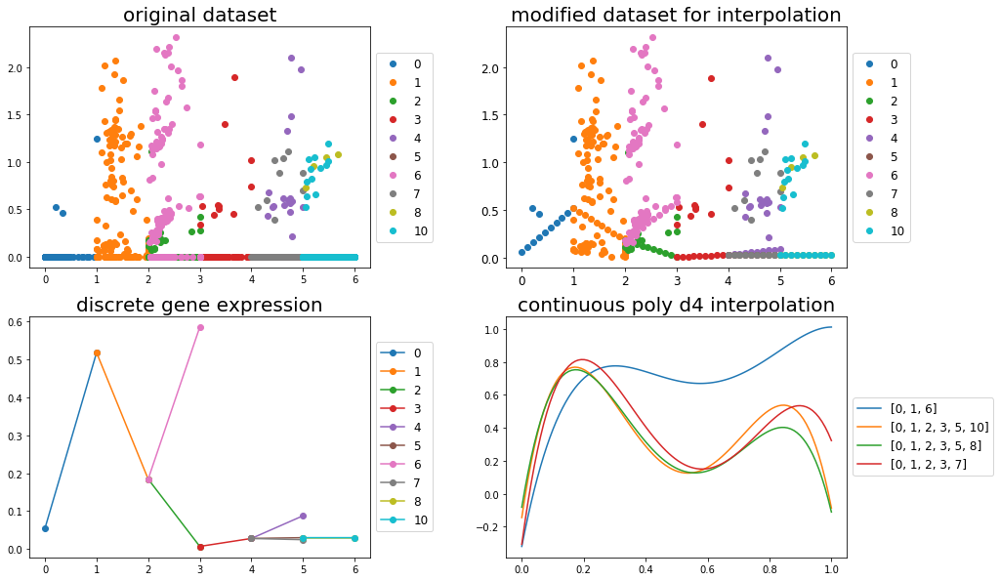

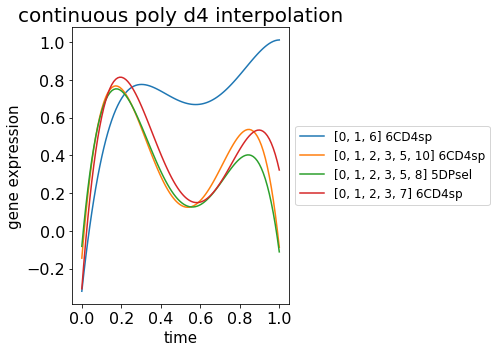

Hist1h2ae 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h2ae_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h2ae_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h2ae_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

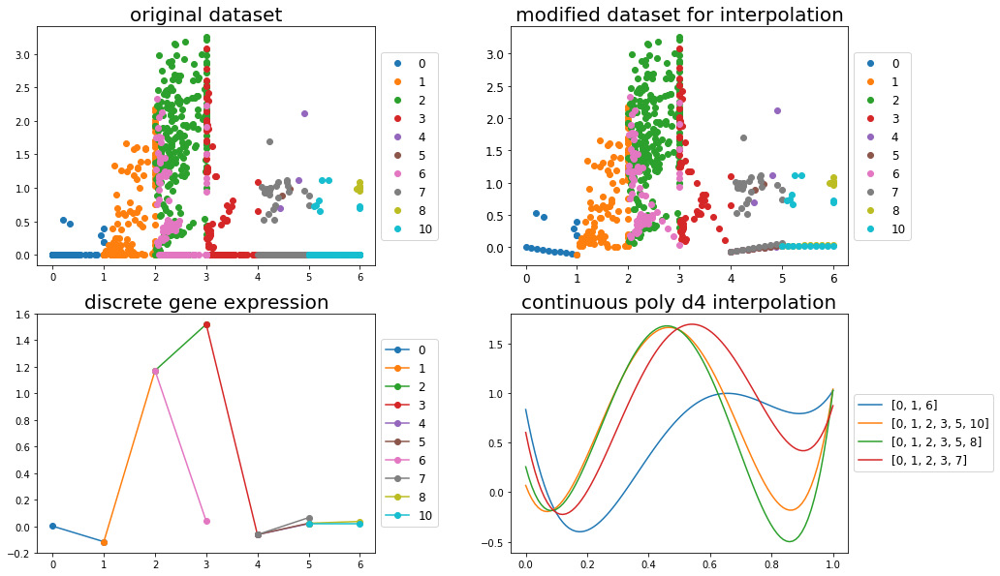

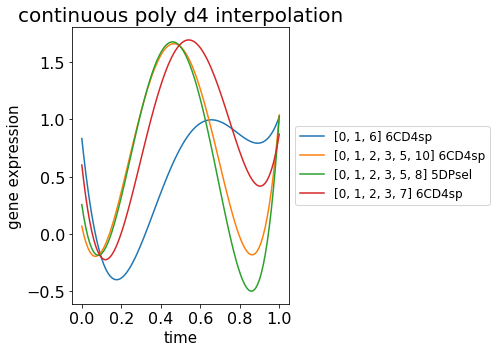

Hist1h2af 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h2af_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h2af_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h2af_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

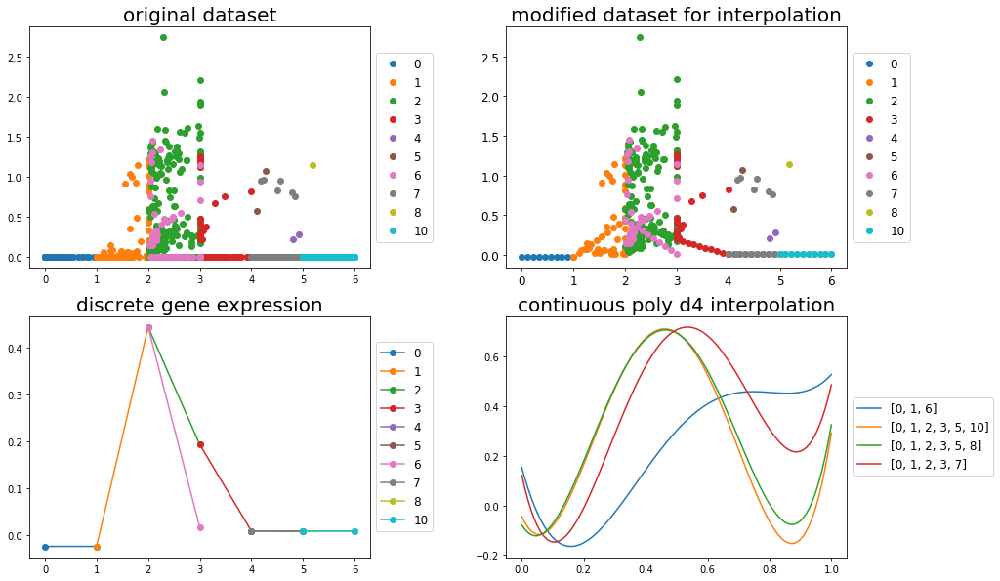

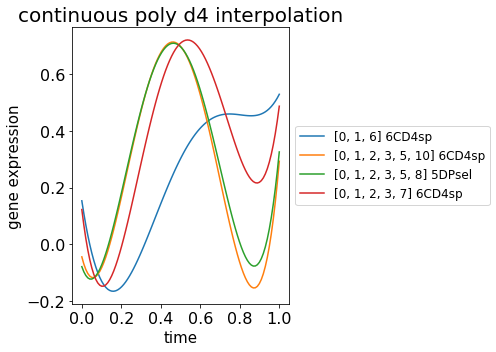

Mxd3 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Mxd3_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Mxd3_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Mxd3_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

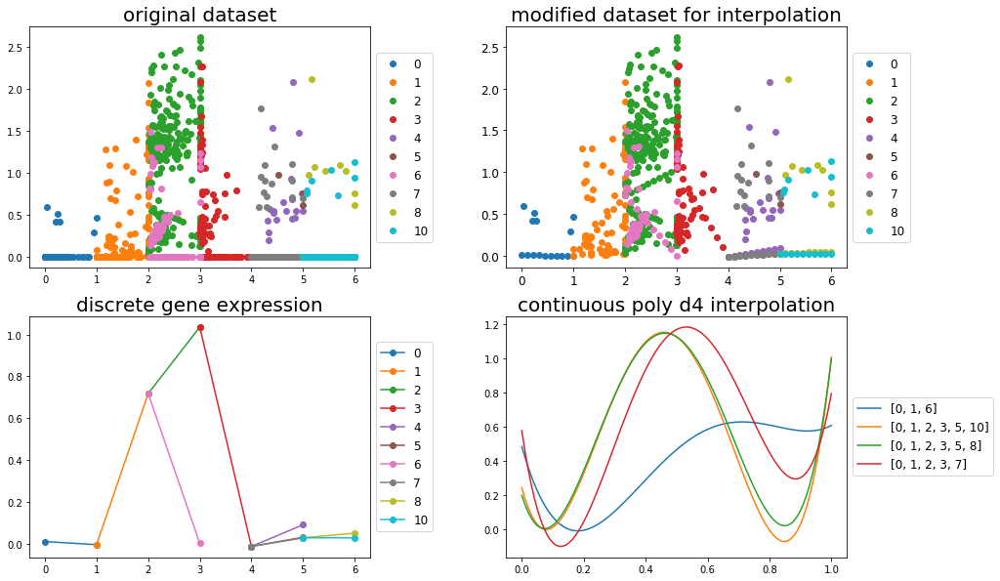

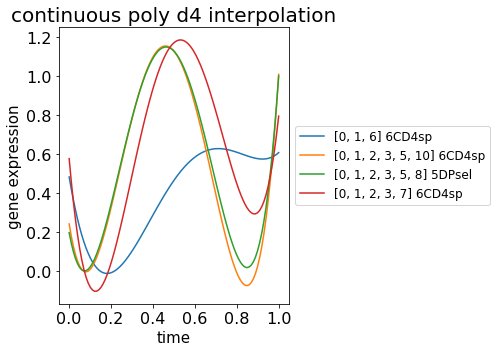

Gmnn 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Gmnn_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Gmnn_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Gmnn_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

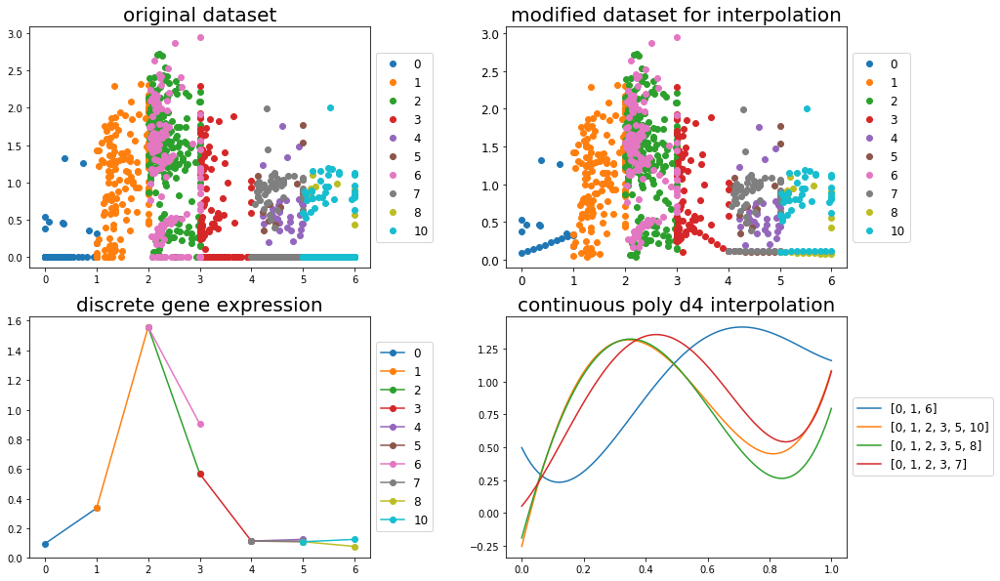

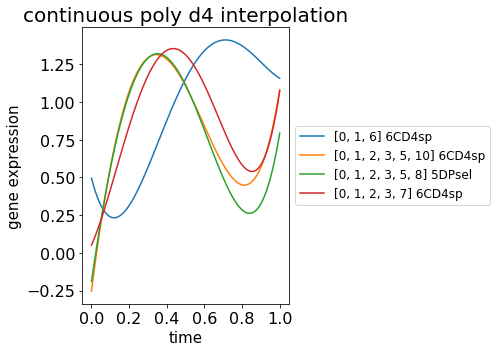

Hist1h1b 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h1b_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h1b_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Hist1h1b_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

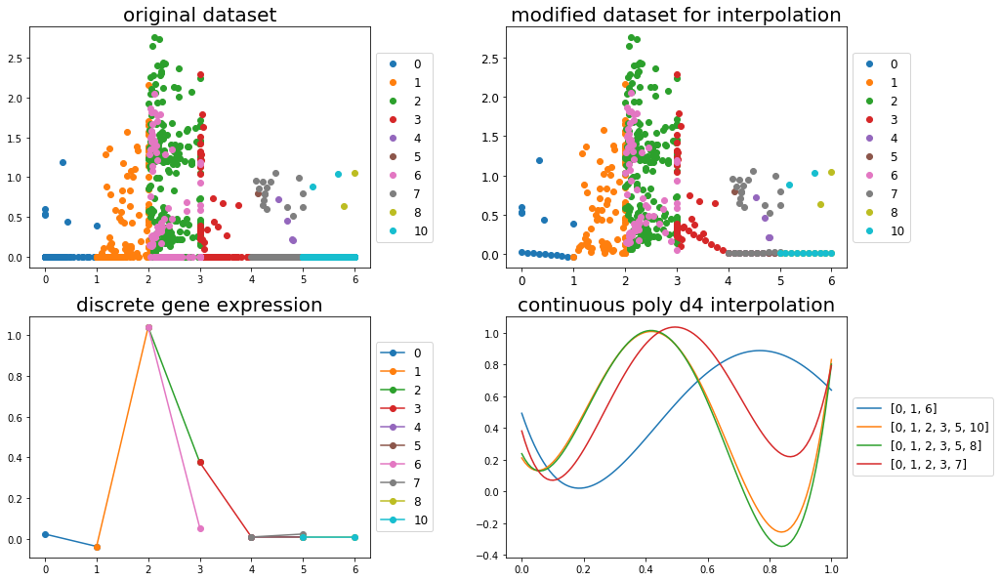

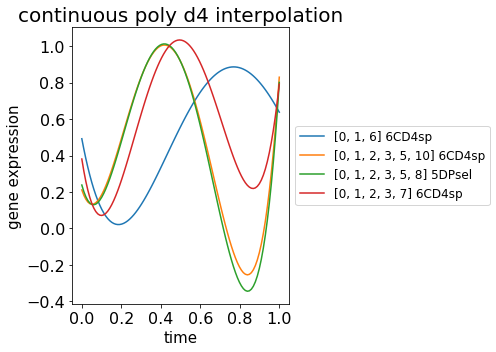

Ifitm2 1DN
ANALYSIS_OUTPUT/nocv_it10_top/Ifitm2_1_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ifitm2_1_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ifitm2_1_continuous_4th.png


<Figure size 432x288 with 0 Axes>

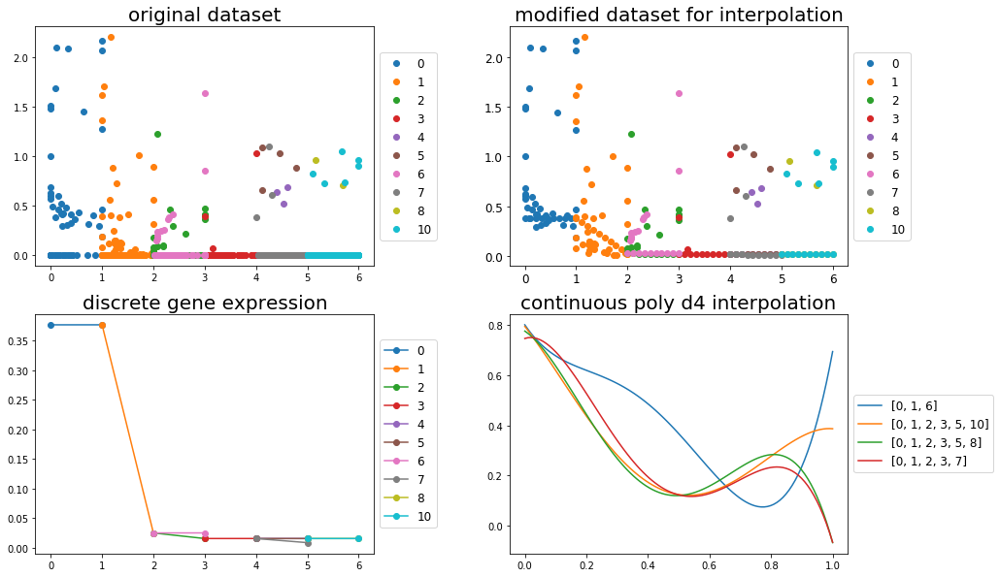

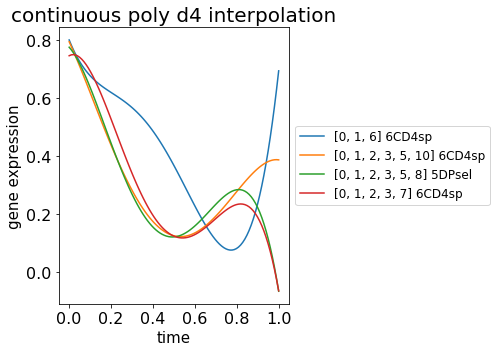

Clspn 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Clspn_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Clspn_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Clspn_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

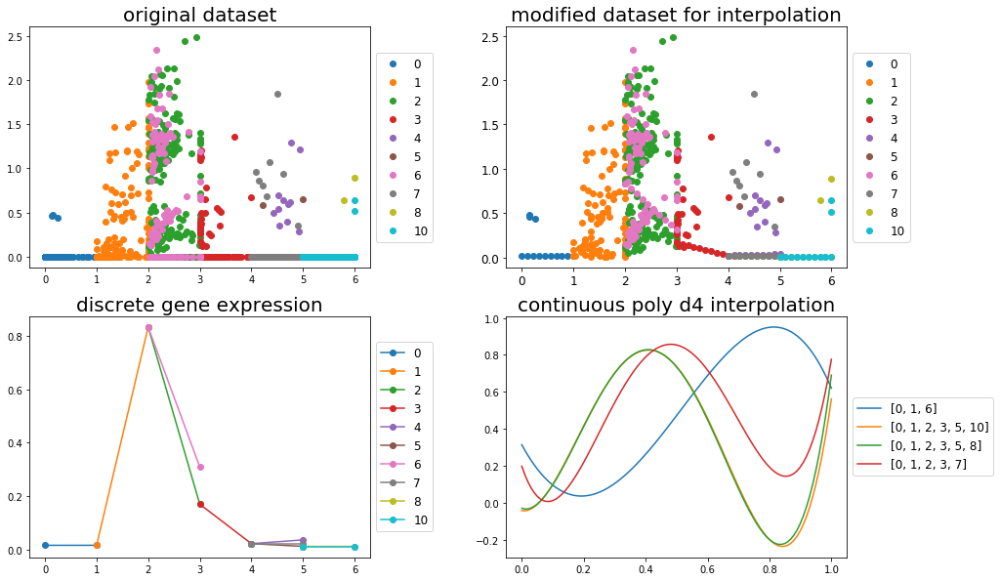

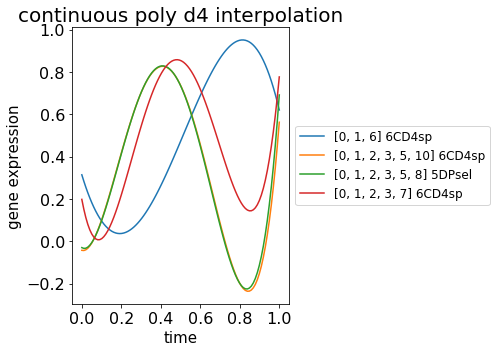

Esco2 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Esco2_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Esco2_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Esco2_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

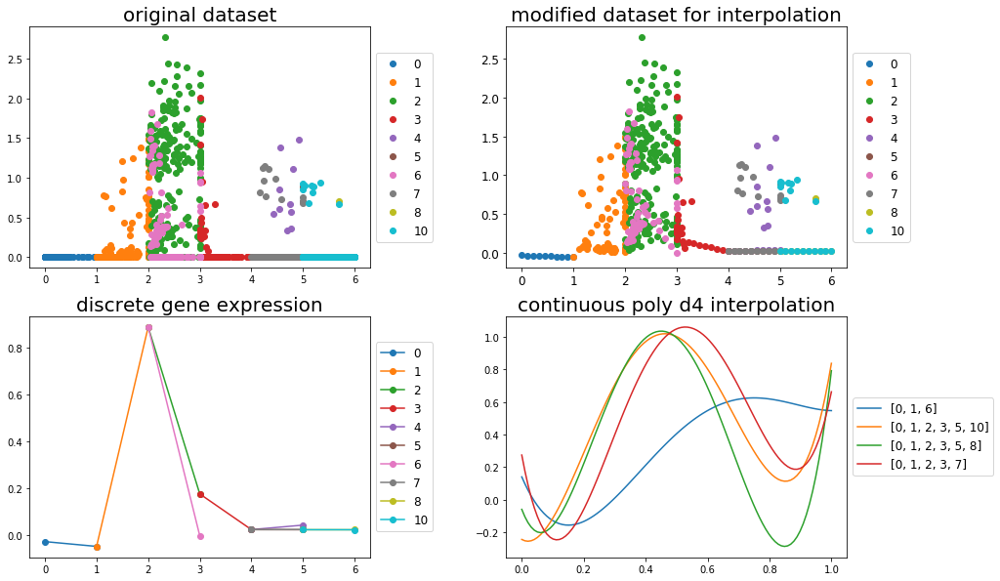

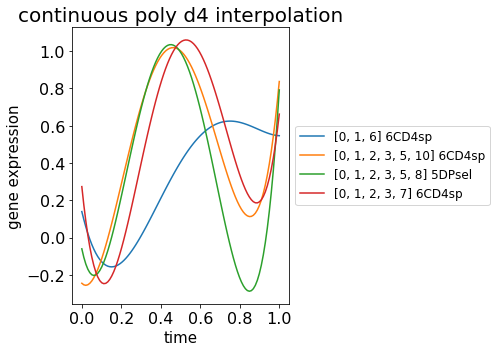

Ccnd2 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Ccnd2_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccnd2_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccnd2_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

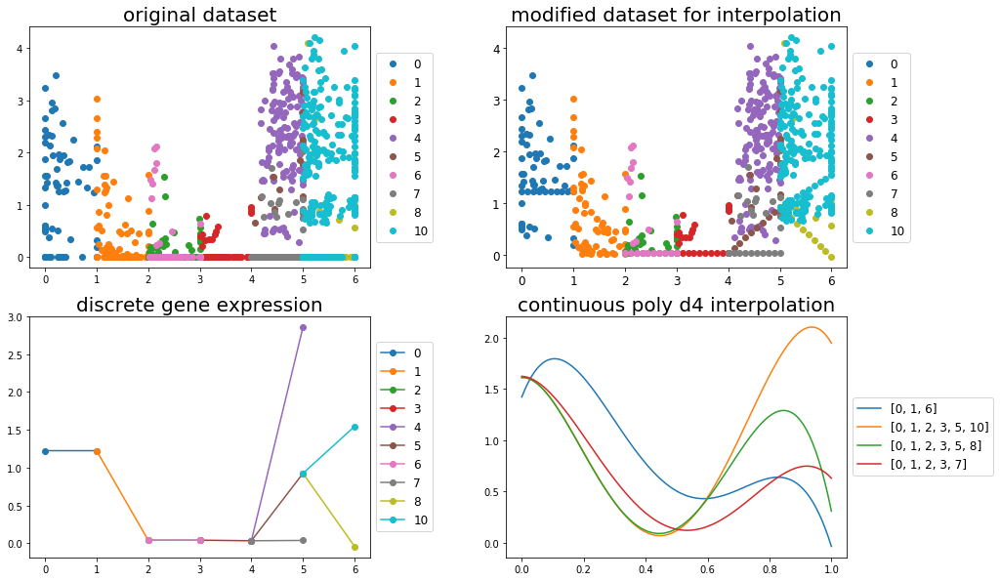

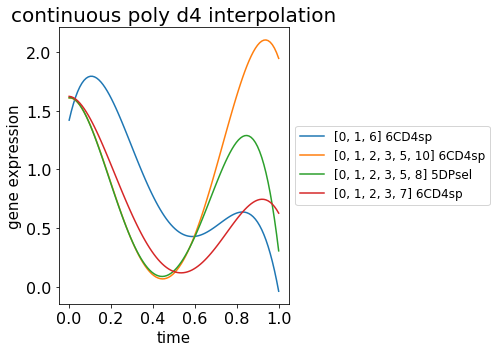

Myl10 1DN
ANALYSIS_OUTPUT/nocv_it10_top/Myl10_1_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Myl10_1_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Myl10_1_continuous_4th.png


<Figure size 432x288 with 0 Axes>

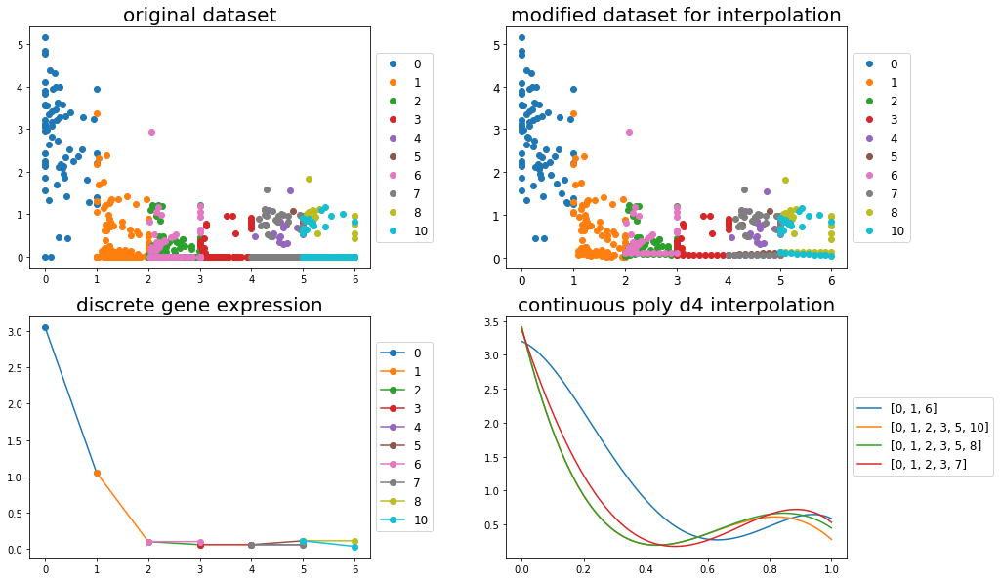

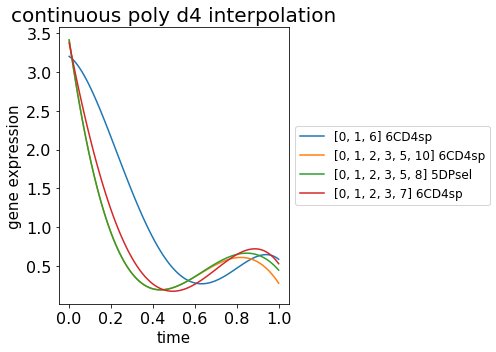

Tyms 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Tyms_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tyms_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tyms_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

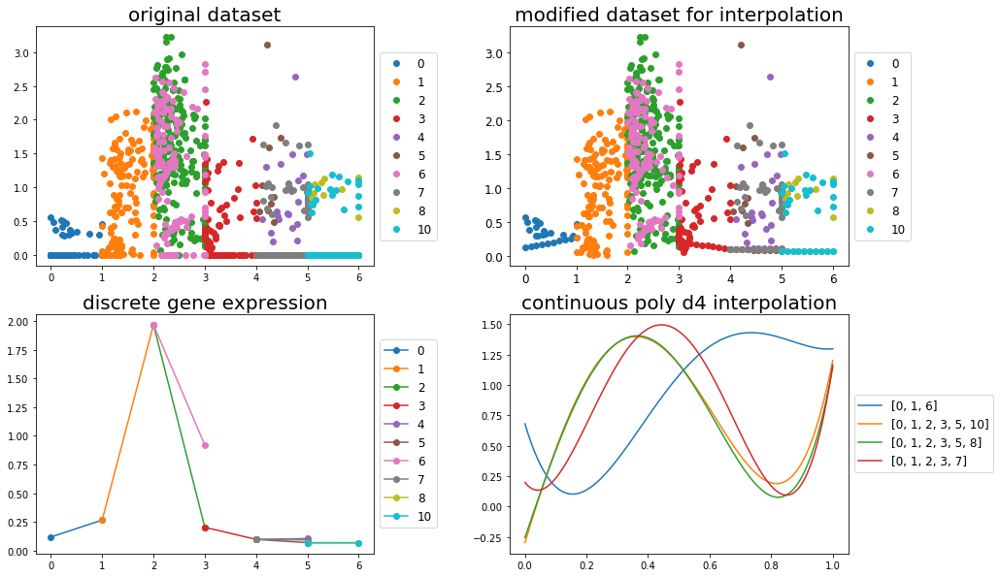

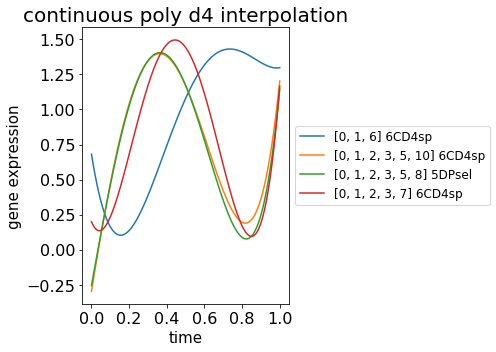

Tubb2b 4DPre
ANALYSIS_OUTPUT/nocv_it10_top/Tubb2b_4_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tubb2b_4_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tubb2b_4_continuous_4th.png


<Figure size 432x288 with 0 Axes>

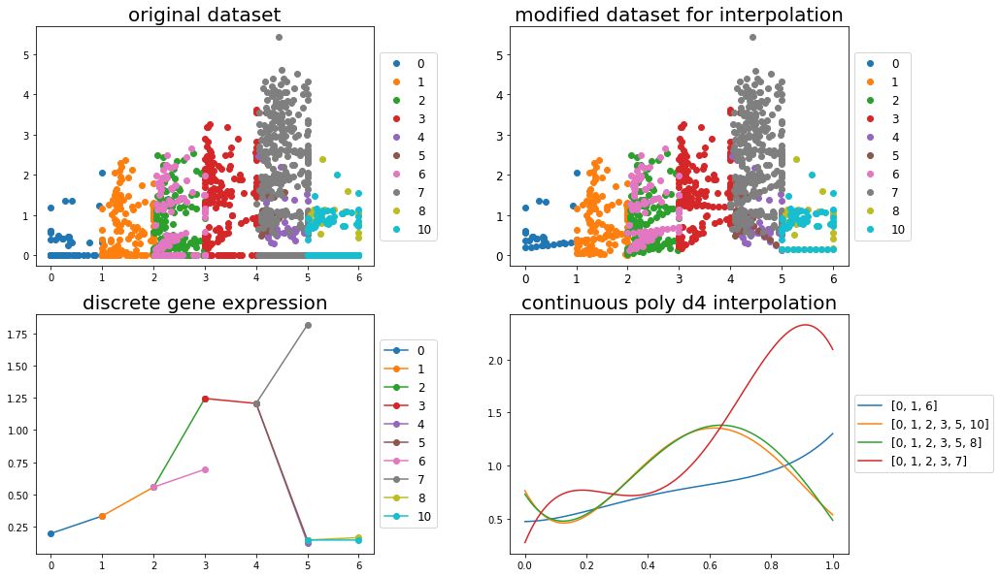

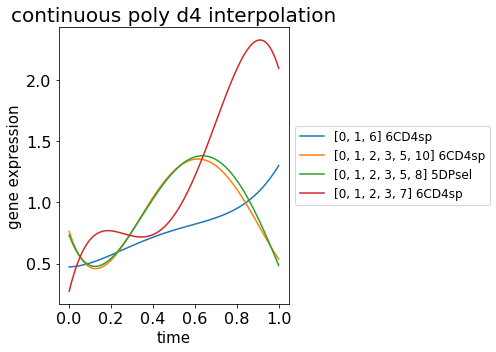

Slbp 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Slbp_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Slbp_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Slbp_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

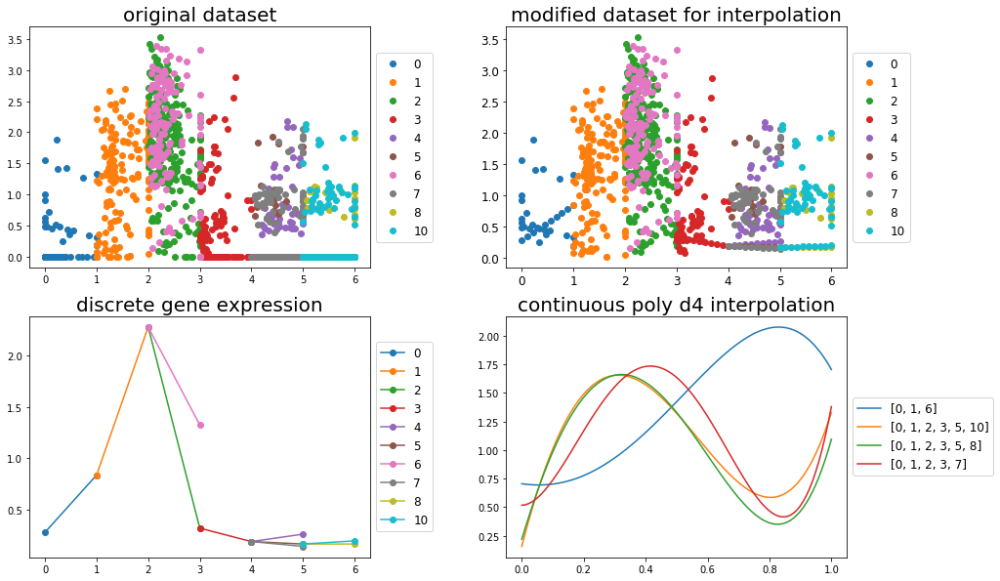

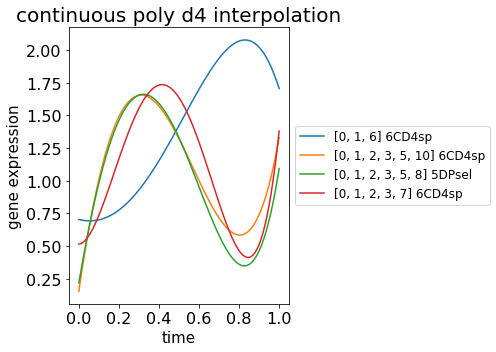

Ranbp1 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Ranbp1_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ranbp1_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ranbp1_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

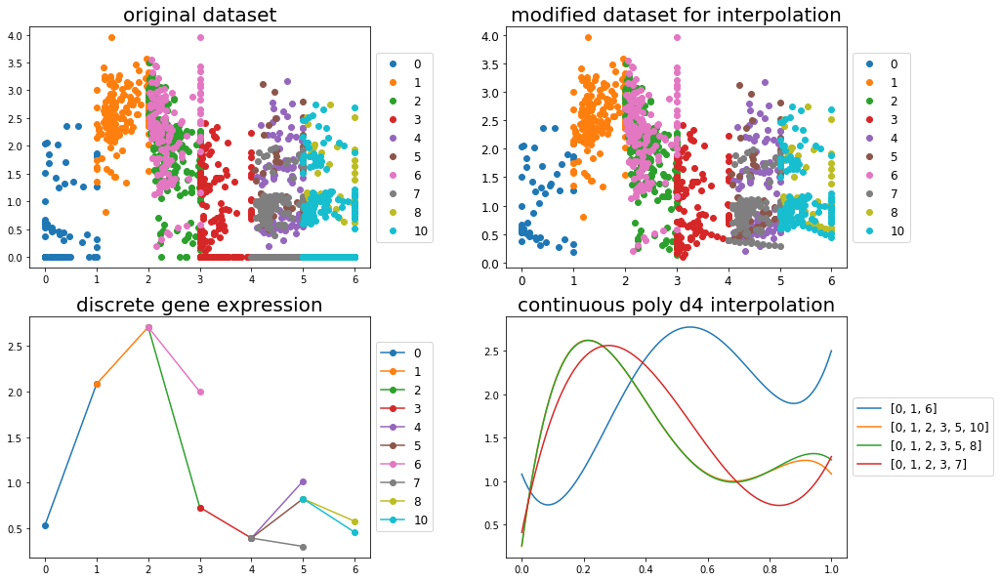

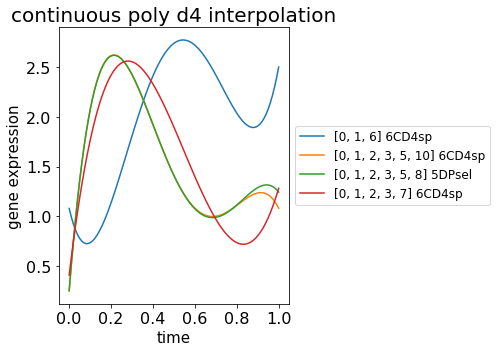

Dtl 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Dtl_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Dtl_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Dtl_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

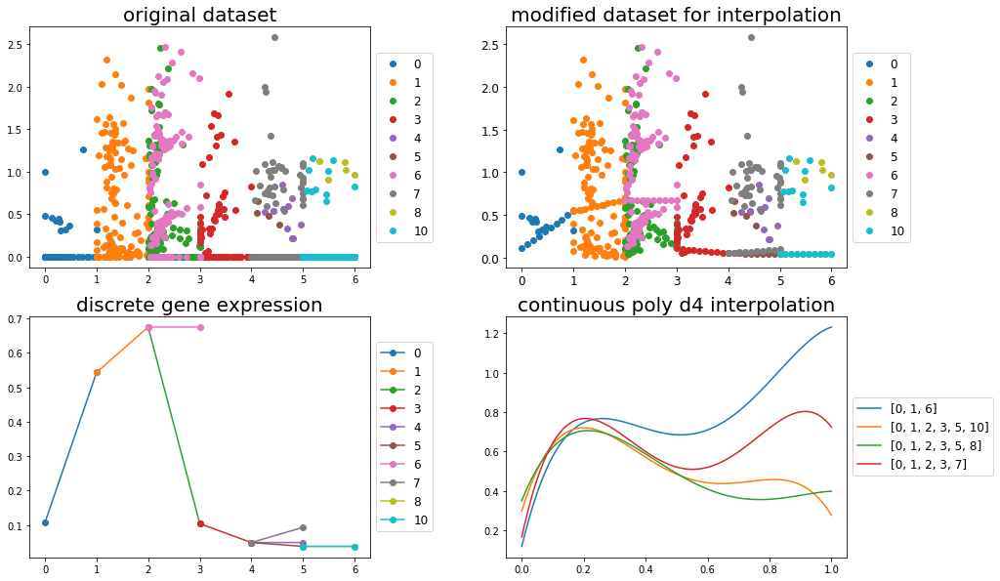

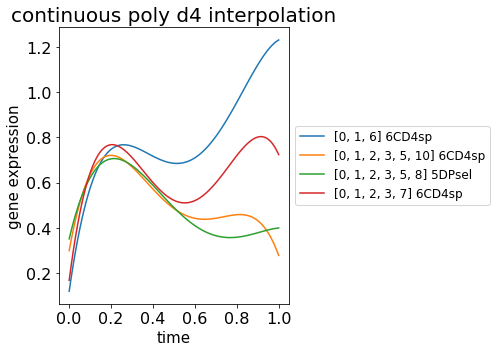

Ccne2 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Ccne2_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccne2_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccne2_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

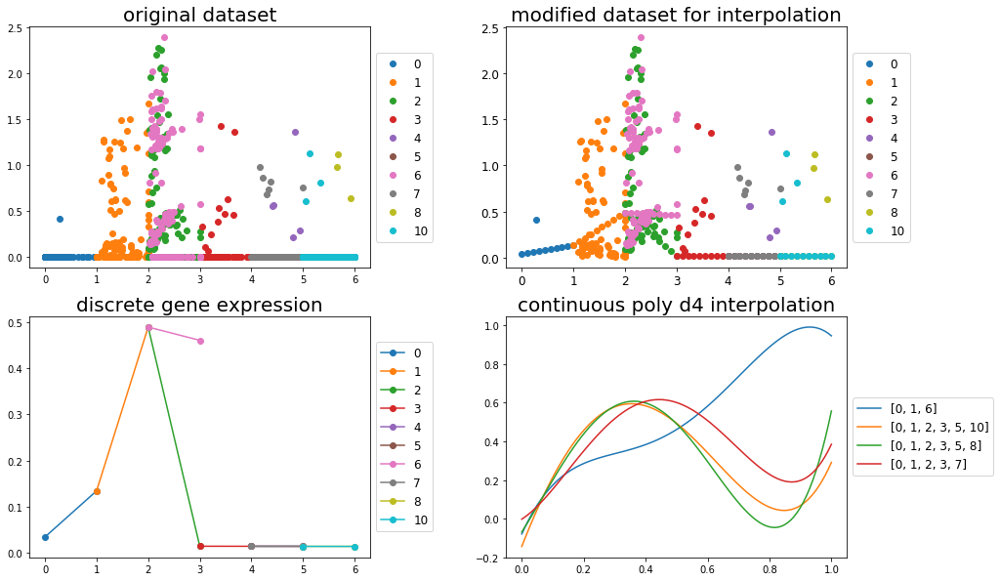

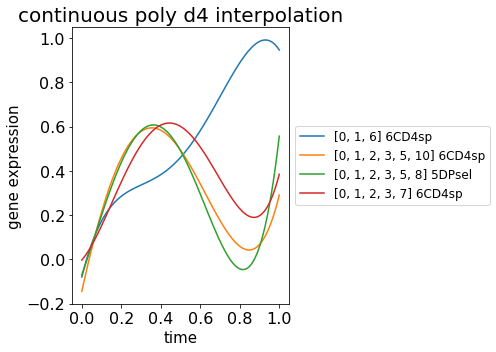

E2f8 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/E2f8_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/E2f8_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/E2f8_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

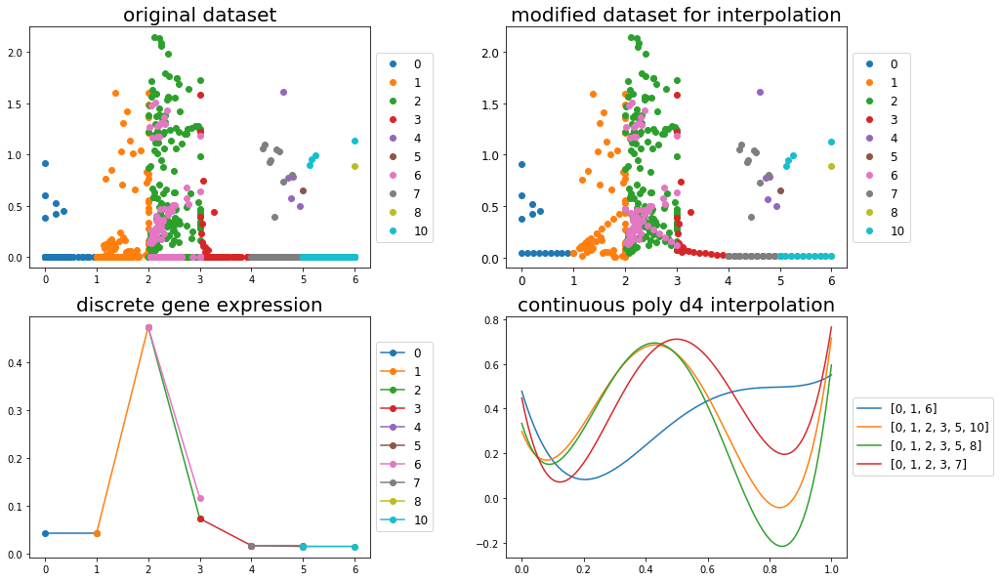

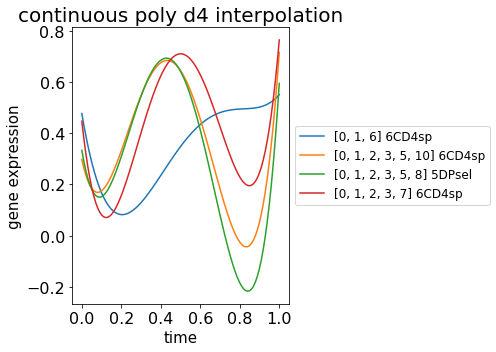

Itm2a 5DPsel
ANALYSIS_OUTPUT/nocv_it10_top/Itm2a_5_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Itm2a_5_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Itm2a_5_continuous_4th.png


<Figure size 432x288 with 0 Axes>

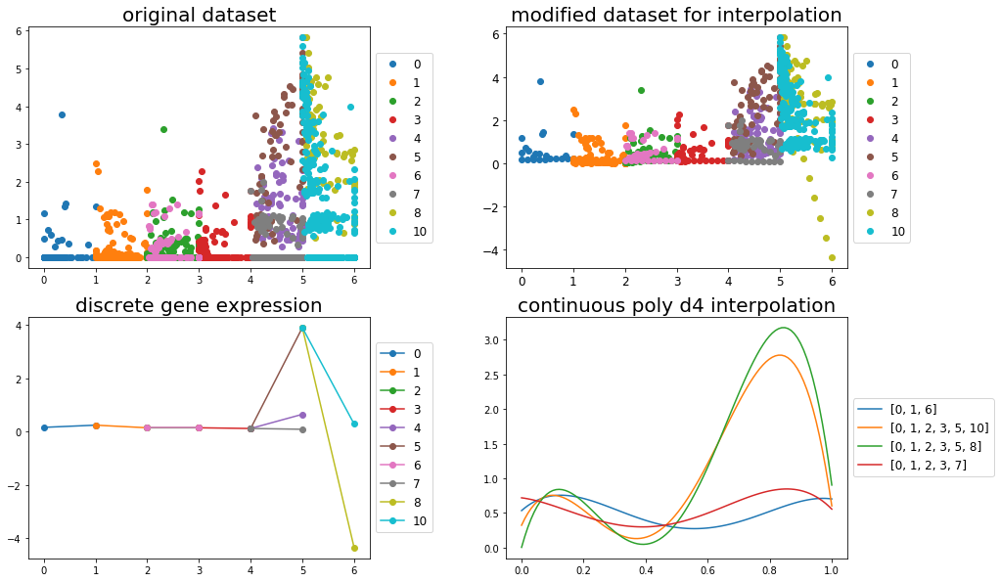

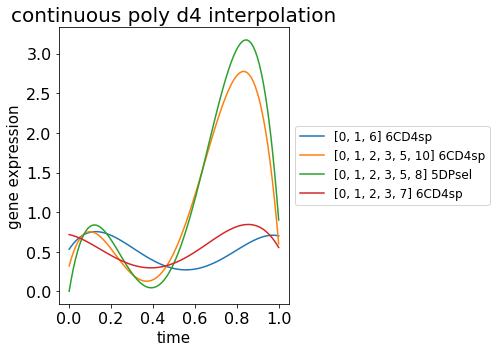

Ccr7 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Ccr7_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccr7_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ccr7_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

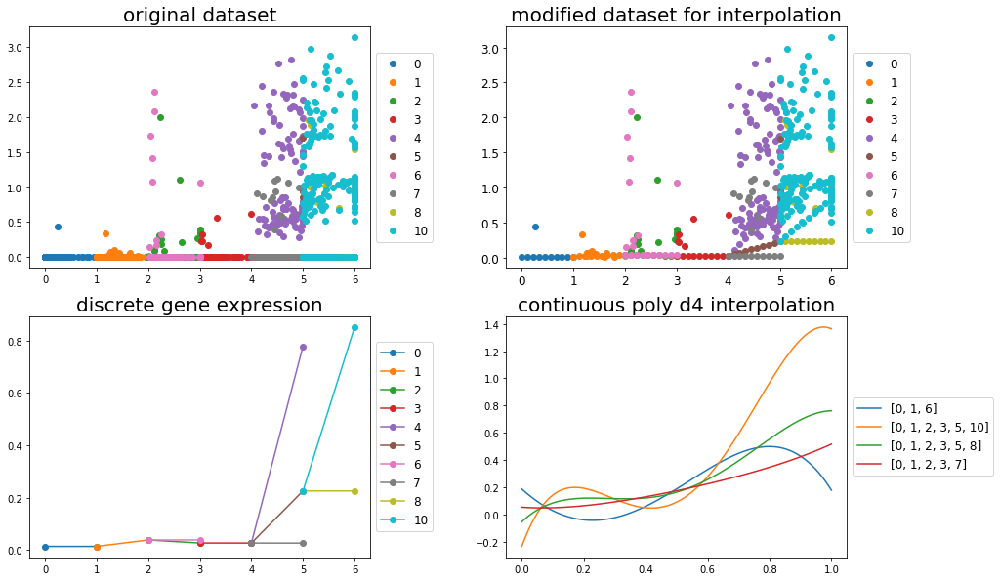

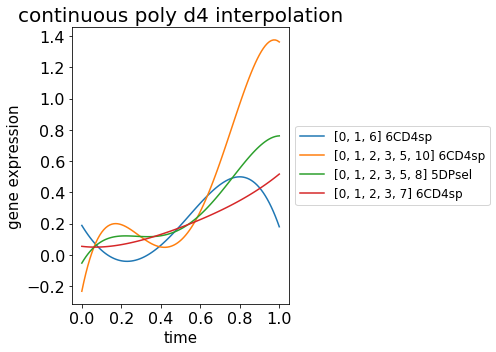

Gimap4 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Gimap4_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Gimap4_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Gimap4_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

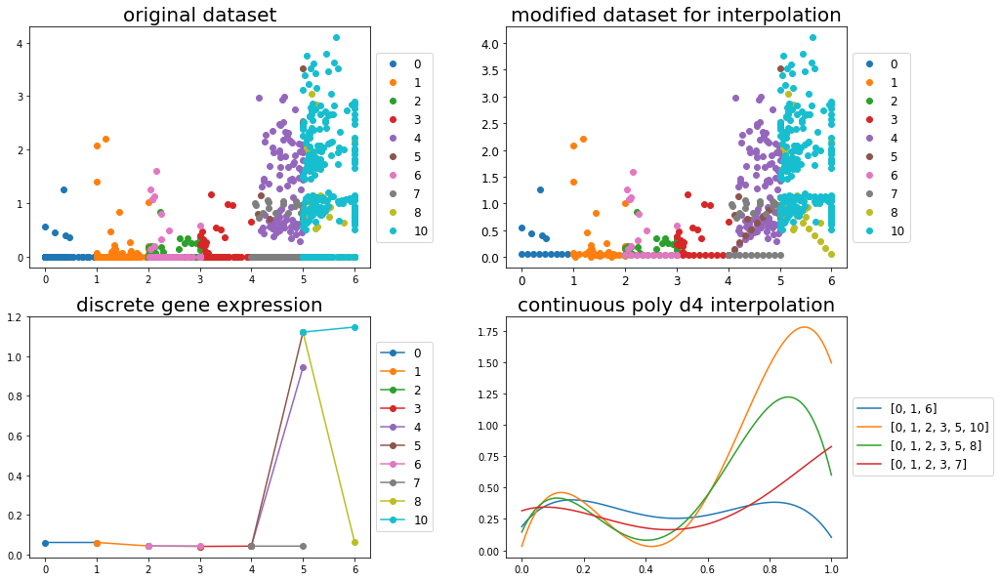

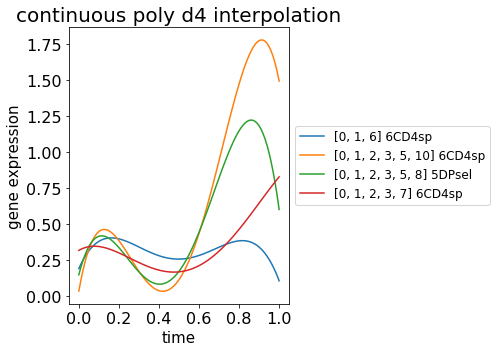

Nusap1 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Nusap1_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Nusap1_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Nusap1_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

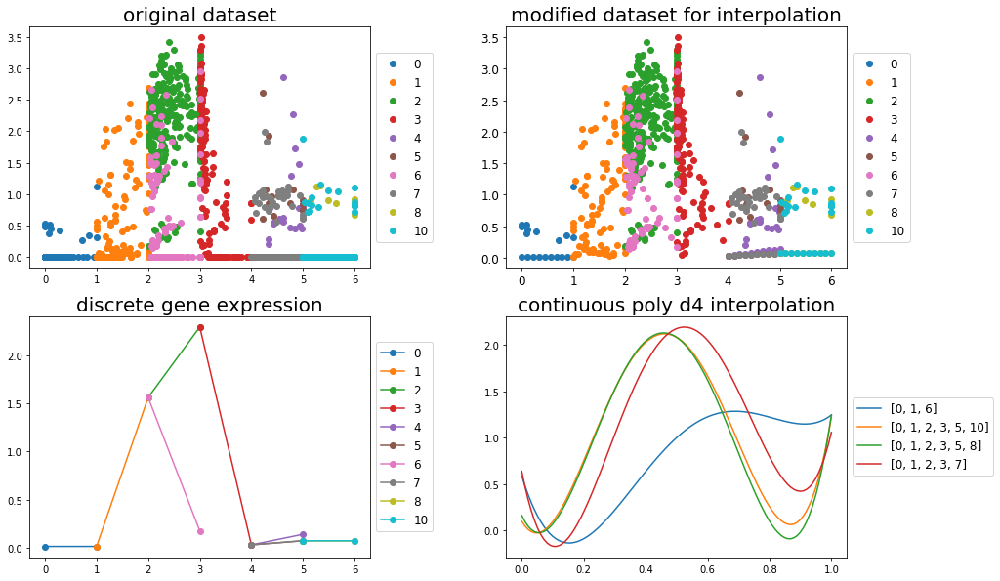

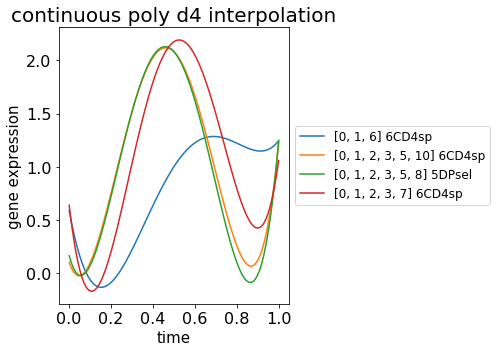

Dhfr 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Dhfr_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Dhfr_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Dhfr_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

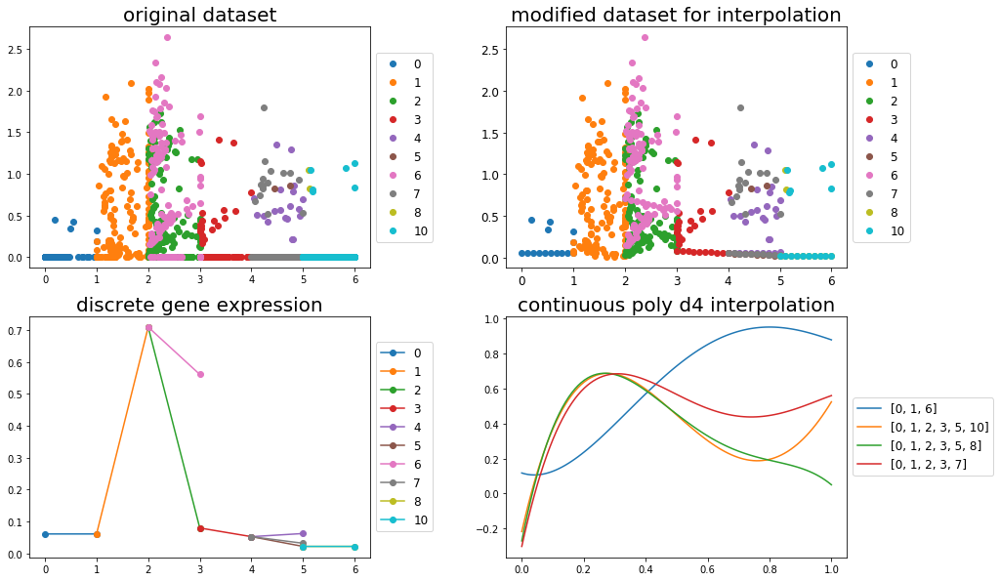

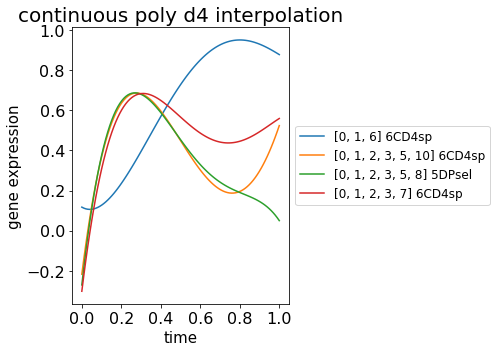

Cdc20 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Cdc20_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdc20_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdc20_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

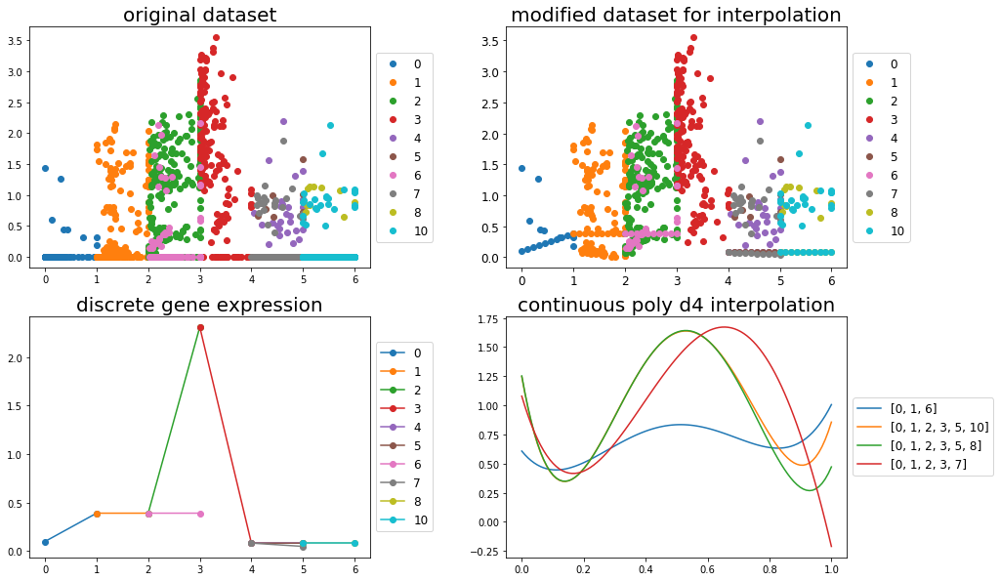

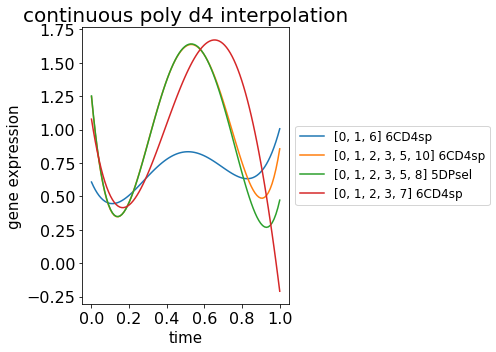

Fbxo5 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Fbxo5_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Fbxo5_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Fbxo5_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

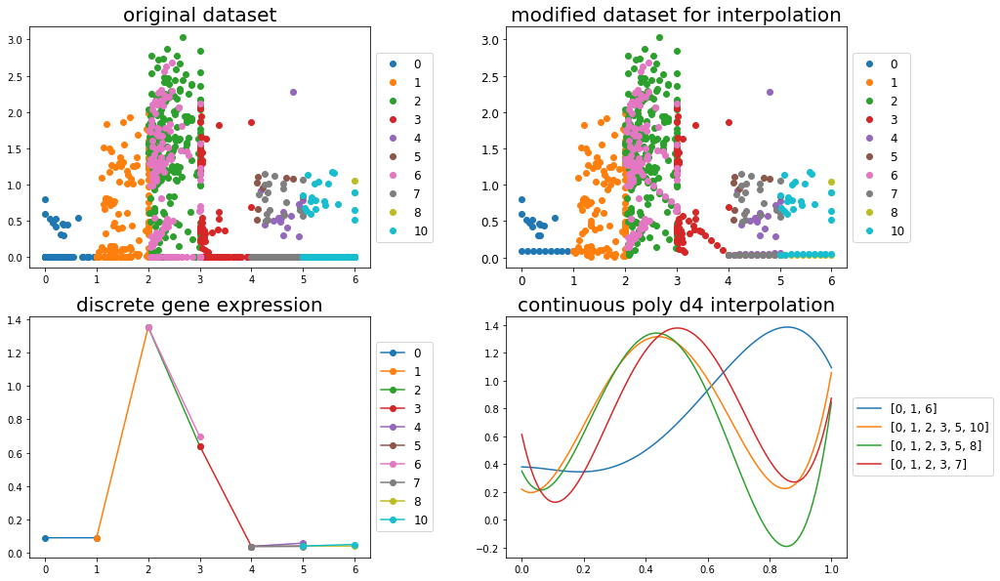

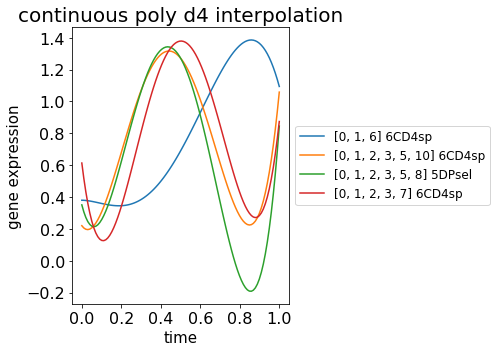

Gar1 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Gar1_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Gar1_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Gar1_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

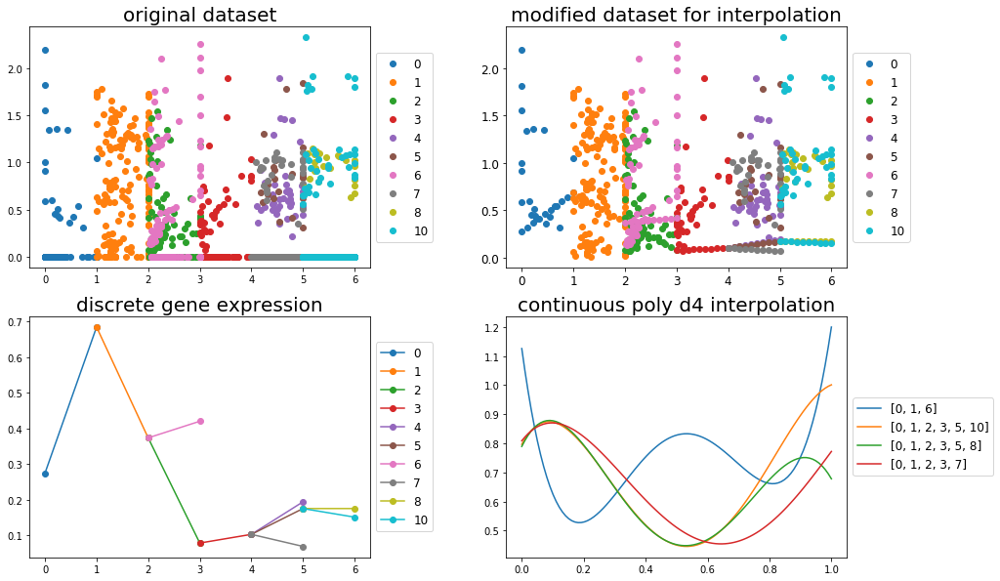

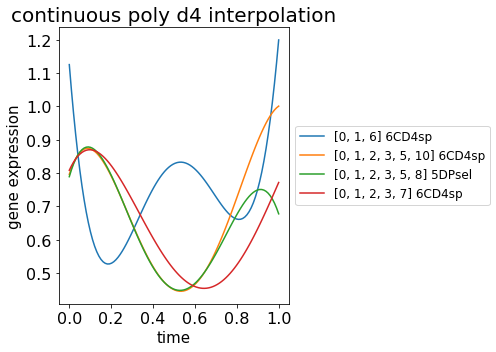

Gm5111 1DN
ANALYSIS_OUTPUT/nocv_it10_top/Gm5111_1_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Gm5111_1_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Gm5111_1_continuous_4th.png


<Figure size 432x288 with 0 Axes>

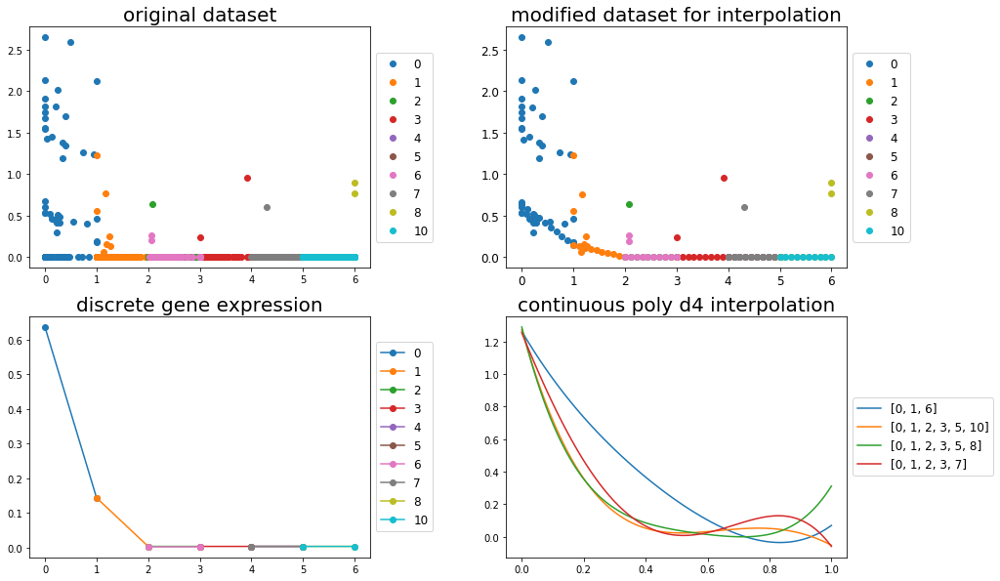

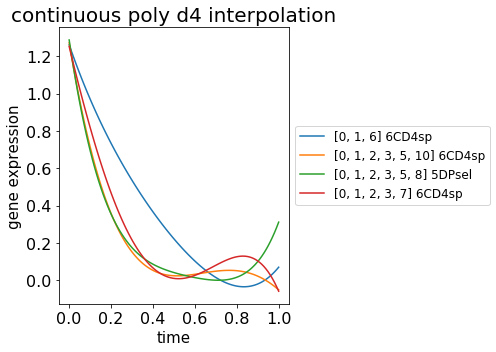

Cdkn2c 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Cdkn2c_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdkn2c_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdkn2c_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

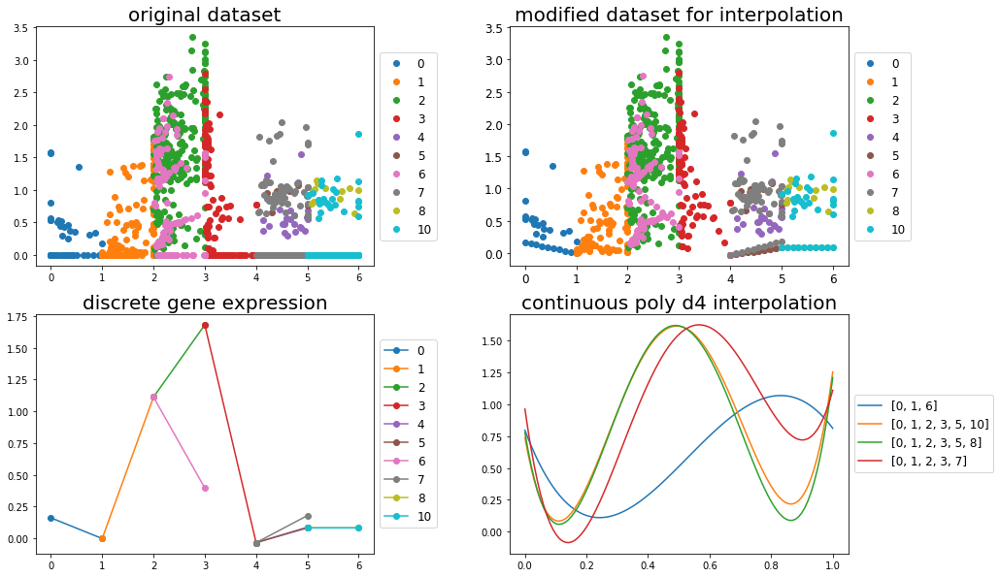

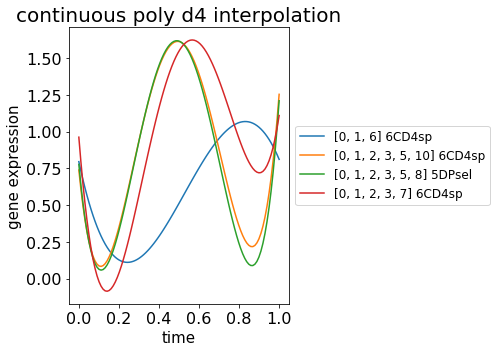

Mis18bp1 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Mis18bp1_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Mis18bp1_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Mis18bp1_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

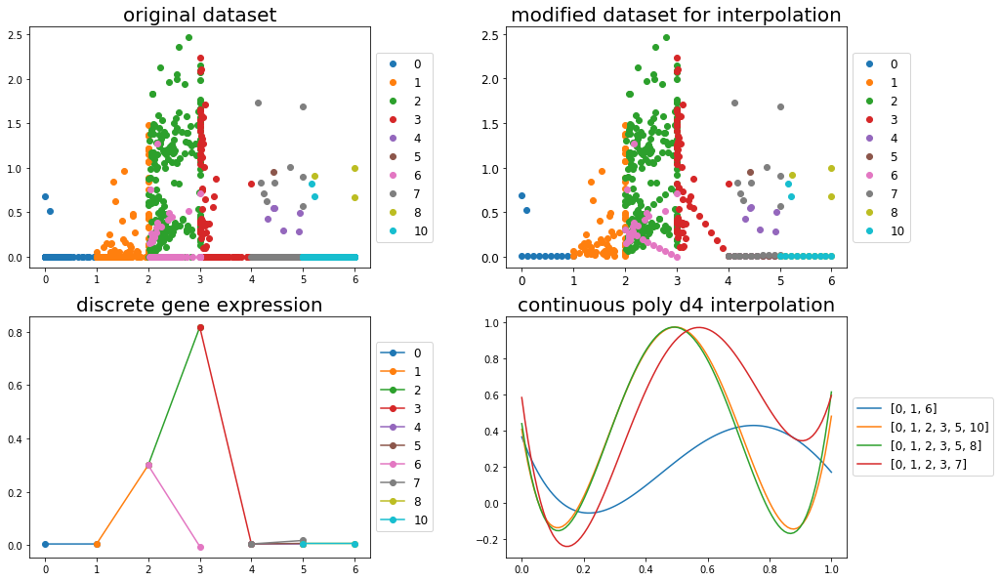

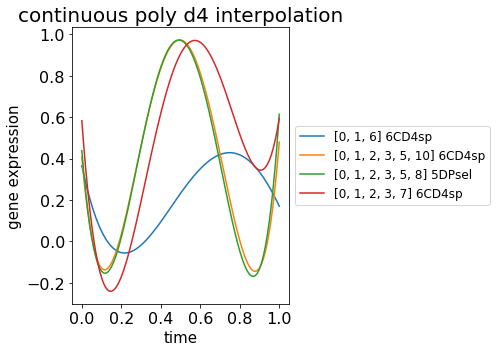

Rfc3 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Rfc3_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Rfc3_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Rfc3_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

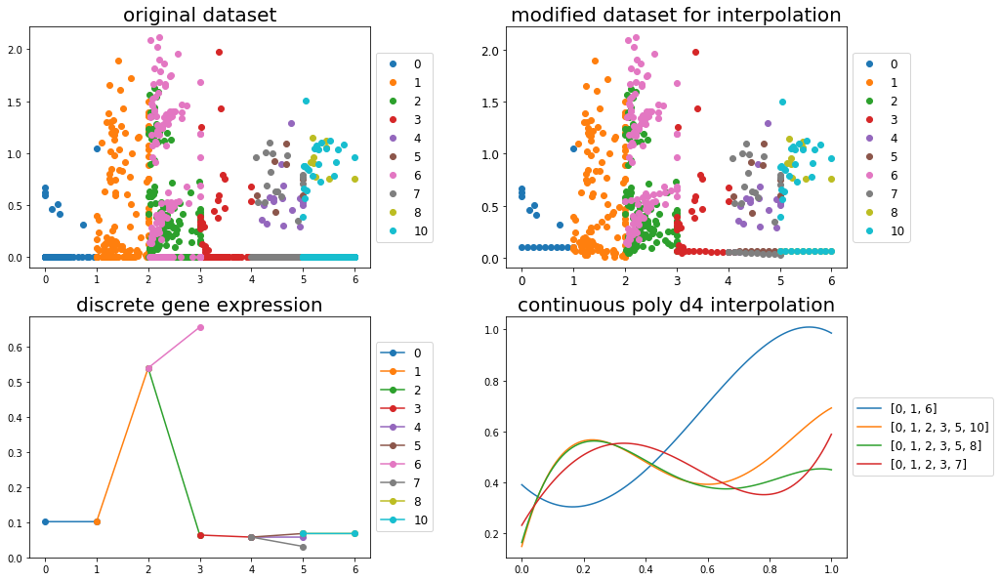

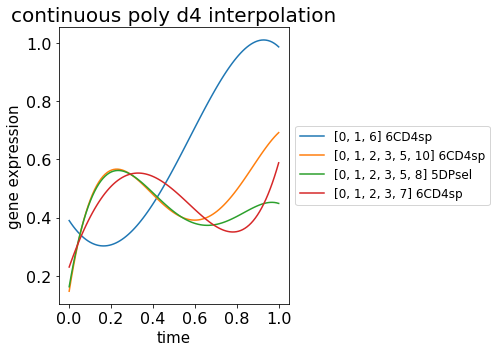

Mif 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Mif_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Mif_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Mif_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

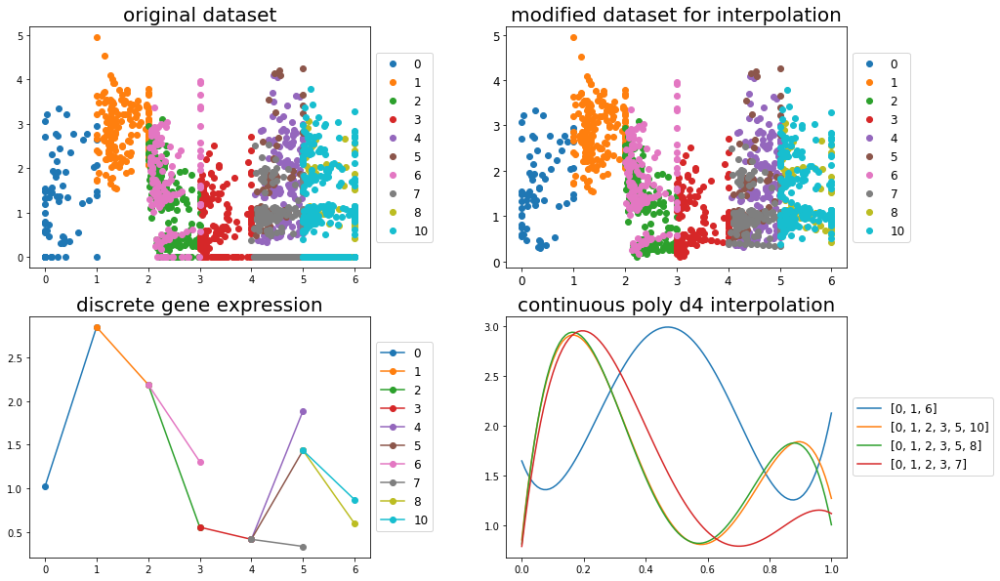

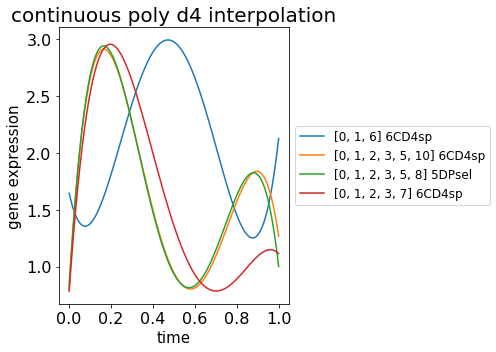

Apex1 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Apex1_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Apex1_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Apex1_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

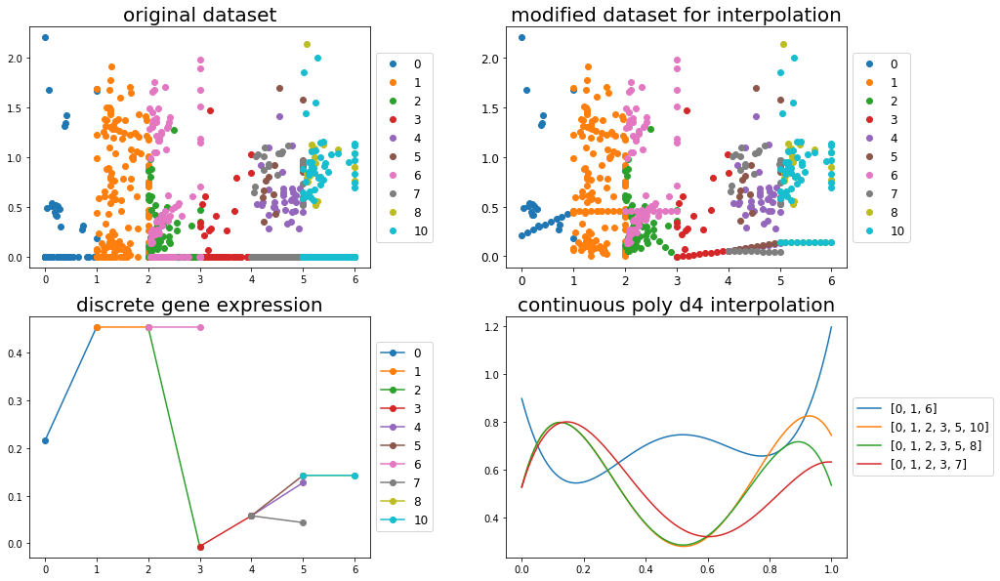

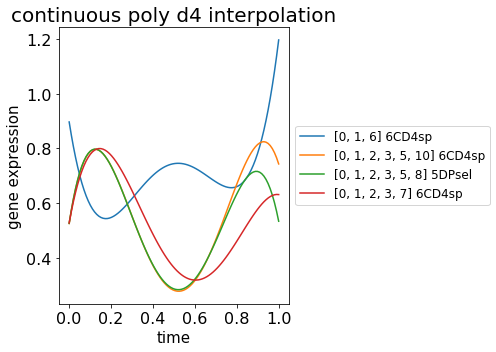

Cdca3 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Cdca3_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdca3_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdca3_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

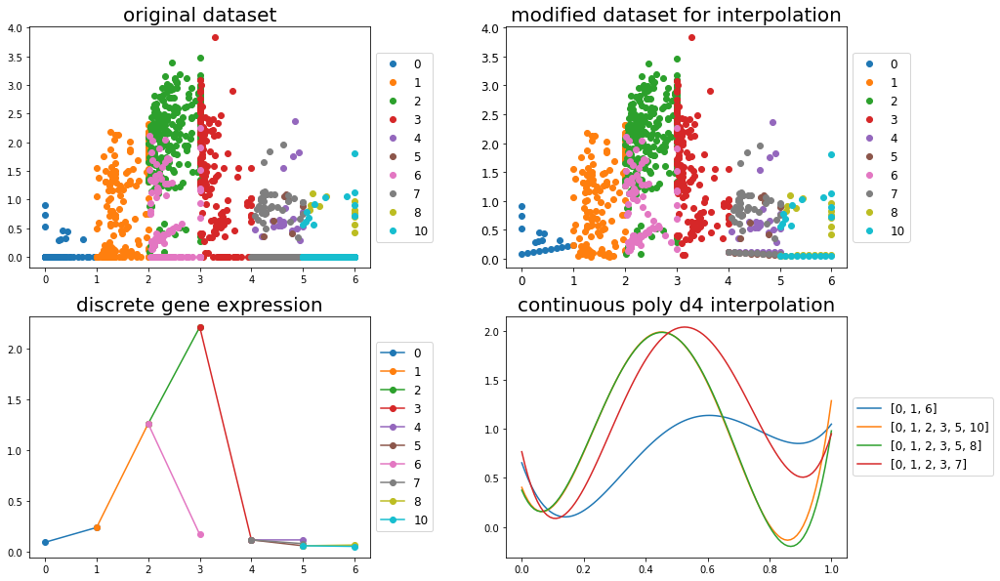

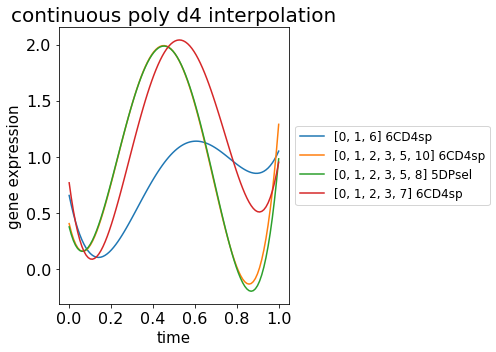

Tcrg-C1 1DN
ANALYSIS_OUTPUT/nocv_it10_top/Tcrg-C1_1_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tcrg-C1_1_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tcrg-C1_1_continuous_4th.png


<Figure size 432x288 with 0 Axes>

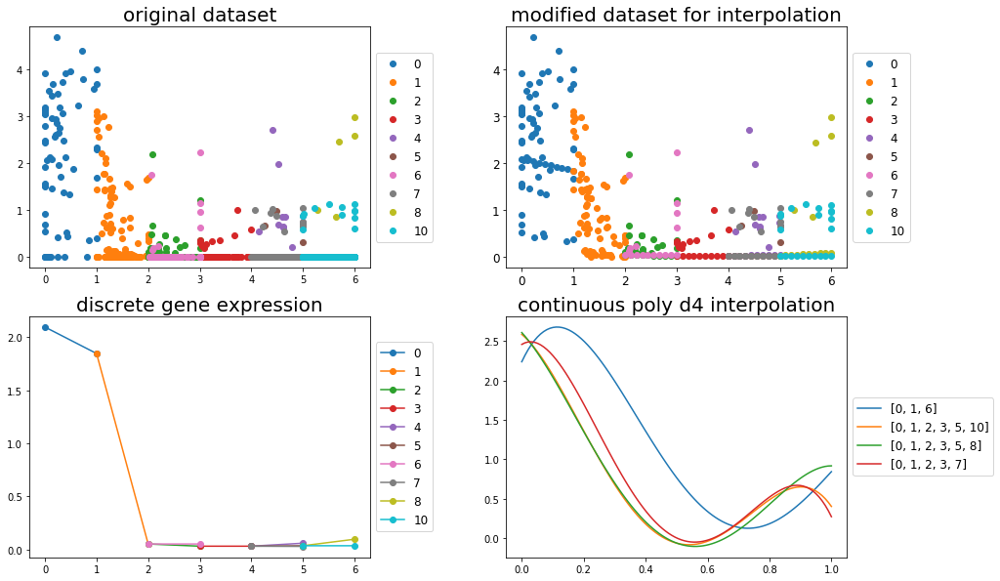

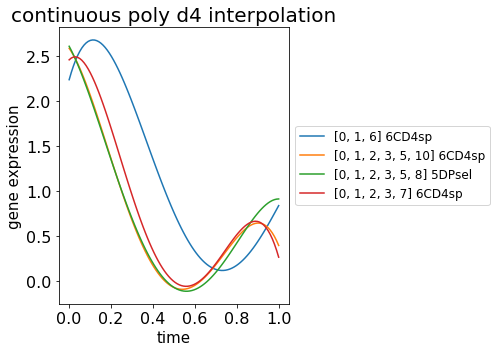

Cdca8 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Cdca8_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdca8_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Cdca8_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

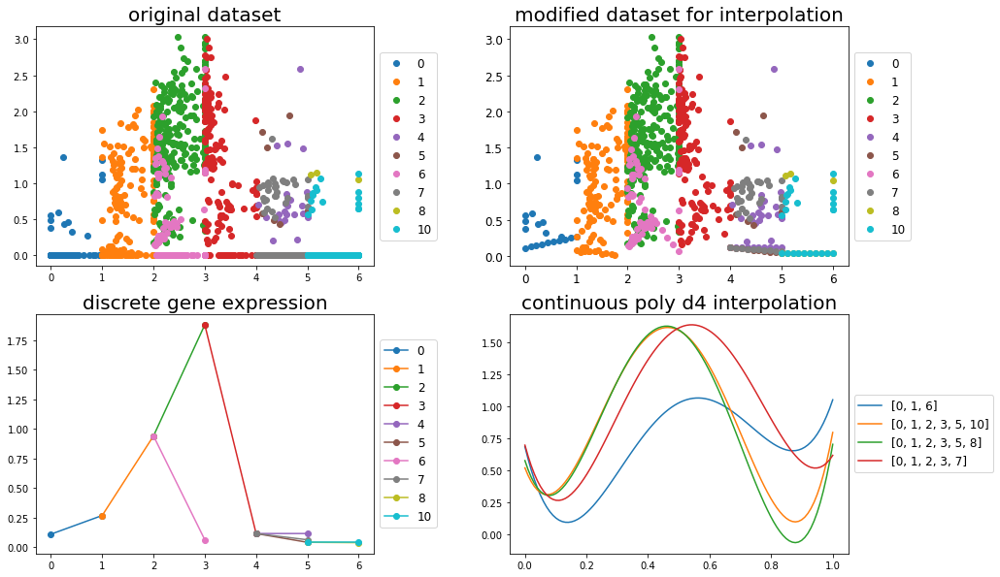

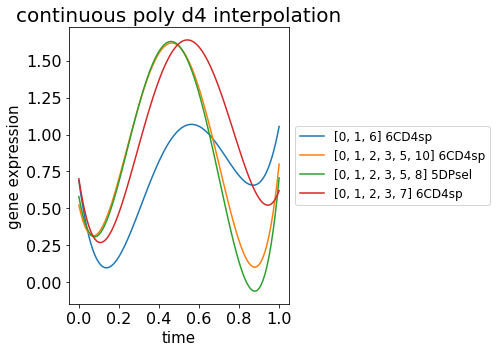

Tcrg-C2 1DN
ANALYSIS_OUTPUT/nocv_it10_top/Tcrg-C2_1_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tcrg-C2_1_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tcrg-C2_1_continuous_4th.png


<Figure size 432x288 with 0 Axes>

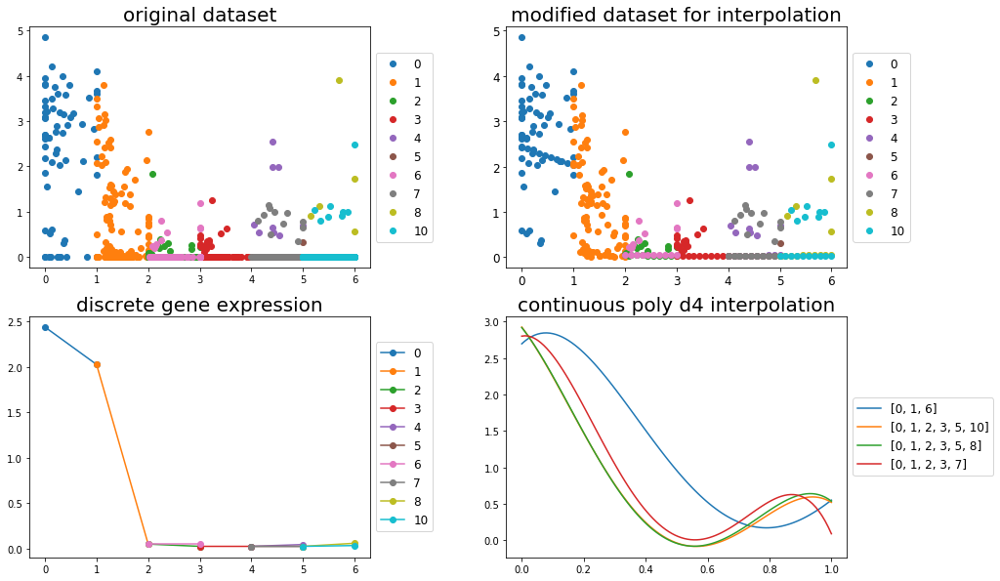

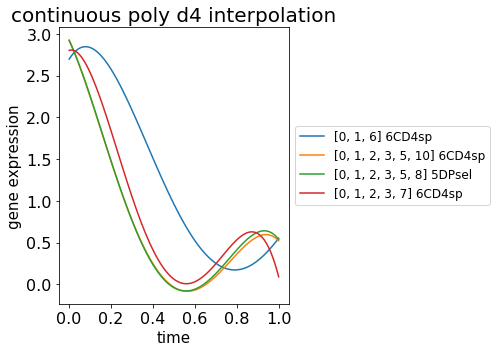

Npm1 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Npm1_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Npm1_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Npm1_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

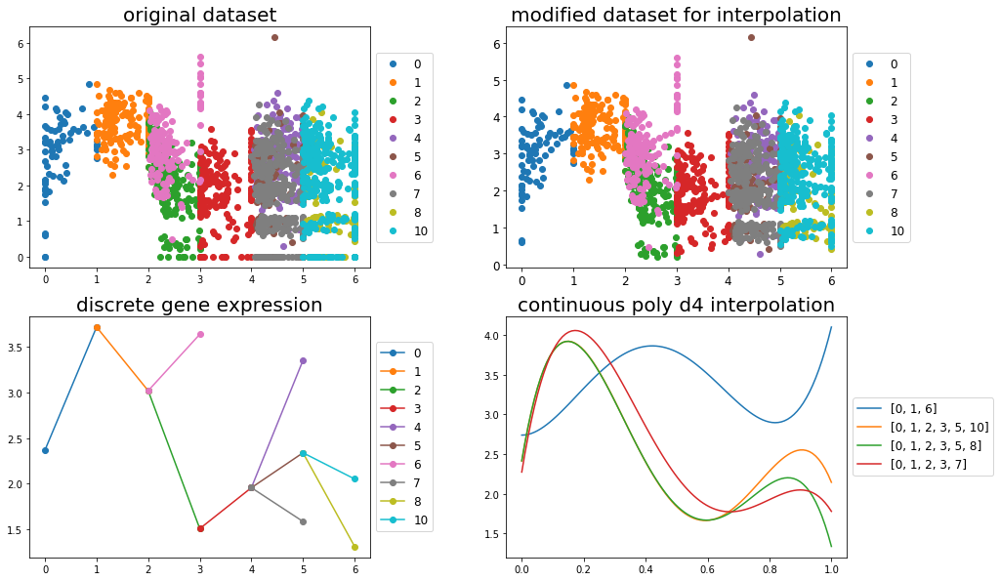

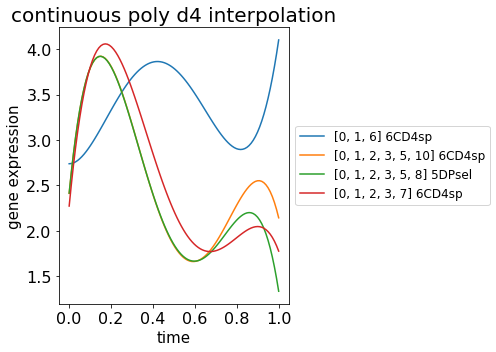

Tcrg-C4 1DN
ANALYSIS_OUTPUT/nocv_it10_top/Tcrg-C4_1_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tcrg-C4_1_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tcrg-C4_1_continuous_4th.png


<Figure size 432x288 with 0 Axes>

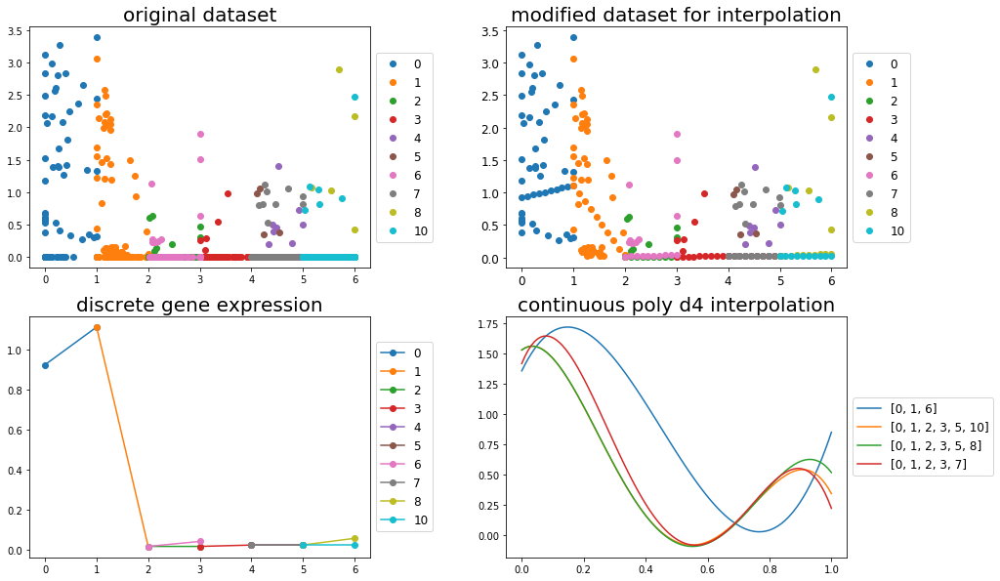

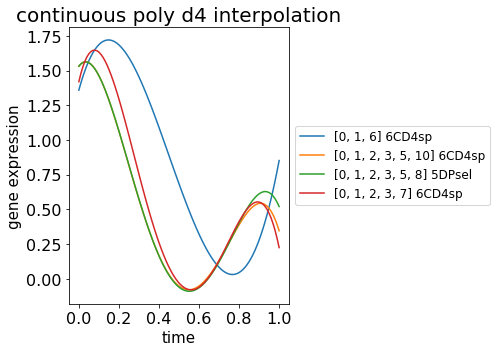

Cd52 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Cd52_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Cd52_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Cd52_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

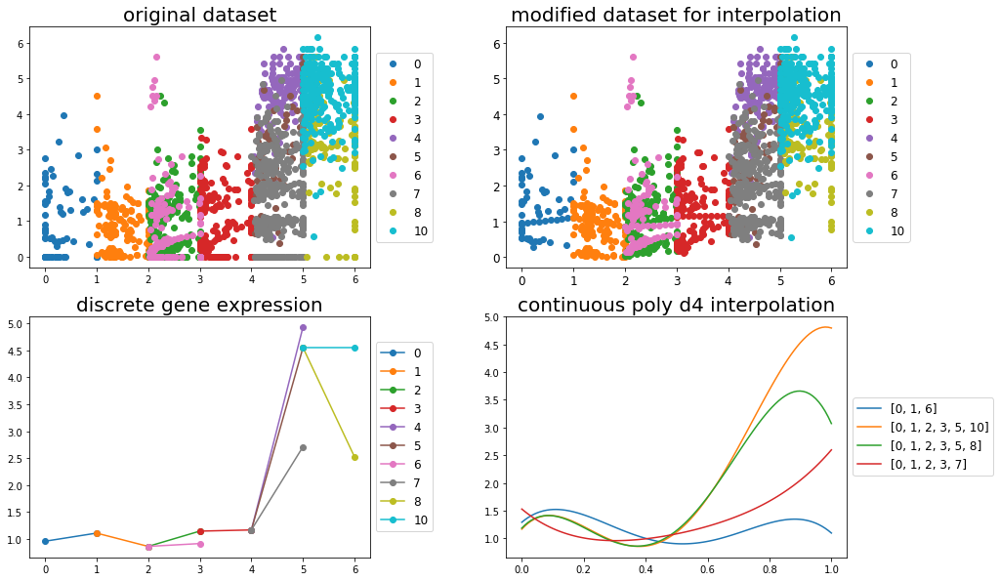

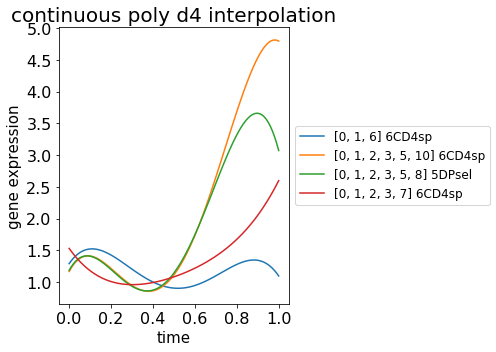

Cd53 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Cd53_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Cd53_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Cd53_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

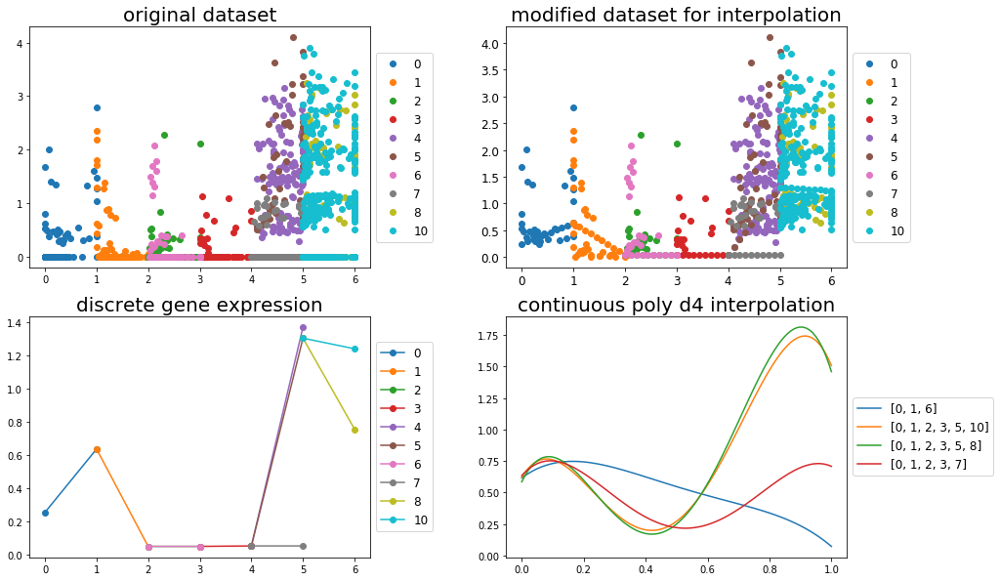

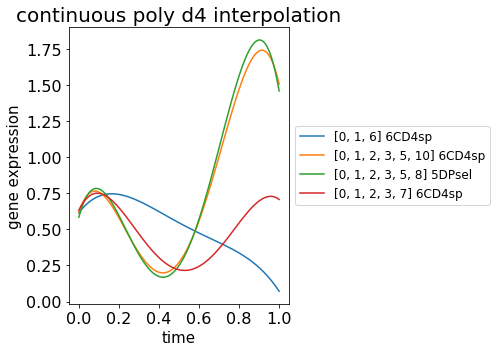

H2-K1 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/H2-K1_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/H2-K1_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/H2-K1_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

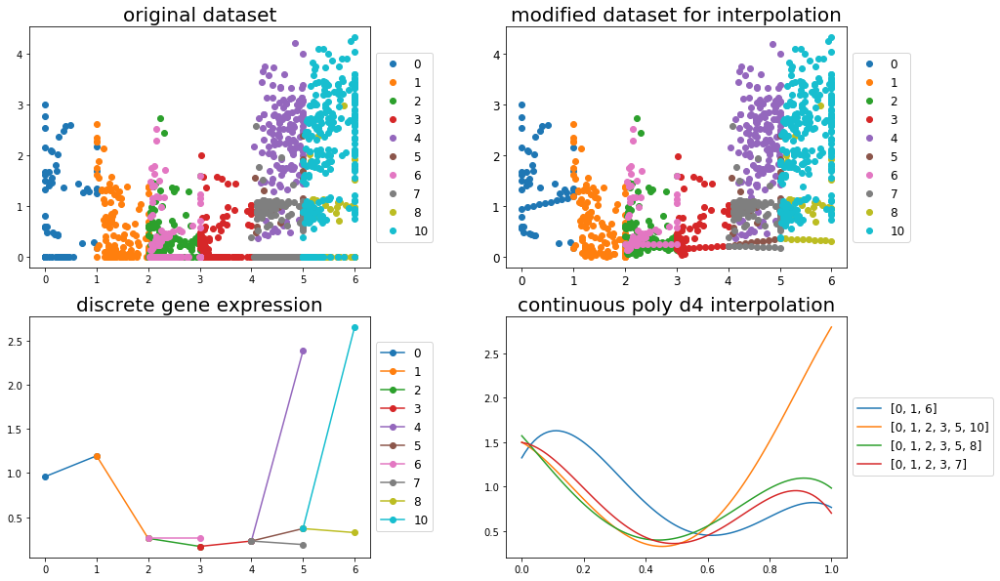

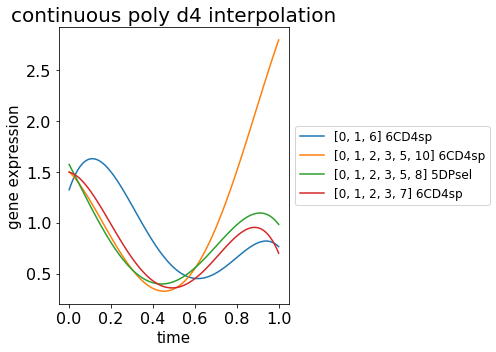

Tuba1c 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Tuba1c_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Tuba1c_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Tuba1c_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

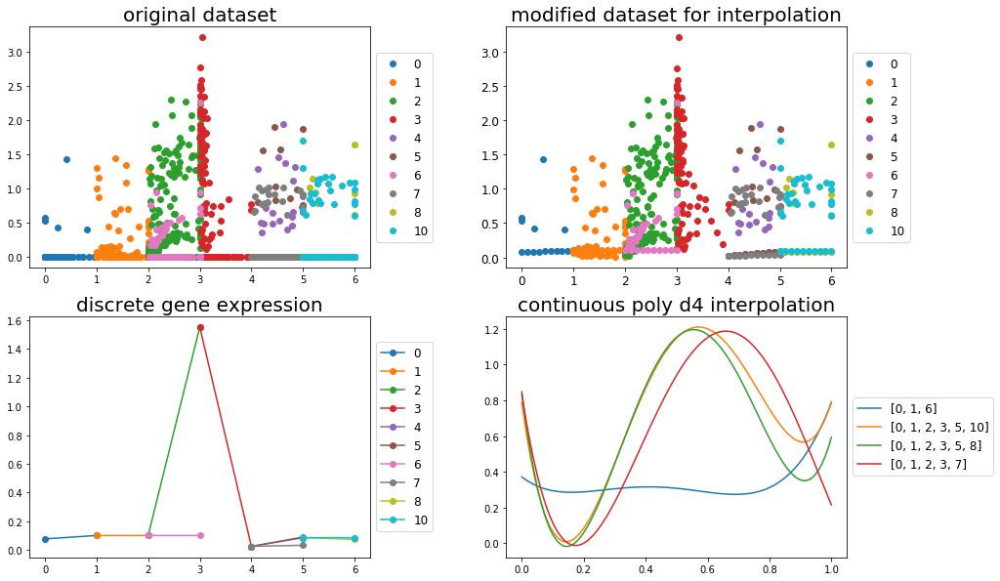

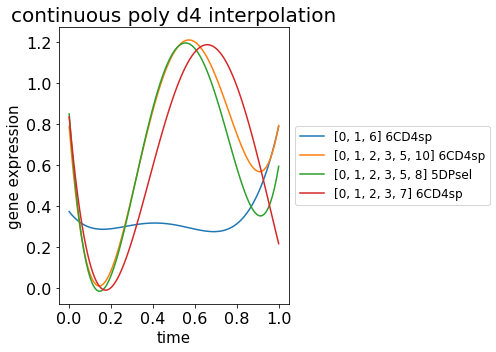

Cd8b1 4DPre
ANALYSIS_OUTPUT/nocv_it10_top/Cd8b1_4_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Cd8b1_4_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Cd8b1_4_continuous_4th.png


<Figure size 432x288 with 0 Axes>

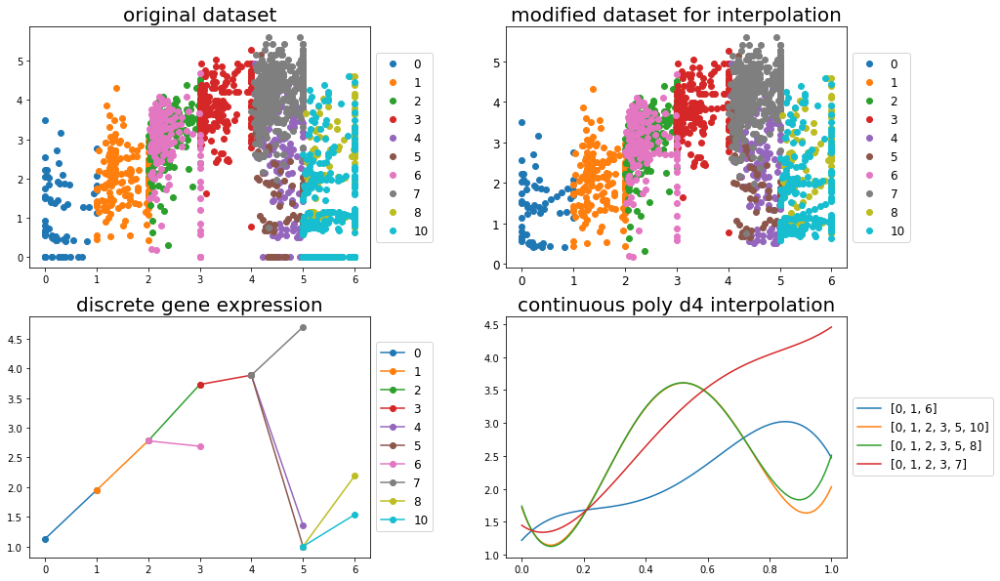

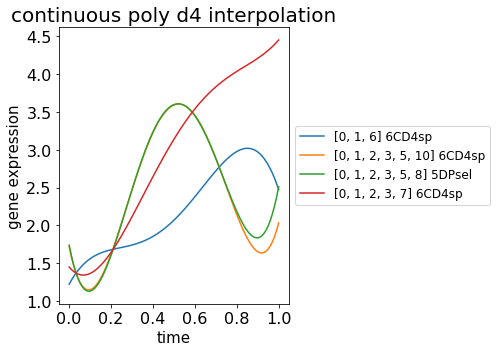

Shisa5 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Shisa5_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Shisa5_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Shisa5_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

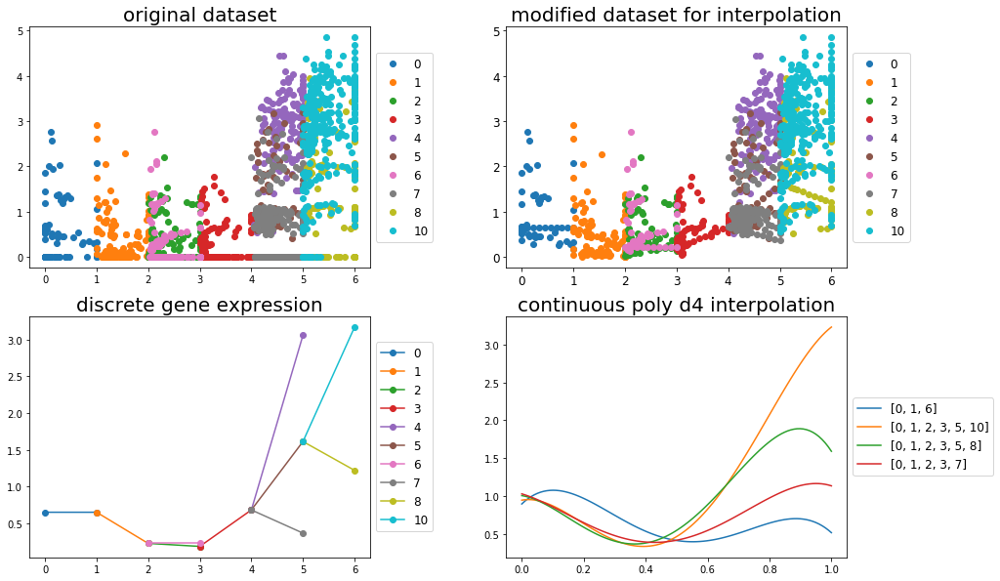

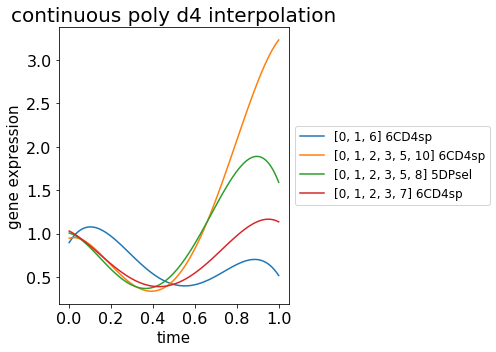

Ms4a4b 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Ms4a4b_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ms4a4b_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ms4a4b_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

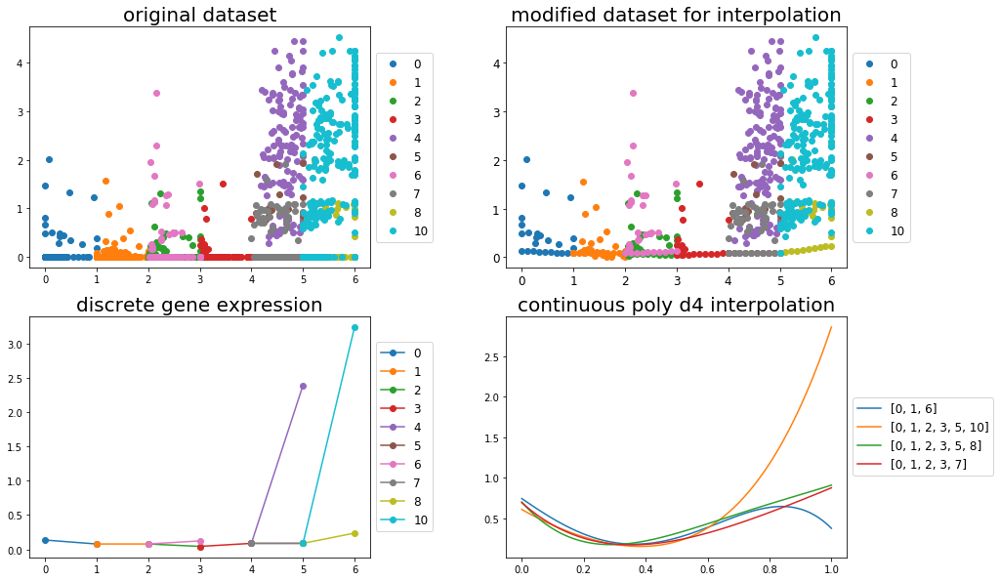

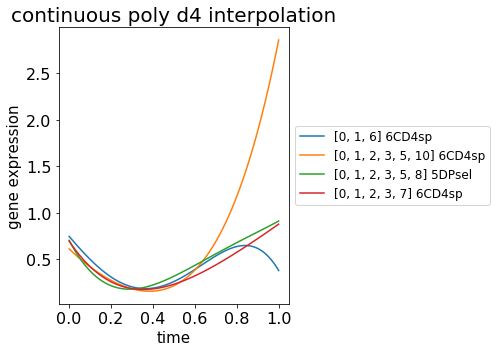

Ifi27l2a 6CD4sp
ANALYSIS_OUTPUT/nocv_it10_top/Ifi27l2a_6_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Ifi27l2a_6_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Ifi27l2a_6_continuous_4th.png


<Figure size 432x288 with 0 Axes>

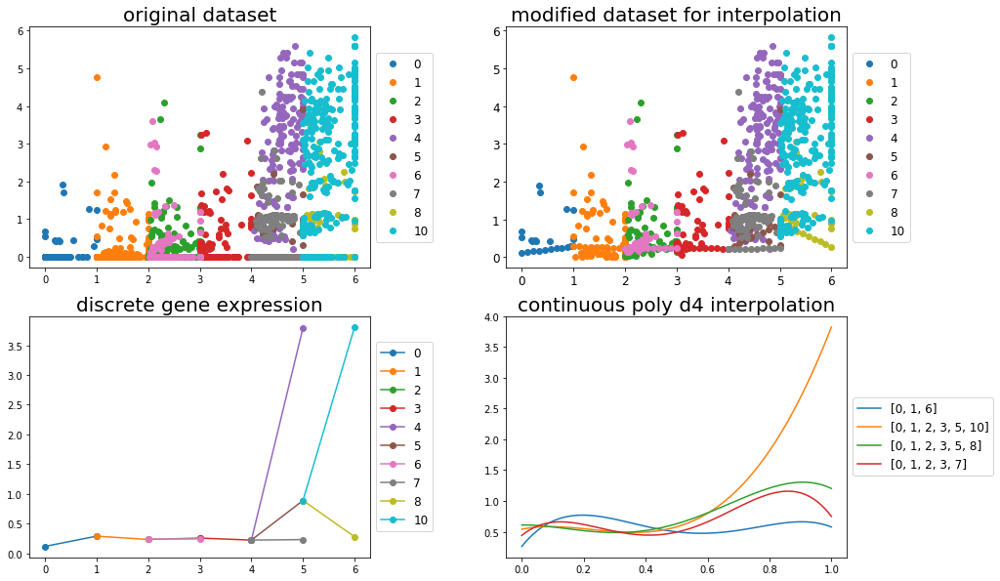

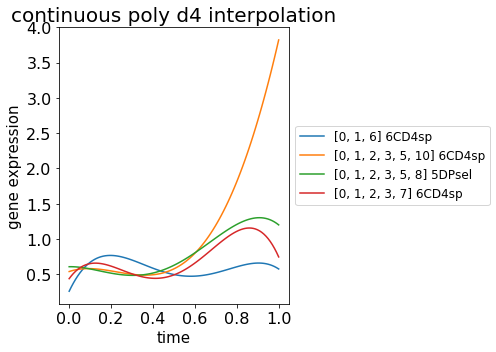

Snhg4 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Snhg4_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Snhg4_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Snhg4_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

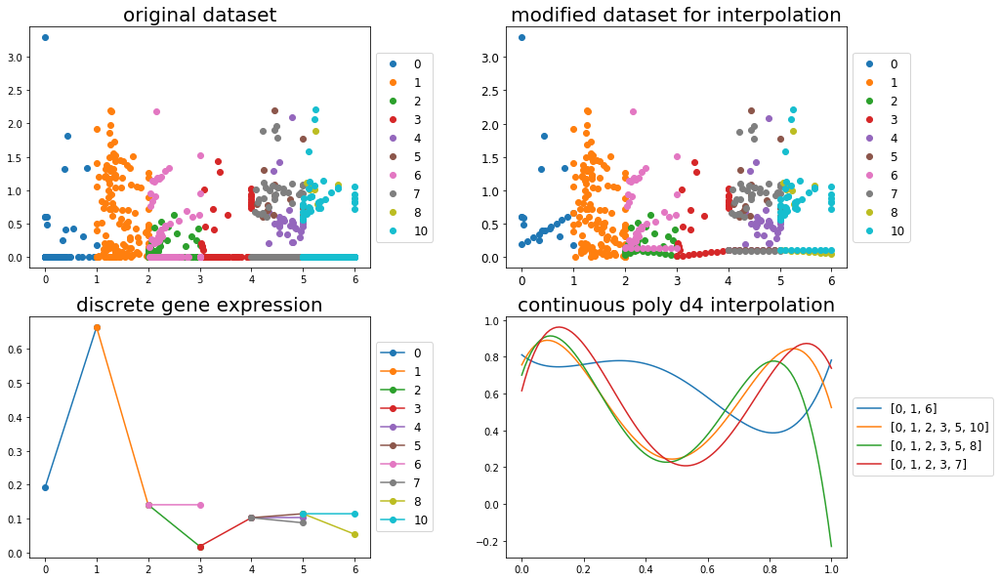

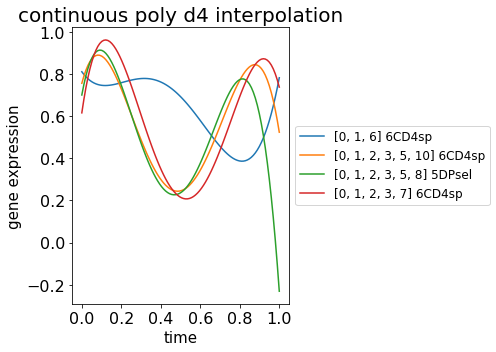

Pcna 3DPbla
ANALYSIS_OUTPUT/nocv_it10_top/Pcna_3_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Pcna_3_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Pcna_3_continuous_4th.png


<Figure size 432x288 with 0 Axes>

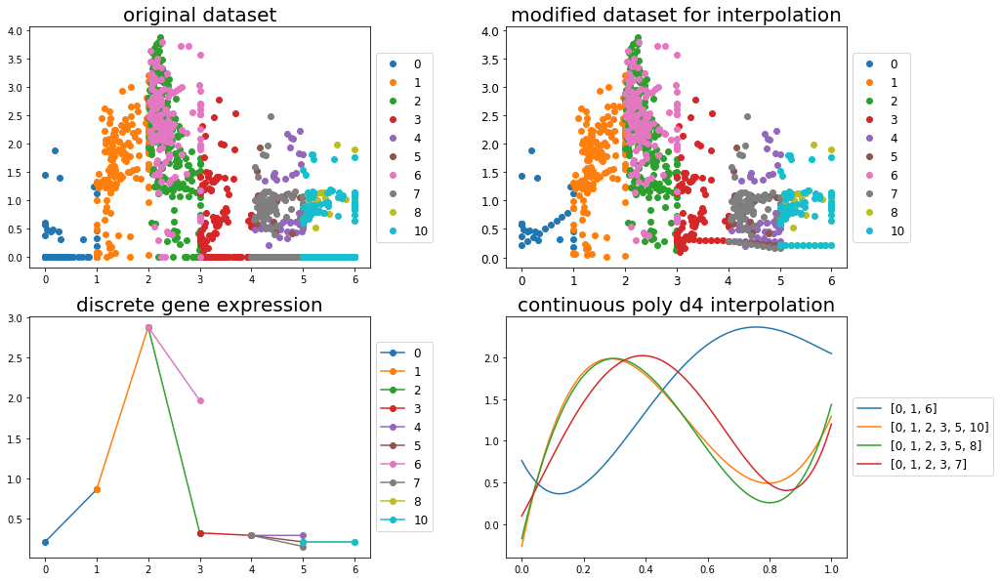

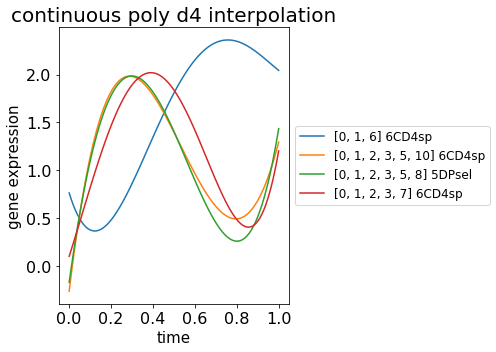

Eif5a 2preDP
ANALYSIS_OUTPUT/nocv_it10_top/Eif5a_2_continuous_all.png
ANALYSIS_OUTPUT/nocv_it10_top/Eif5a_2_continuous_4th_nolegend.png
ANALYSIS_OUTPUT/nocv_it10_top/Eif5a_2_continuous_4th.png


<Figure size 432x288 with 0 Axes>

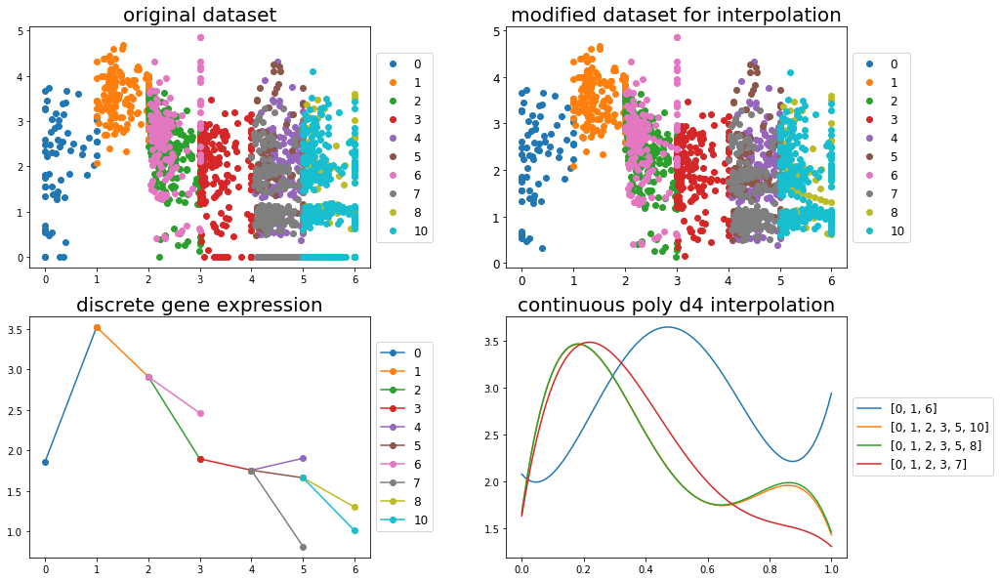

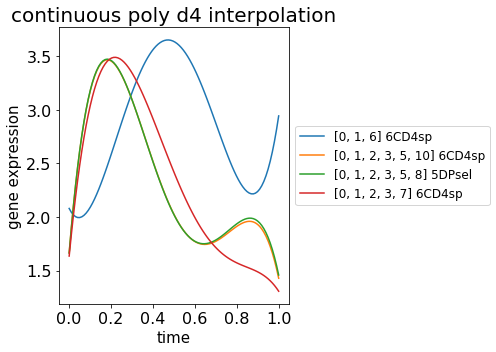

In [38]:
plot_cont_marker_gexp(model_temp,remove_path=tuple([4,3,2,1,0]))

In [8]:
model_temp.keys()

['full_ts_es_dict',
 'p_ge_dict',
 'path_scor_dict',
 'hid_var',
 'out_folder',
 'mk_gene_dict',
 'p_gt_dict',
 'model',
 'mk_gene_list',
 'gene_names']

In [27]:
model_temp['hid_var']['cell_path']

array([5, 5, 7, ..., 2, 4, 7])

In [8]:
# looking at markers
mks = pd.read_csv('marker_dict_data.csv', sep = "\t")

In [12]:
mks[mks.gene.str.contains("Foxp3")]

,Unnamed: 0,gene,bigstage


In [11]:
mks

,Unnamed: 0,gene,bigstage
0,0,Gm10020,1DN
1,1,Pitpnc1,1DN
2,2,mt-Nd2,1DN
3,3,Tm6sf1,1DN
4,4,Pag1,1DN
5,5,Patz1,1DN
6,6,mt-Co1,1DN
7,7,Cbfa2t3,1DN
8,8,B2m,1DN
9,9,Trdc,1DN


In [13]:
# check data
datadf = pd.read_csv(data_file, sep = "\t")

In [20]:
datadf_genes = pd.Series(datadf.columns.tolist())

In [22]:
datadf_genes[datadf_genes.str.contains("Foxp3")]

1215    Foxp3
dtype: object